In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import os,sys, gc
import keras


dirpath = os.getcwd().split("code")[0]+"code/"
sys.path.append(dirpath)
from pre_process import clean_LC,generate_representation
from evaluation import calculate_metrics, evaluate_metadata, evaluate_metadata_raw


folder = "../../KOI_Data/"
folder_lc = "/work/work_teamEXOPLANET/KOI_LC/"

Using TensorFlow backend.


In [2]:
from autoencoder_utils import Recon_eval
Evaluate = Recon_eval()

def evaluate_reconst(x,xhat):
    print("----- EVALUANDO RECONSTRUCCION DE LA CURVA -----")
    res = Evaluate.get_res(x, xhat)
    plt.figure(figsize=(10,4))
    sns.distplot(res.flatten())
    plt.title("Distribucion de residuos promedio")
    plt.show()
    
    print("------------- Error -------------")
    #print("MSE      = ",Evaluate.MSE_LC(None,None, res))
    print("RMSE (+-) = ",Evaluate.RMSE_LC(None,None, res))
    print("MAE  (+-) = ",Evaluate.MAE_LC(None,None, res))
    
    print("------------- Smoothness -------------")
    xhat = np.squeeze(xhat)
    A = np.mean(np.apply_along_axis(Evaluate.autocorr_func, 1, xhat)[:,1])
    print("AutoCorr lag-one = ",A)
    M = np.mean(np.apply_along_axis(Evaluate.mean_diff, 1, xhat))
    print("Diff MEAN = ",M)
    #S = np.mean(np.apply_along_axis(Evaluate.std_diff, 1, xhat))
    #print("Diff STD = ",S)
    
    print("------------- Residual -------------")
    res = np.squeeze(res)
    R = np.mean(np.apply_along_axis(Evaluate.autocorr_func, 1, res)[:,1])
    print("AutoCorr lag-one = ",R)
    perm = np.mean(np.apply_along_axis(Evaluate.series_entropy, 1, res, which='perm'))
    print("Permutation H = ",perm)
    spec = np.mean(np.apply_along_axis(Evaluate.series_entropy, 1, res, which='spec'))
    print("Spectral H = ",spec)
    print("---------------------------------------")

### Create dataset

In [3]:
mask_transit = np.load("data/mask_transit_LC.npy")  #
# datos de abajo debieran ser todas las curvas.. poner mascara sobre los utilziados
mask_transit

array([ True,  True, False, ...,  True,  True,  True])

In [4]:
T = 300
X_fold_lc = np.load("data/LC_global_%dT.npy"%T)
X_fold_lc_aug = np.load("data/LC_globalA_%dT.npy"%T)
X_fold_time = np.load("data/Time_global_%dT.npy"%T)
X_fold_lc.shape

(8054, 300)

In [5]:
## NEW : set mask
X_fold_lc_tr = X_fold_lc[mask_transit]
X_fold_lc_aug_tr = X_fold_lc_aug[mask_transit]
X_fold_time_tr = X_fold_time[mask_transit]
N,T = X_fold_lc_tr.shape

In [6]:
mask_train = np.random.rand(X_fold_lc_tr.shape[0])< 1#0.75
mask_test = ~mask_train

In [7]:
X_train_t = np.concatenate([X_fold_time_tr[mask_train], X_fold_time_tr[mask_train]], axis=0)
X_train = np.concatenate([X_fold_lc_tr[mask_train], X_fold_lc_aug_tr[mask_train]], axis=0)

X_test = X_fold_lc_tr[mask_test]
X_test_t = X_fold_time_tr[mask_test]

X_train = np.expand_dims(X_train, axis=-1)
X_test = np.expand_dims(X_test, axis=-1)

X_train_t = np.expand_dims(X_train_t, axis=-1)
X_test_t = np.expand_dims(X_test_t, axis=-1)

print("X train shape: ",X_train.shape)
print("X train time shape: ",X_train_t.shape)
print("X test shape: ",X_test.shape)

X train shape:  (8634, 300, 1)
X train time shape:  (8634, 300, 1)
X test shape:  (0, 300, 1)


###  NEW

In [8]:
def scaled_MSE(y_true,y_pred,scale):
    return np.mean(np.mean( scale**2 * np.mean( (y_true - y_pred)**2 , axis=1), axis=0))

S_train = np.std(X_train, axis=1)
S_test = np.std(X_test, axis=1)

Sinv_train = 1/S_train
Sinv_test = 1/S_test

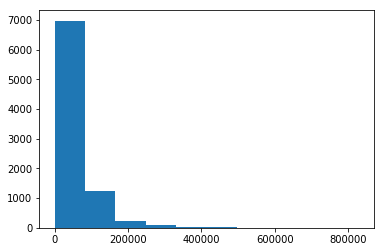

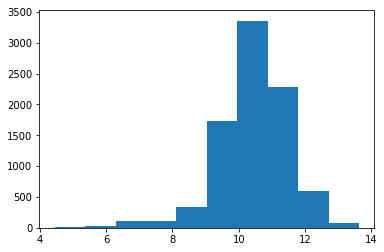

In [9]:
plt.hist(Sinv_train)
plt.show()
plt.hist(np.log(Sinv_train))
plt.show()

### Keras models

In [9]:
from keras import backend as K
from keras.models import Sequential, Model
from keras.layers import *

from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from sklearn.metrics import mean_squared_error
def plot_n_lc(real_lc, decoded_lc, n = 10, s=None):
    for _ in range(n):
        n_sampled = np.random.randint(0, real_lc.shape[0])
        real_lc_n = np.squeeze(real_lc[n_sampled])
        decoded_lc_n = np.squeeze(decoded_lc[n_sampled])
        
        if s !=None:
            print("Real scale = %f\nPred scale = %f"%(s[0][n_sampled], s[1][n_sampled] ))
        f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True,figsize= (15,5))
        ax1.plot(real_lc_n, 'b.-')
        ax1.set_title("Real")
        ax2.plot(decoded_lc_n, 'b.-')
        ax2.set_title("Reconstructed")
        ax3.plot(real_lc_n-decoded_lc_n, 'b.-')
        ax3.set_title("Residuo")
        plt.show()  

        plt.figure(figsize=(15,5))
        plt.plot(real_lc_n, 'bo-', label="Real")
        plt.plot(decoded_lc_n, 'g*-', label="Reconstructed")
        plt.title("Over")
        plt.legend()
        plt.show()
        print("----------------------------------------------------------------")

## SCALED - VAE

Idea: agregar la escala de cada datos como *input* adicional al modelo para obtener representación *raw* como salida **-> inspirador de C-VAE**
 

Idea: aprender el comportamiento/patrones/formas/ de los datos sin su escala (std) - VAE normal ejecutado- de manera simultánea y paralela con la escala de los datos (comúnmente asociada a ruido).
> Ventajas:
* Misma reconstrucción que VAe normal (como es de esperar)
* reconstruye datos en la escala original (representación raw) de la serie de tiempo, permitiendo generar datos aleatorios en esa escala
* Al añadir la escala se tiene más información para aprender, la representación oculta es mejor para detectar planetas (F1 macro-clasificación)

* Cada dato $x^{(i)}$ tiene su escala $s^{(i)} = std(x^{(i)})$
* Primera capa en la curva de luz, se remueve la escala: $ x_s^{(i)} = \frac{x^{(i)}}{s^{(i)}}$
    * En la implementación se maneja $s_{inv}^{(i)} = 1/s^{(i)}$ por comodidad: $ x_s^{(i)} = x^{(i)}*s_{inv}^{(i)}$
    * $x_s^{(i)} \sim \mathcal{N}(0,1)$
* Ultima capa de la curva de luz, se recupera la escala (con una reconstrucción de la escala):  $ \hat{x}^{(i)} = \hat{x}_s^{(i)} * \hat{s}^{(i)}$
    * En la implementación al manejar la inversa de $s$ se tiene:  $ \hat{x}^{(i)} = \frac{\hat{x}_s^{(i)}}{\hat{s}_{inv}^{(i)}}$

* La escala también es codificada, para normalizar los altos valores de los bajos se realiza una transformación logarítmica y se normaliza: 
$$
 Norm_L(a) = \frac{ \log{(a+1)} - mean(\log{(a+1)}) }{ std(\log{(a+1)})}
$$
Los valores de media y desviación estándar son calculados sobre todo el *dataset*.

#### Entrenamiento - Optimización
* Para reconstruir la escala se utiliza *Mean squared logarithm error*:
$$
MSLE(S_{inv}, \hat{S}_{inv}) = \frac{1}{N} \sum_i^N \left( \log{(s_{inv}^{(i)}+1)} - \log{(\hat{s}_{inv}^{(i)}+1)}  \right)^2
$$

* La función *loss* de la reconstrucción se ve modificada al poner un peso sobre cada dato $w_i$, lo mismo que realiza la técnica de *sample weight*. La idea que debido a la diferente escala de los datos, poner un peso que haga que todos los datos tengan la misma influencia en la función objetivo.
$$
SMSE(X, \hat{X}) = \frac{1}{N} \sum_i^N w_i \frac{1}{T} \sum_t^T \left( x_t^{(i)} - \hat{x}_t^{(i)}  \right)^2
$$
El valor $w_i = 1/var(x^{(i)})$, derivado desde: $w_i = \left(s_{inv}^{(i)}\right)^2$, con la idea de remover la escala a $x^{(i)}$ y tener un valor interpretable.

* La *loss* final para entrenar el VAE corresponde a:
$$
loss = SMSE(X, \hat{X}) + \lambda*KL + \alpha*MSLE(S_{inv}, \hat{S}_{inv})
$$
El valor de $\lambda $ para el factor de regularización KL, es un valor pequeño de $10^{-3}$, para lograr que el modelo aprenda los otros valores correctamente. El valor de $\alpha$ es de $10^{-1}/var(\log{(S_{inv}+1)})$, el valor de $10^{-1}$ es para disminuir y  dejarle todo el peso a la reconstrucción $SMSE$, mientras que el valor de $var(\log{(S_{inv}+1)})$ es para remover la escala y dejar en la mismas proporciones que la métrica $SMSE$, viene desde $\left(std(\log{(S_{inv}+1)})\right)^2$

In [18]:
from autoencoder_utils import define_samp_model
from autoencoder_utils import Mul_L,  Div_L
batch_size = 64*2

l = 0.001 #kl weight
latent_dim = 32
_, T, channels = X_train.shape

In [11]:
def KL_loss(z_mean,z_log_var):
    #the mean and log-var of the latent distribution
    def KL(y_true, y_pred):
        return - 0.5 * K.sum(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis=-1)
    return KL

def MSLE_scale_loss(sinv_true, sinv_hat): #Mean squared logarithm error
    #the true and predicted value of the scale^-1 of the data = 1/std
    def MSLE_scale(y_true, y_pred):
        mse_SCALE = K.mean(K.square( K.log(sinv_true) - K.log(sinv_hat) ), axis=-1)
        return mse_SCALE / (Sinvlog_std)**2 #divide in order to MSLE does not have scale
    return MSLE_scale

def SMSE_loss(sinv):
    #sinv is the inverse of scale of the data = 1/std
    def SMSE(y_true, y_pred):
        mse_LC = K.mean( K.square( y_true - y_pred ), axis=1) #on time axis..    
        mse_LC = K.flatten(mse_LC)
        weights = K.square(sinv)[:,0]
        return mse_LC * weights #both values has to be on same shape
    return SMSE

In [12]:
def Norm_L(x,mu,std):
    x = K.log(x) #para normalizar un poco valores gigantes
    return (x - mu)/std

def RevertNorm_L(x,mu,std):
    return K.exp(std*x + mu)

In [15]:
Sinv_mu = np.mean(Sinv_train)
Sinv_std = np.std(Sinv_train) 

Sinvlog_mu = np.mean(np.log(Sinv_train))
Sinvlog_std = np.std(np.log(Sinv_train))
Sinvlog_mu

10.450670099166244

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
T_inp (InputLayer)              (None, 300, 1)       0                                            
__________________________________________________________________________________________________
LC_inp (InputLayer)             (None, 300, 1)       0                                            
__________________________________________________________________________________________________
invscale_inp (InputLayer)       (None, 1)            0                                            
__________________________________________________________________________________________________
encoder (Model)                 [(None, 32), (None,  108930      T_inp[0][0]                      
                                                                 LC_inp[0][0]                     
          

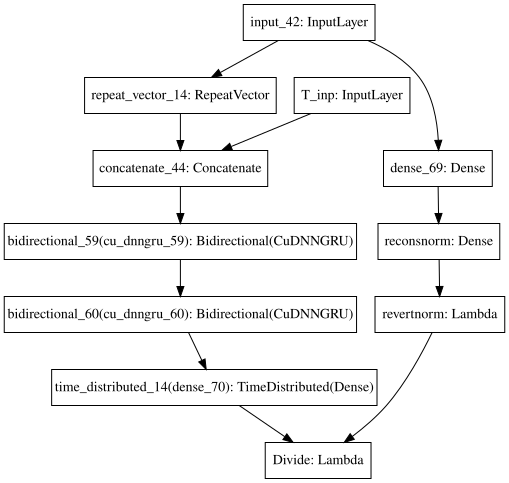

In [146]:
##### INPUTS ENCODER ######
x_lc = Input(shape = (T, channels) , name="LC_inp")
x_t = Input(shape = (T, 1) , name ="T_inp")
sinv = Input(shape= (1,), name="invscale_inp") #para pesar loss
x_lc_s = Lambda(Mul_L, name="Multiply")([x_lc, sinv]) #NEW: quitar escala del dato (o escalar a una version normal)

##### CODIFY LIGHT CURVE ######
x = Concatenate(axis=-1)([x_t, x_lc_s]) 
f1 = Bidirectional(CuDNNGRU(64, return_sequences=True))(x)
f1 = Bidirectional(CuDNNGRU(64, return_sequences=False))(f1) 

##### CODIFY SCALE AND CONCATENATE ######
f1_s = Lambda(Norm_L, arguments={'mu':Sinvlog_mu,'std':Sinvlog_std}, name="norm")(sinv) #mas capas?
f1_s = Dense(1, activation='tanh')(f1_s) #o tanh

f1 = Concatenate(axis=-1)([f1, f1_s]) #NEW: agregar escala a codificar

##### GET THE LATENT VARIABLE ######
z_mean = Dense(latent_dim,activation='linear')(f1)
z_log_var = Dense(latent_dim,activation='linear')(f1)
encoder = Model([x_t, x_lc, sinv], [z_mean,z_log_var], name="encoder")
samp_model = define_samp_model(latent_dim) #model to sample


##### INPUTS DECODER ######
decoder_input = Input(shape=(latent_dim,))

##### RECONSTRCT SCALE ######
s_out = Dense(1, activation='tanh')(decoder_input)
s_out = Dense(1, activation='linear', name="reconsnorm")(s_out) #NEW: aprende s 
s_out = Lambda(RevertNorm_L, arguments={'mu':Sinvlog_mu,'std':Sinvlog_std},name="revertnorm")(s_out) #NEW: volver a escala normal 
sinv_hat = Model(decoder_input, s_out)(samp_model(encoder([x_t, x_lc, sinv])))
Sinv_model = Model([x_t, x_lc, sinv], sinv_hat)

##### RECONSTRUCT LIGHT CURVE ######
decode = RepeatVector(T)(decoder_input)
decode = Concatenate(axis=-1)([x_t, decode]) #add time decode
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional

decode = TimeDistributed(Dense(1, activation='linear'))(decode)
decode = Lambda(Div_L, name="Divide")([decode, s_out]) #NEW: recuperar escala de dato (multiplicar por std)
generator = Model([x_t, decoder_input], decode, name="generator")


##### VAE MODEL ######
out = generator([x_t, samp_model(encoder([x_t, x_lc, sinv])) ])
vae = Model([x_t, x_lc, sinv], out)


#define loss functions over model components
smse_LC = SMSE_loss(sinv)
mse_S = MSLE_scale_loss(sinv, sinv_hat) 
kl_loss = KL_loss(z_mean, z_log_var)

def Wvae_loss(y_true, y_pred):    
    return smse_LC(y_true, y_pred) + l*kl_loss(y_true, y_pred)

vae.compile(optimizer='adam', loss=Wvae_loss, metrics = [smse_LC,kl_loss, mse_S])
vae.summary()

SVG(model_to_dot(generator).create(prog='dot', format='svg'))

### loss normal de VAE

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


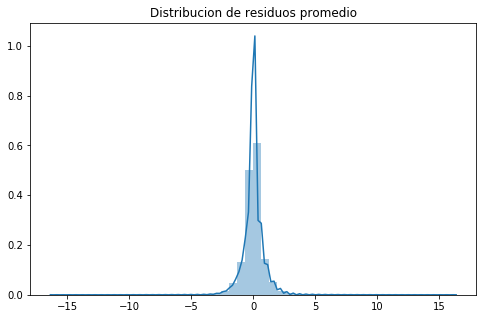

MSE      =  0.6962120074740263
RMSE (+-)=  0.8109581984574059
MAE  (+-)=  0.5191557483323184
--------- Smoothness ------------
AutoCorr lag-one =  0.8836251044170177
Diff MEAN =  0.03278605742671098
Diff STD =  0.13745297287535993
--------- Smoothness ------------
MSE de escala escalado=  482.813432332647


array([[3.1087054e+02],
       [1.5963703e+04],
       [4.4294852e+04],
       ...,
       [1.4332772e+04],
       [1.9134682e+06],
       [2.0732324e+04]], dtype=float32)

In [24]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], Sinv_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]*Sinv_train[:N,None,:], X_train_hat*Sinv_train[:N,None,:])

Sinv_train_hat = Sinv_model.predict([X_train_t[:N],X_train[:N], Sinv_train[:N]], batch_size=512)
print("MSE de escala escalado= ",scaled_MSE((Sinv_train[:N]-Sinv_mu)/Sinv_std, (Sinv_train_hat-Sinv_mu)/Sinv_std,1 ))
Sinv_train_hat

Real scale = 9484.801004
Pred scale = 7037.355957


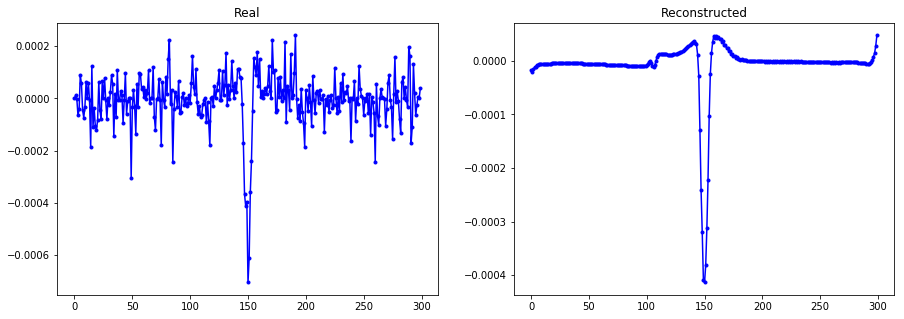

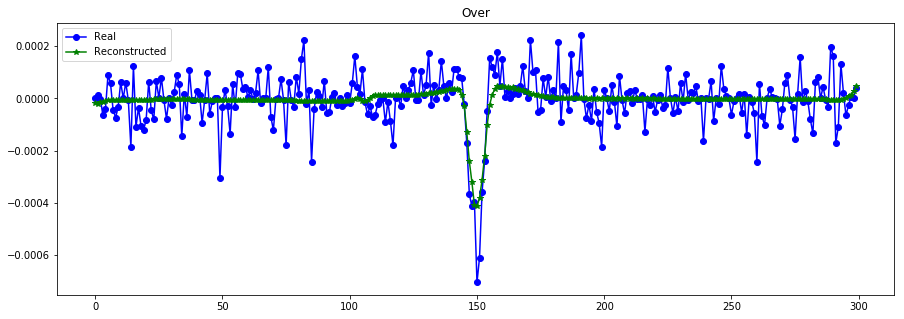

----------------------------------------------------------------
Real scale = 56711.888561
Pred scale = 18013.482422


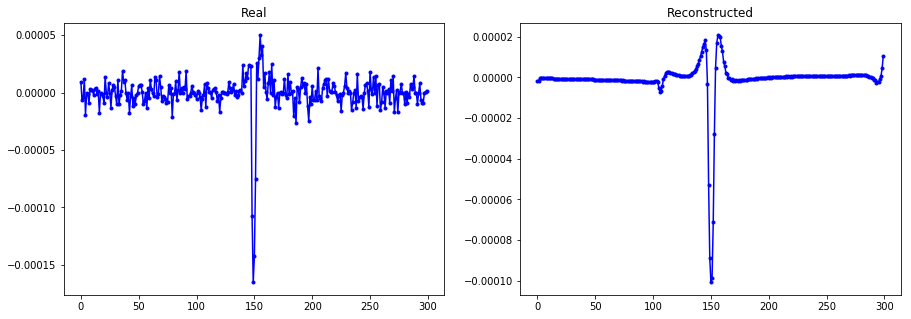

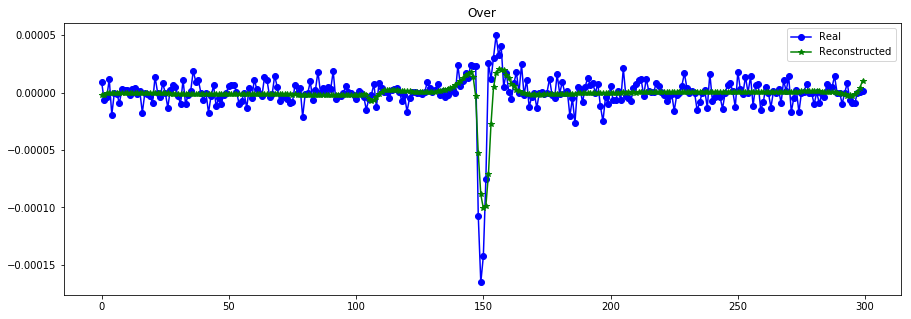

----------------------------------------------------------------
Real scale = 21760.682757
Pred scale = 13497.458984


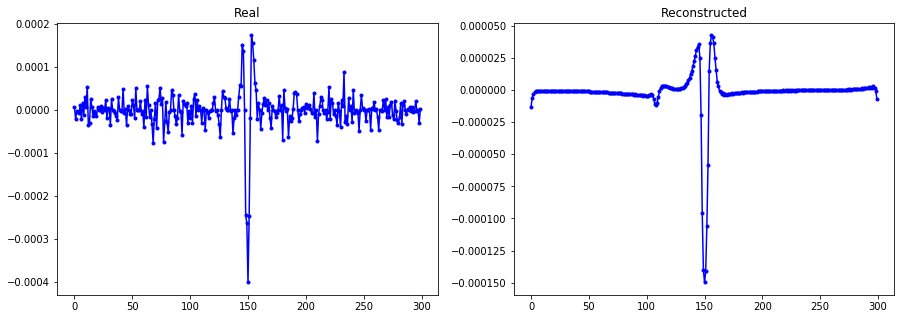

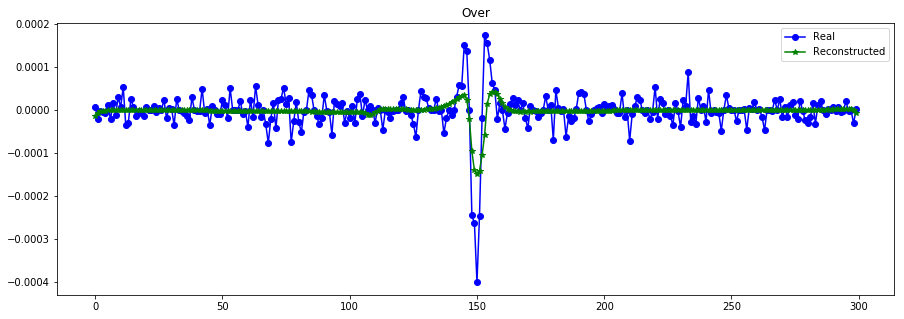

----------------------------------------------------------------
Real scale = 134068.231723
Pred scale = 268903.937500


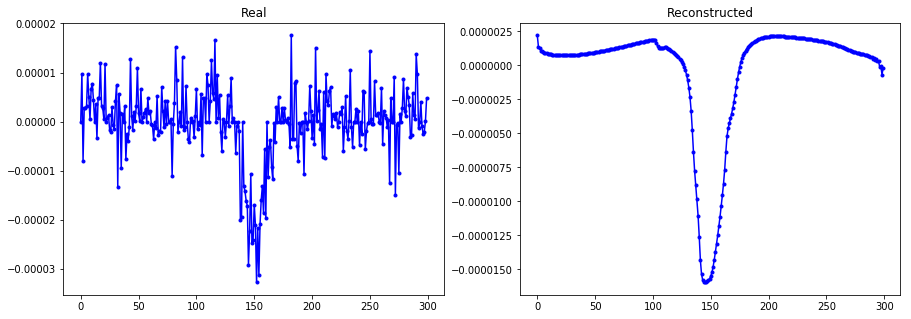

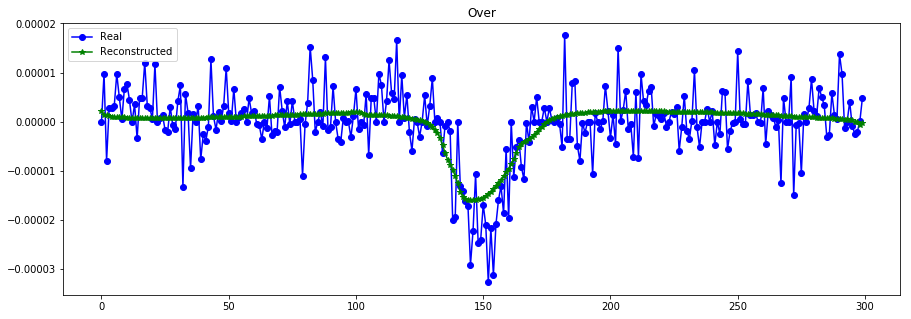

----------------------------------------------------------------
Real scale = 29563.096272
Pred scale = 22164.548828


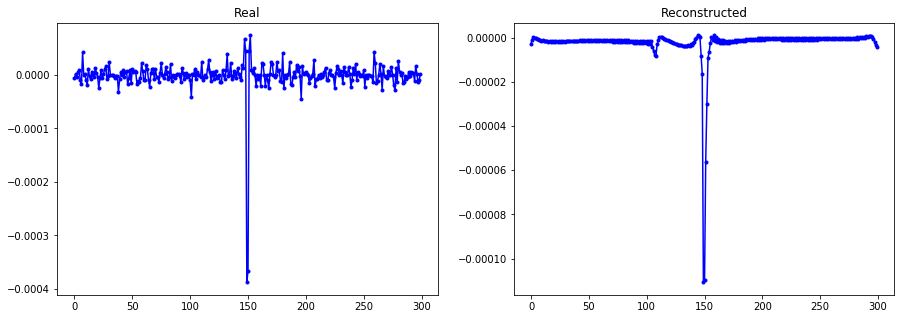

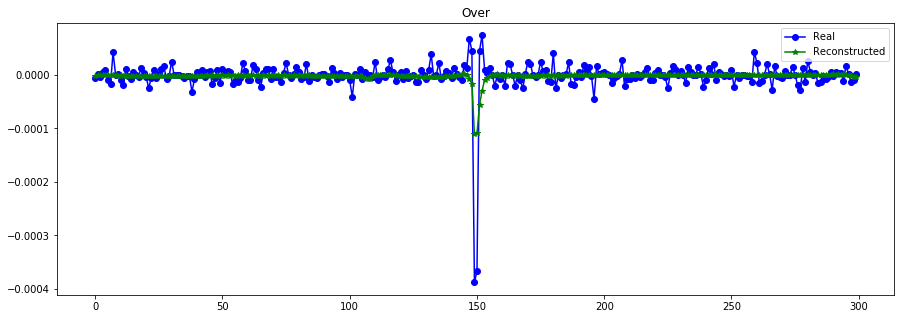

----------------------------------------------------------------
Real scale = 19210.290346
Pred scale = 20448.404297


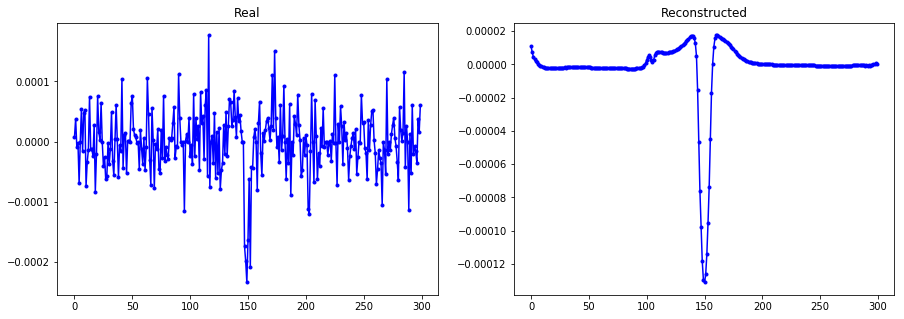

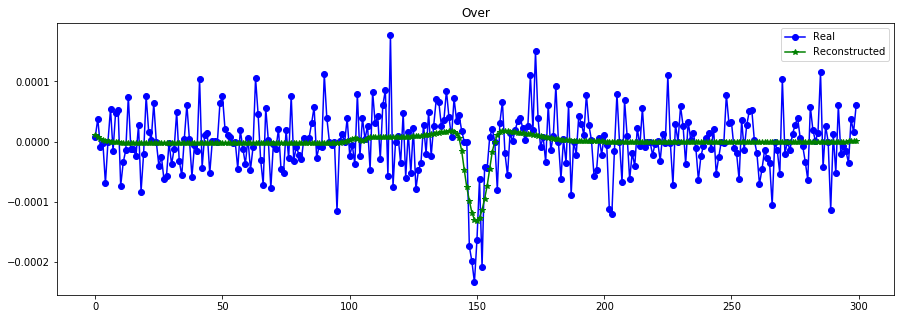

----------------------------------------------------------------
Real scale = 73113.811038
Pred scale = 594486.375000


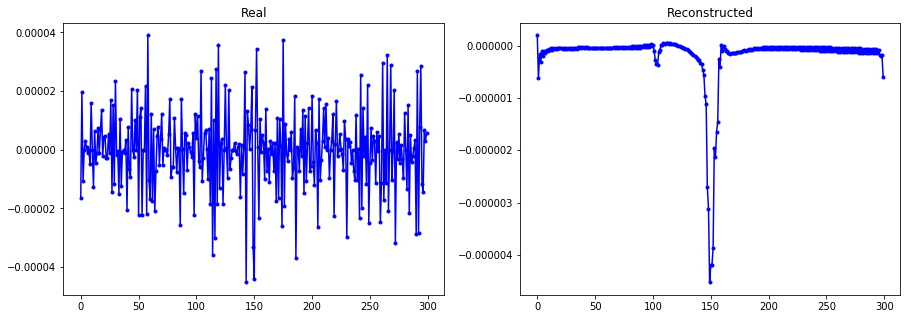

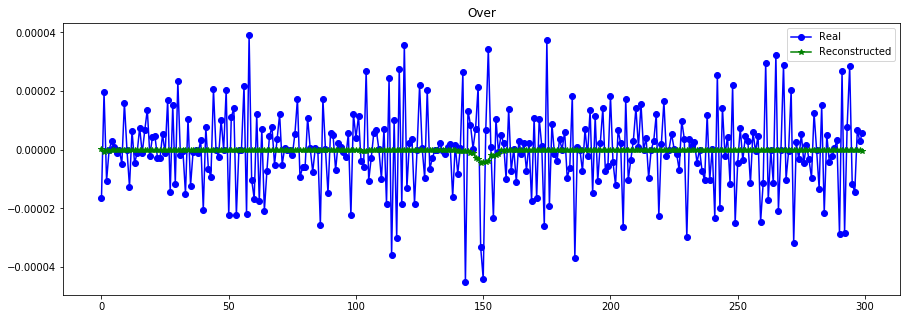

----------------------------------------------------------------
Real scale = 49948.986459
Pred scale = 57228.550781


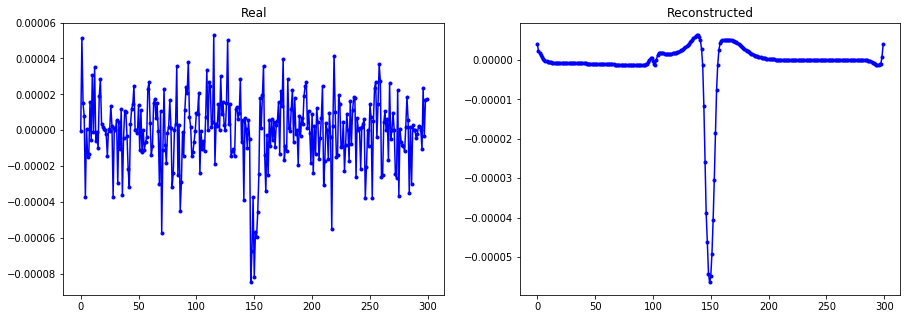

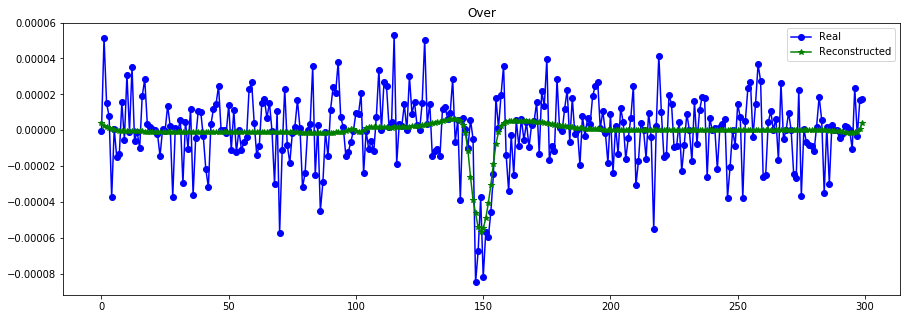

----------------------------------------------------------------
Real scale = 98990.870567
Pred scale = 296633.343750


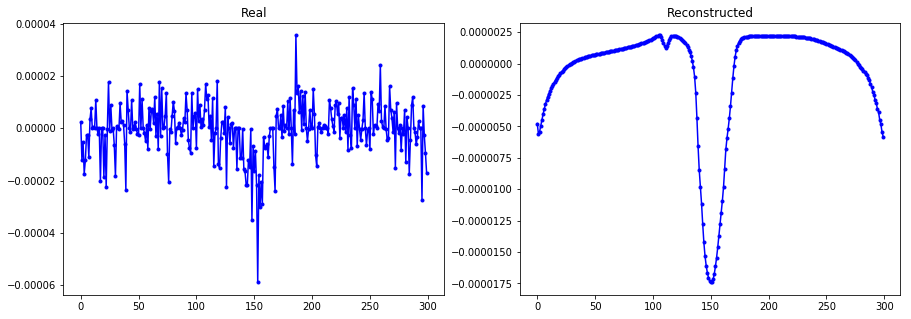

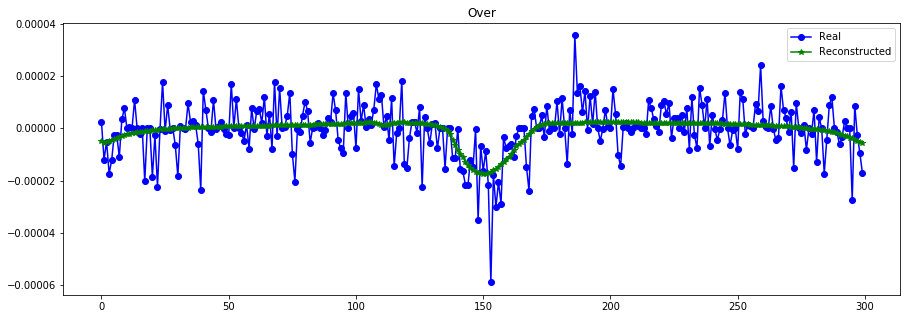

----------------------------------------------------------------
Real scale = 23922.119935
Pred scale = 21763.787109


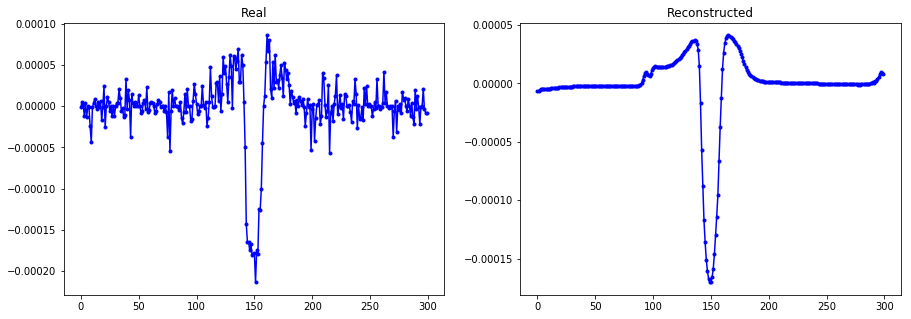

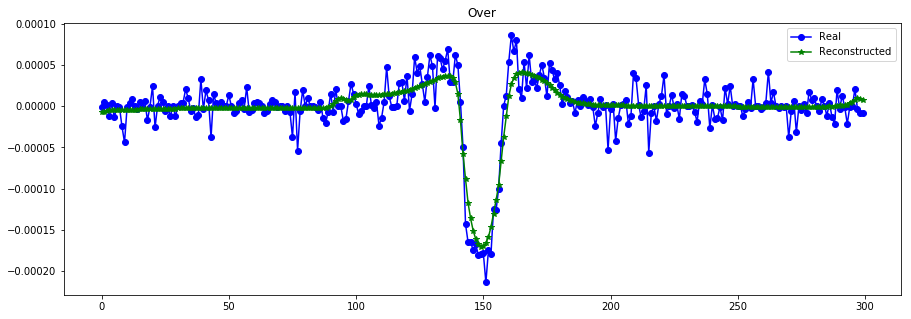

----------------------------------------------------------------
Real scale = 45127.251189
Pred scale = 759455.937500


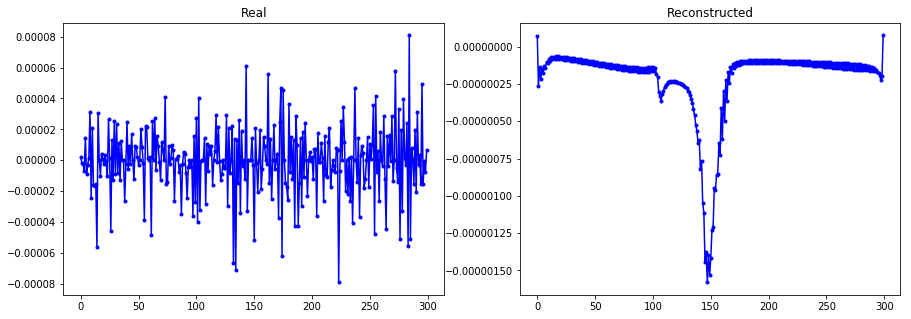

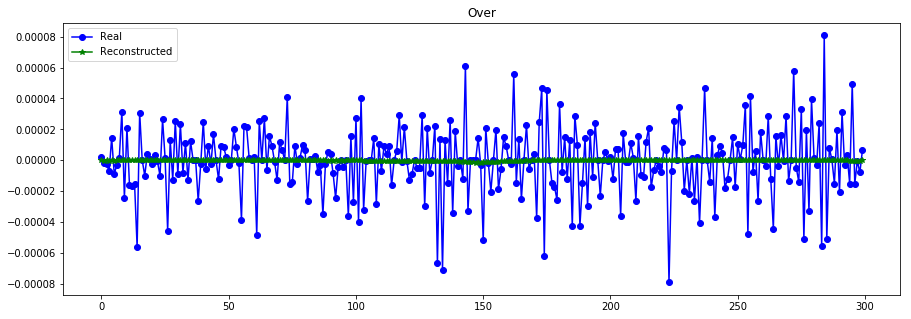

----------------------------------------------------------------
Real scale = 25732.254228
Pred scale = 11835.542969


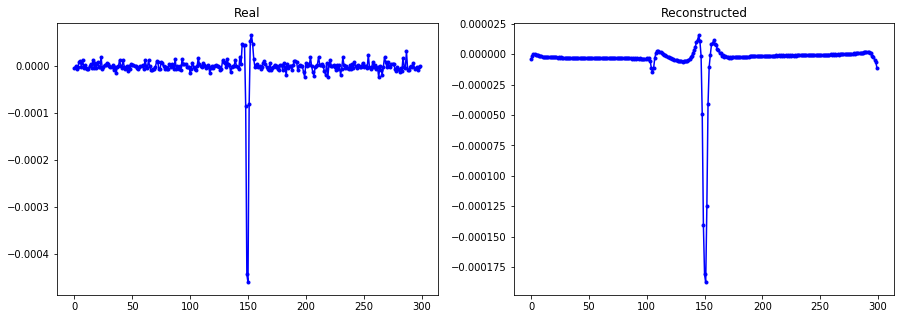

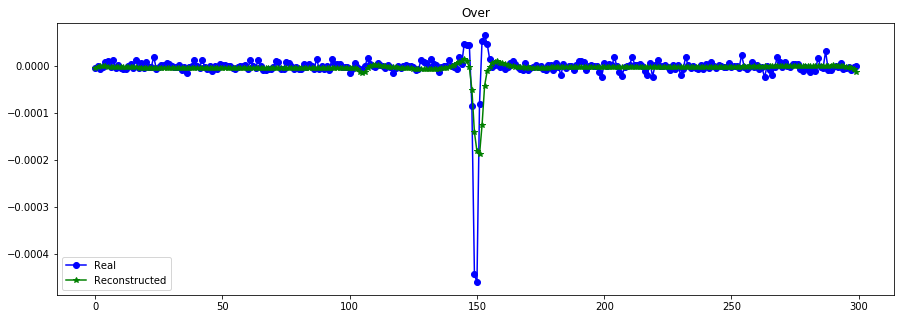

----------------------------------------------------------------
Real scale = 21338.048304
Pred scale = 25052.666016


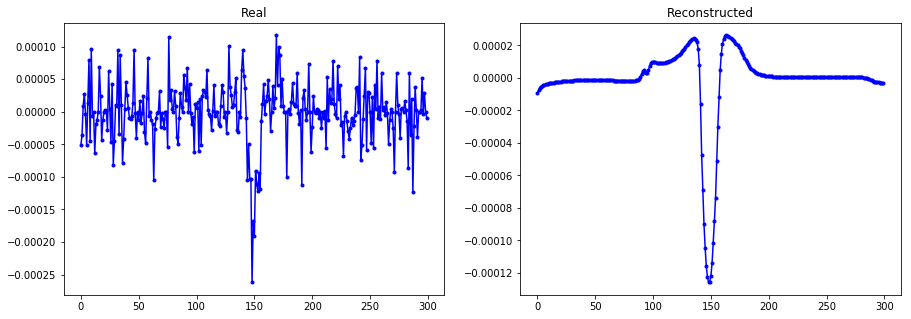

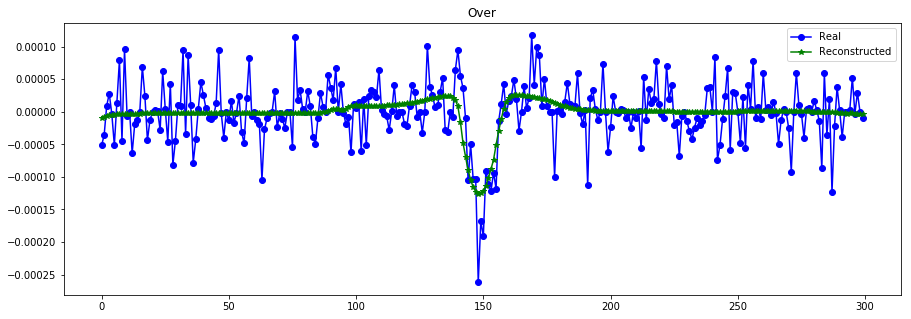

----------------------------------------------------------------
Real scale = 24593.559630
Pred scale = 21939.964844


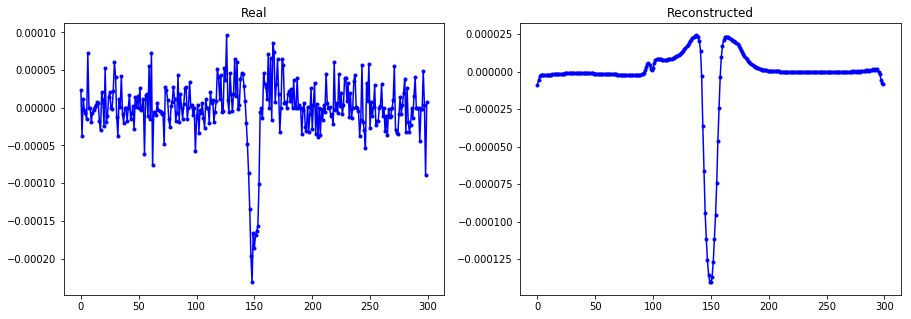

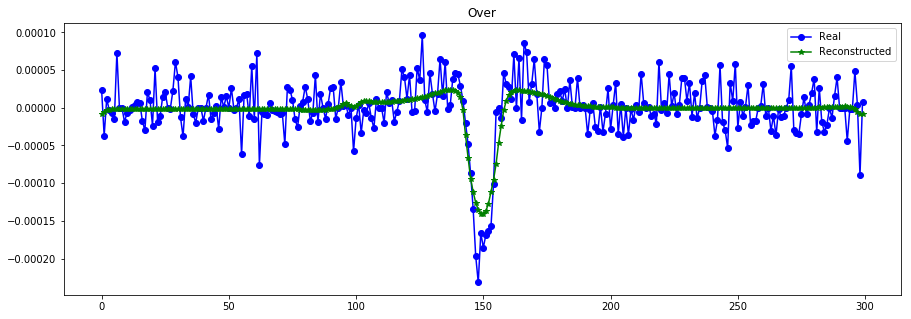

----------------------------------------------------------------
Real scale = 461509.059294
Pred scale = 679875.250000


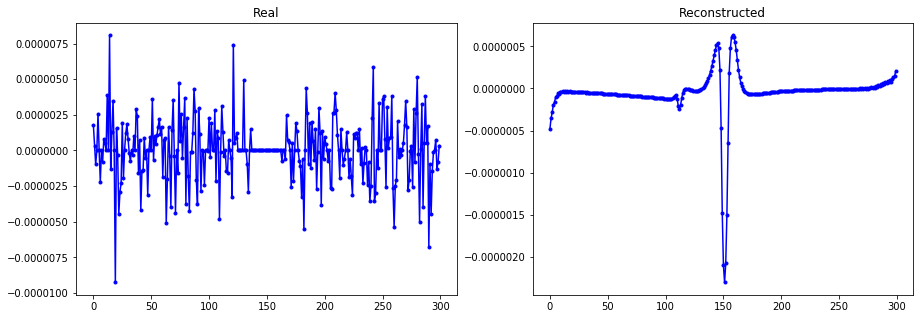

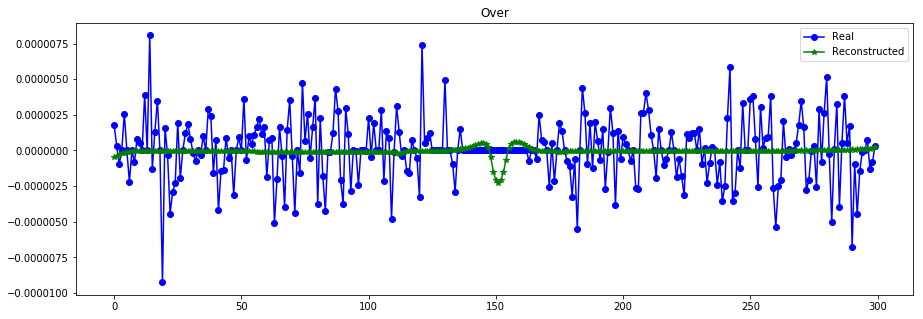

----------------------------------------------------------------


In [25]:
plot_n_lc(X_train[:N,:,0], X_train_hat, n= 15, s=[Sinv_train[:N],Sinv_train_hat]) #

### con loss sobre escala tambien

In [28]:
def Wvae_loss(y_true, y_pred):    
    return smse_LC(y_true, y_pred) + l*kl_loss(y_true, y_pred) + mse_S(y_true, y_pred)

vae.compile(optimizer='adam', loss=Wvae_loss, metrics = [smse_LC,kl_loss,mse_S])

hist = vae.fit([X_train_t, X_train, Sinv_train], X_train, epochs=400, batch_size=batch_size)
        #validation_split=0.25) 

Epoch 1/400
8634/8634 [==============================] - 29s 3ms/step - loss: 2.5360 - MSE_loss: 1.3078e-07 - KL_loss: 1.0638 - MSE_scale: 1.1738
Epoch 2/400
8634/8634 [==============================] - 25s 3ms/step - loss: 1.3973 - MSE_loss: 1.3065e-07 - KL_loss: 26.9931 - MSE_scale: 0.3653
Epoch 3/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.2026 - MSE_loss: 1.3059e-07 - KL_loss: 40.7626 - MSE_scale: 0.1600
Epoch 4/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.1754 - MSE_loss: 1.3056e-07 - KL_loss: 39.6960 - MSE_scale: 0.1340
Epoch 5/400
8634/8634 [==============================] - 25s 3ms/step - loss: 1.1621 - MSE_loss: 1.3051e-07 - KL_loss: 39.4320 - MSE_scale: 0.1210
Epoch 6/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.1521 - MSE_loss: 1.3048e-07 - KL_loss: 39.8275 - MSE_scale: 0.1108
Epoch 7/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.1392 - MSE_loss: 1.3037e-07 - KL_loss: 

8634/8634 [==============================] - 25s 3ms/step - loss: 0.7690 - MSE_loss: 3.1226e-08 - KL_loss: 27.0409 - MSE_scale: 0.0031
Epoch 112/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7744 - MSE_loss: 3.2419e-08 - KL_loss: 27.0491 - MSE_scale: 0.0028
Epoch 113/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7799 - MSE_loss: 3.2527e-08 - KL_loss: 26.3531 - MSE_scale: 0.0034
Epoch 114/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7703 - MSE_loss: 3.1472e-08 - KL_loss: 26.8888 - MSE_scale: 0.0027
Epoch 115/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7782 - MSE_loss: 3.1162e-08 - KL_loss: 26.1617 - MSE_scale: 0.0029
Epoch 116/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7638 - MSE_loss: 2.8703e-08 - KL_loss: 26.0549 - MSE_scale: 0.0030
Epoch 117/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7857 - MSE_loss: 3.2021e-08 - KL_loss:

8634/8634 [==============================] - 25s 3ms/step - loss: 0.7344 - MSE_loss: 2.7522e-08 - KL_loss: 24.5293 - MSE_scale: 0.0023
Epoch 167/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7309 - MSE_loss: 2.5821e-08 - KL_loss: 24.9942 - MSE_scale: 0.0025
Epoch 168/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7615 - MSE_loss: 2.9036e-08 - KL_loss: 23.9383 - MSE_scale: 0.0029
Epoch 169/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7350 - MSE_loss: 2.5272e-08 - KL_loss: 24.4046 - MSE_scale: 0.0026
Epoch 170/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7573 - MSE_loss: 3.0380e-08 - KL_loss: 23.5534 - MSE_scale: 0.0028
Epoch 171/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7483 - MSE_loss: 2.8169e-08 - KL_loss: 23.9016 - MSE_scale: 0.0030
Epoch 172/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7332 - MSE_loss: 2.5773e-08 - KL_loss:

8634/8634 [==============================] - 25s 3ms/step - loss: 0.7232 - MSE_loss: 2.4356e-08 - KL_loss: 24.1871 - MSE_scale: 0.0023
Epoch 222/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7251 - MSE_loss: 2.4441e-08 - KL_loss: 23.9873 - MSE_scale: 0.0021
Epoch 223/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7151 - MSE_loss: 2.2919e-08 - KL_loss: 24.3585 - MSE_scale: 0.0019
Epoch 224/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7022 - MSE_loss: 2.1009e-08 - KL_loss: 24.0827 - MSE_scale: 0.0019
Epoch 225/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7153 - MSE_loss: 2.2326e-08 - KL_loss: 24.3894 - MSE_scale: 0.0020
Epoch 226/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7142 - MSE_loss: 2.1928e-08 - KL_loss: 24.1870 - MSE_scale: 0.0022
Epoch 227/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7215 - MSE_loss: 2.4412e-08 - KL_loss:

8634/8634 [==============================] - 25s 3ms/step - loss: 0.6977 - MSE_loss: 2.0260e-08 - KL_loss: 24.9054 - MSE_scale: 0.0022
Epoch 277/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6814 - MSE_loss: 1.8412e-08 - KL_loss: 24.7111 - MSE_scale: 0.0018
Epoch 278/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7110 - MSE_loss: 1.9283e-08 - KL_loss: 24.3462 - MSE_scale: 0.0022
Epoch 279/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.6863 - MSE_loss: 2.2749e-08 - KL_loss: 24.4673 - MSE_scale: 0.0019
Epoch 280/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.6812 - MSE_loss: 1.8538e-08 - KL_loss: 24.3792 - MSE_scale: 0.0019
Epoch 281/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.6813 - MSE_loss: 1.8116e-08 - KL_loss: 24.8991 - MSE_scale: 0.0019
Epoch 282/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6989 - MSE_loss: 1.7954e-08 - KL_loss:

8634/8634 [==============================] - 25s 3ms/step - loss: 0.6985 - MSE_loss: 2.1229e-08 - KL_loss: 25.4936 - MSE_scale: 0.0023
Epoch 332/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.6705 - MSE_loss: 1.6054e-08 - KL_loss: 25.1548 - MSE_scale: 0.0021
Epoch 333/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.6515 - MSE_loss: 1.5126e-08 - KL_loss: 25.7978 - MSE_scale: 0.0018
Epoch 334/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6535 - MSE_loss: 1.4787e-08 - KL_loss: 25.6747 - MSE_scale: 0.0017
Epoch 335/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.6575 - MSE_loss: 1.4384e-08 - KL_loss: 25.6143 - MSE_scale: 0.0021
Epoch 336/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.6588 - MSE_loss: 1.4996e-08 - KL_loss: 25.6958 - MSE_scale: 0.0021
Epoch 337/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.6446 - MSE_loss: 1.4520e-08 - KL_loss:

8634/8634 [==============================] - 25s 3ms/step - loss: 0.6403 - MSE_loss: 1.2589e-08 - KL_loss: 25.7283 - MSE_scale: 0.0016
Epoch 387/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.6493 - MSE_loss: 1.3043e-08 - KL_loss: 26.0226 - MSE_scale: 0.0016
Epoch 388/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.6344 - MSE_loss: 1.3089e-08 - KL_loss: 25.6497 - MSE_scale: 0.0016
Epoch 389/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.6131 - MSE_loss: 1.0063e-08 - KL_loss: 25.3490 - MSE_scale: 0.0015
Epoch 390/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.6201 - MSE_loss: 1.2089e-08 - KL_loss: 25.2491 - MSE_scale: 0.0016
Epoch 391/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6415 - MSE_loss: 1.3631e-08 - KL_loss: 25.8679 - MSE_scale: 0.0016
Epoch 392/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.6285 - MSE_loss: 1.0981e-08 - KL_loss:

/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


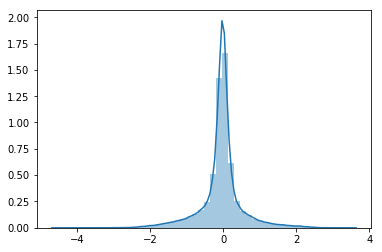

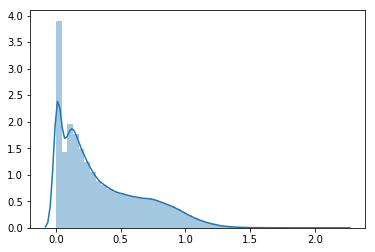

In [29]:
encoder_all = Model([x_t, x_lc,s], [z_mean, z_log_var], name="encoder")
z_aux, z_var_aux = encoder_all.predict([X_train_t,X_train, Sinv_train], batch_size=512)

sns.distplot(z_aux.flatten())
plt.show()
sns.distplot(np.exp(z_var_aux.flatten()))
plt.show()

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


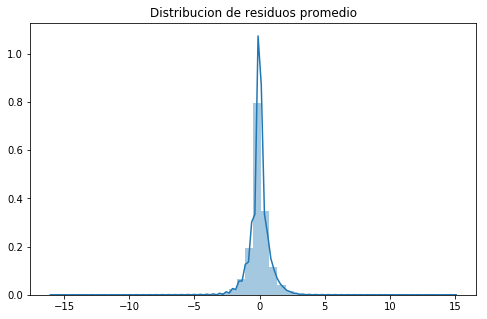

MSE      =  0.632405281536608
RMSE (+-)=  0.7692728846091076
MAE  (+-)=  0.4949288082892694
--------- Smoothness ------------
AutoCorr lag-one =  0.5796407883344092
Diff MEAN =  0.07470465173997198
Diff STD =  0.4045326795967392
--------- Smoothness ------------
MSE de escala escalado=  0.010310658399792871


array([[  853.6259],
       [21733.111 ],
       [84811.51  ],
       ...,
       [16374.502 ],
       [43017.367 ],
       [15769.644 ]], dtype=float32)

In [30]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], Sinv_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]*Sinv_train[:N,None,:], X_train_hat*Sinv_train[:N,None,:])

Sinv_train_hat = Sinv_model.predict([X_train_t[:N],X_train[:N], Sinv_train[:N]], batch_size=512)
print("MSE de escala escalado= ",scaled_MSE((Sinv_train[:N]-Sinv_mu)/Sinv_std, (Sinv_train_hat-Sinv_mu)/Sinv_std,1 ))
Sinv_train_hat

Real scale = 85.389943
Pred scale = 117.018822


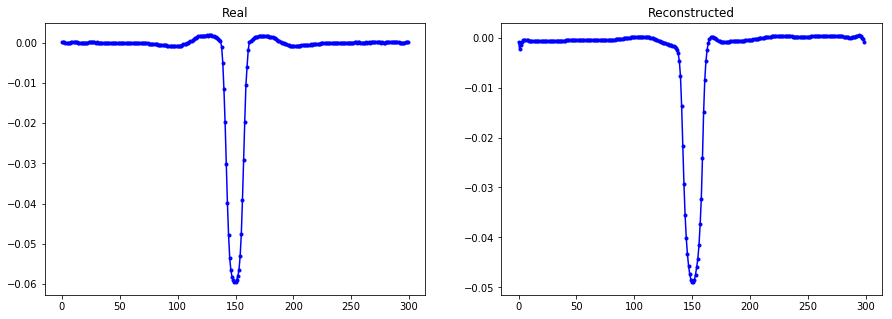

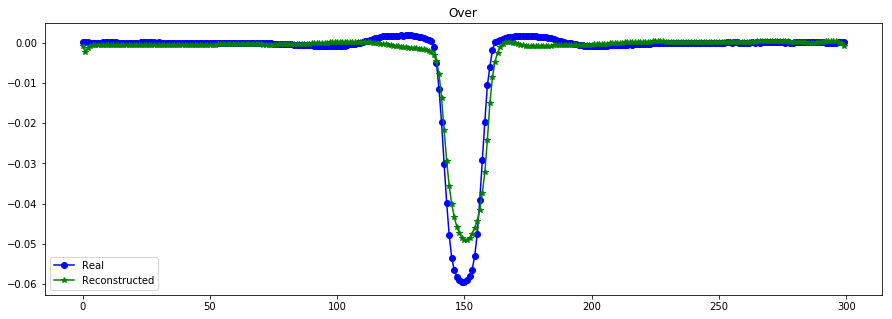

----------------------------------------------------------------
Real scale = 28766.629367
Pred scale = 29302.916016


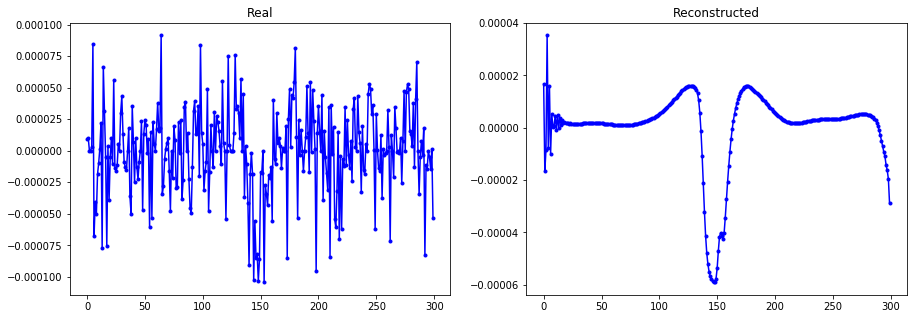

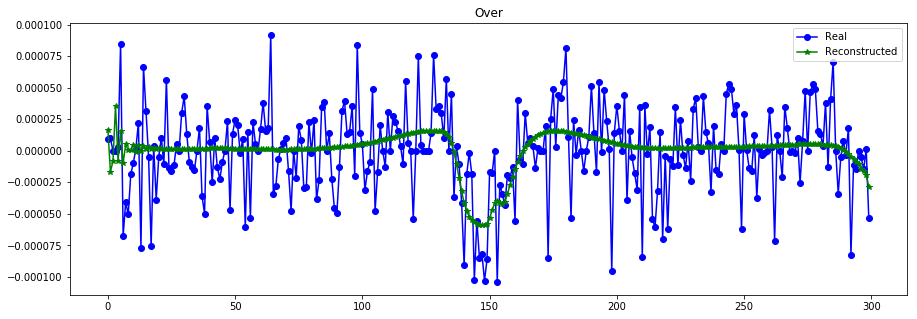

----------------------------------------------------------------
Real scale = 23631.225193
Pred scale = 23291.779297


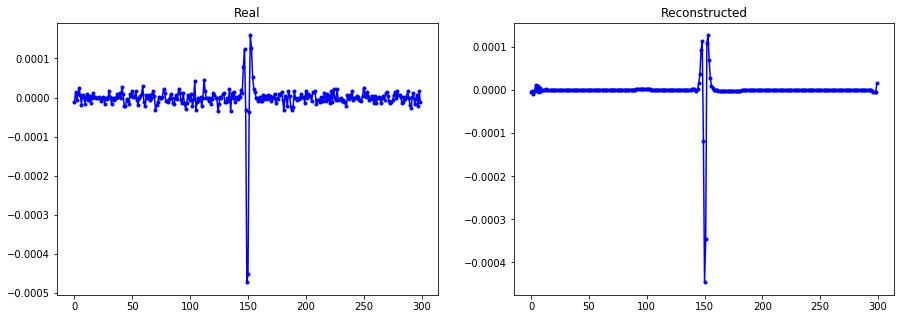

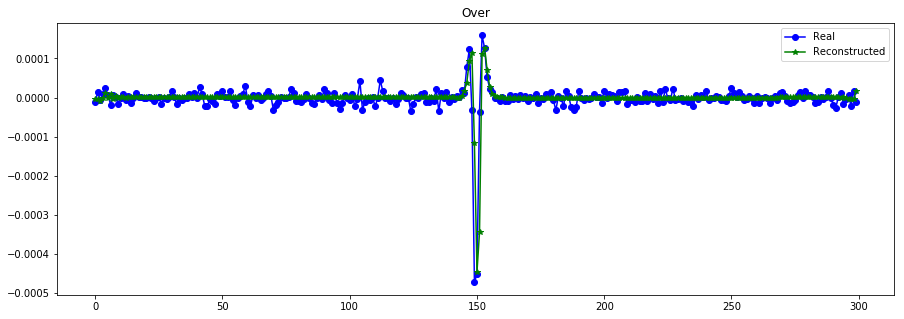

----------------------------------------------------------------
Real scale = 358653.137735
Pred scale = 352105.968750


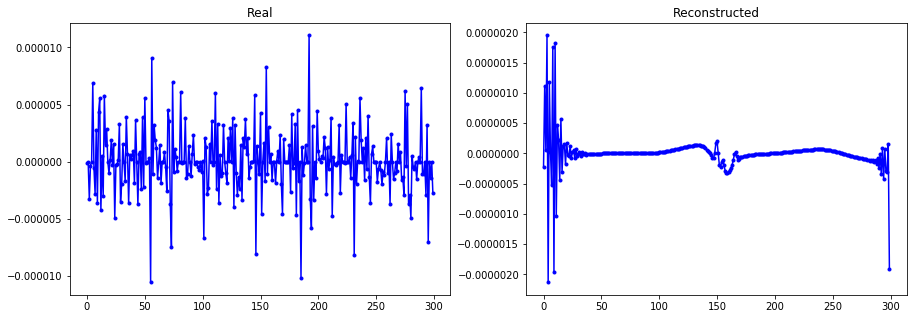

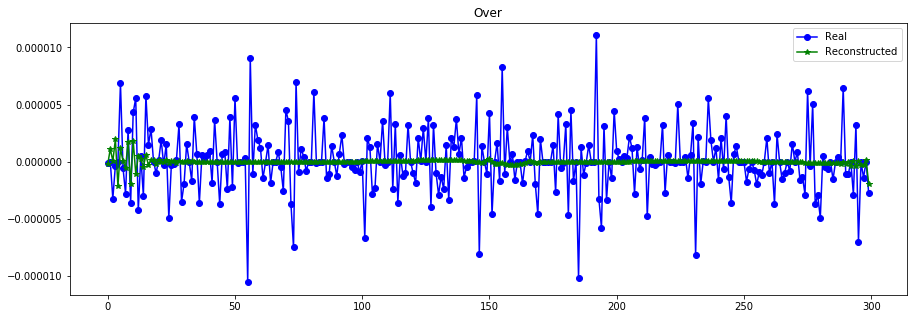

----------------------------------------------------------------
Real scale = 14935.862500
Pred scale = 15142.582031


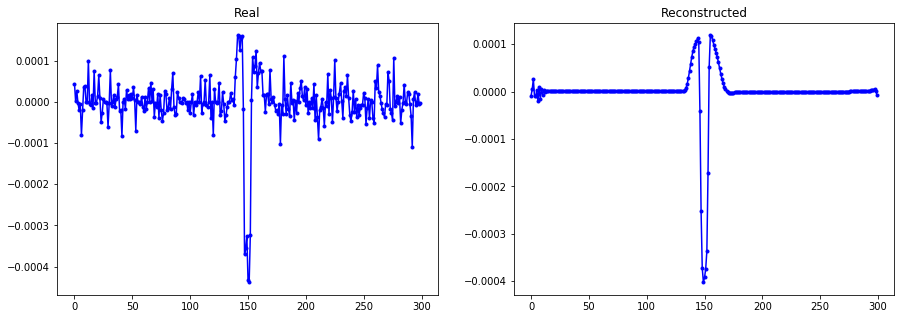

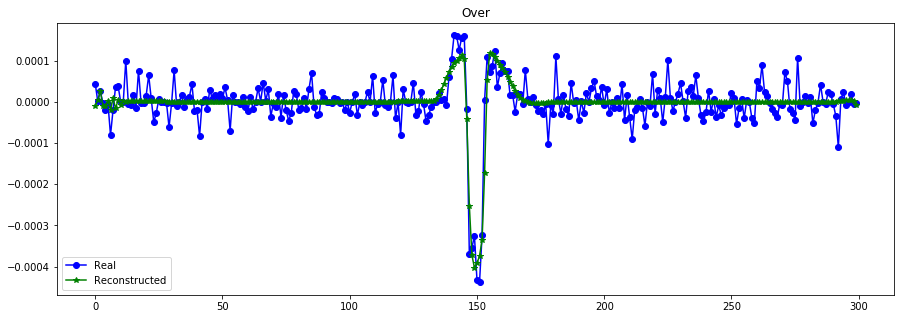

----------------------------------------------------------------
Real scale = 7645.135950
Pred scale = 7480.767578


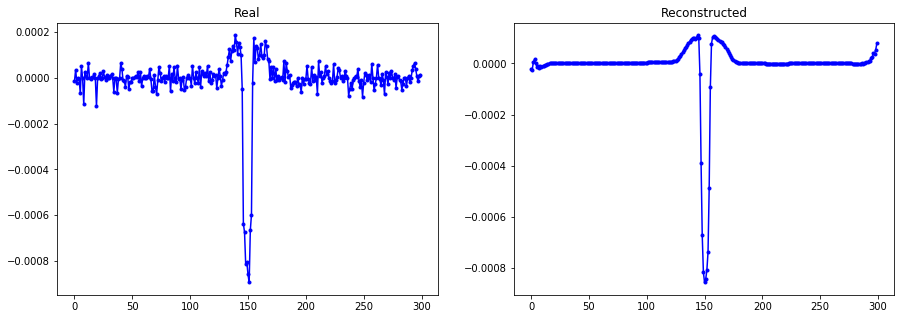

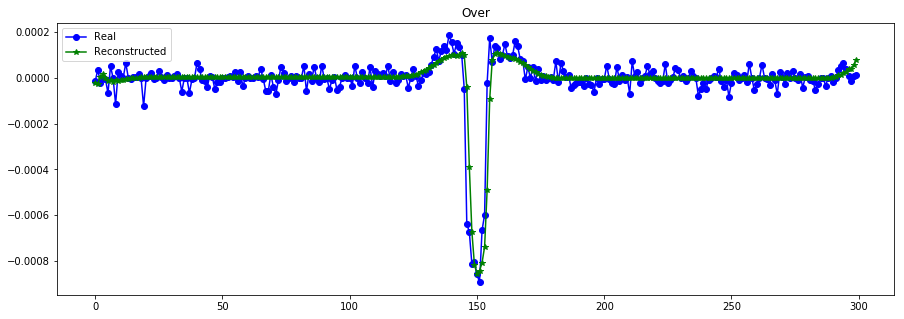

----------------------------------------------------------------
Real scale = 119642.152648
Pred scale = 112168.773438


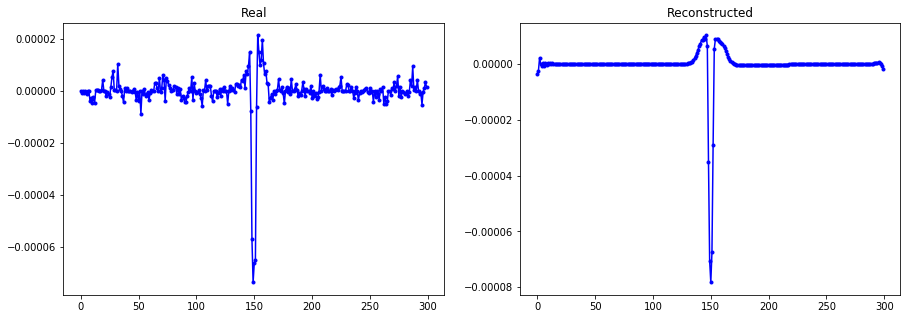

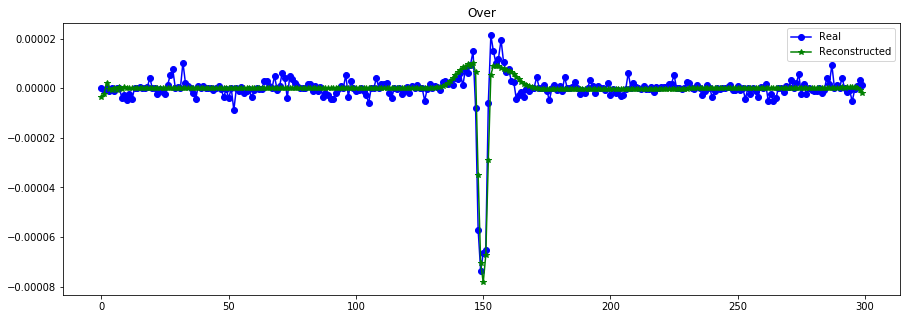

----------------------------------------------------------------
Real scale = 7477.545959
Pred scale = 8099.514648


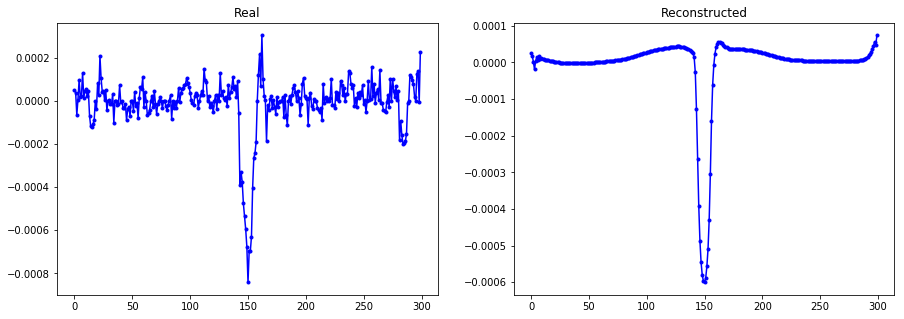

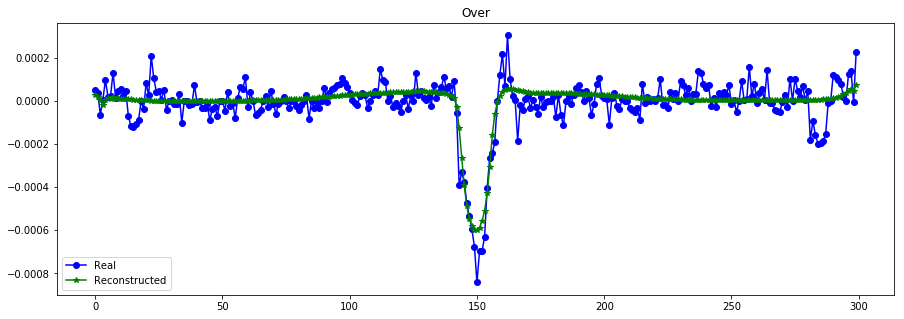

----------------------------------------------------------------
Real scale = 20231.807848
Pred scale = 19924.318359


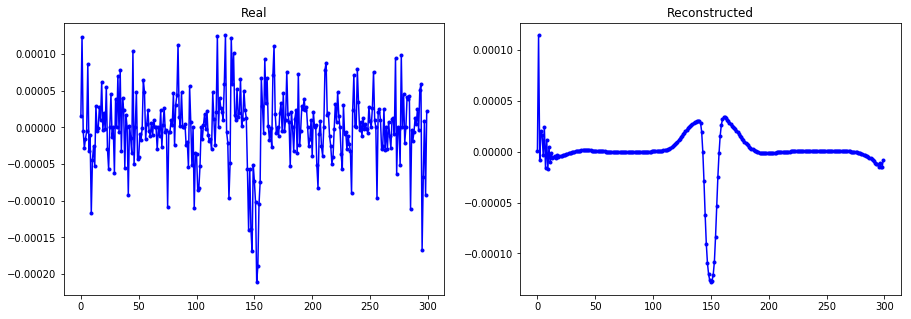

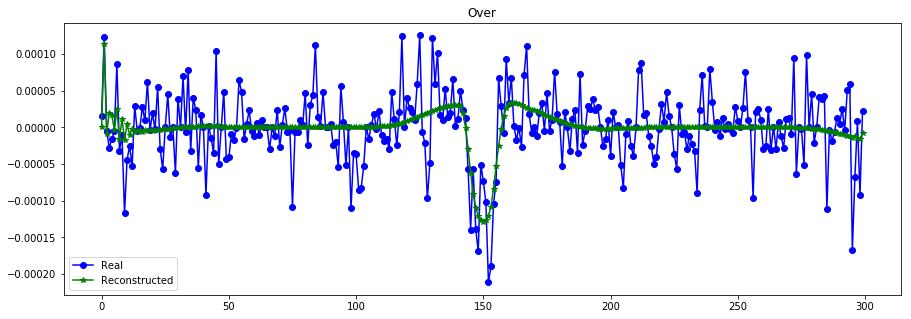

----------------------------------------------------------------
Real scale = 19613.881526
Pred scale = 20496.218750


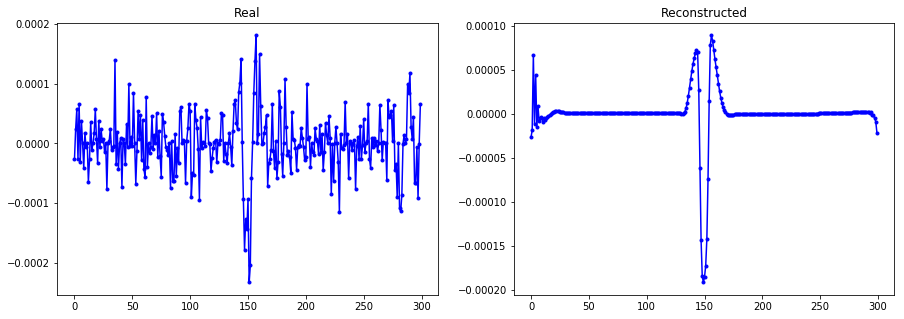

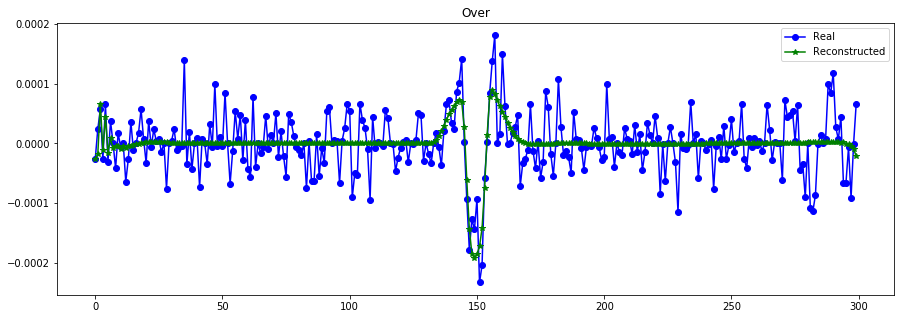

----------------------------------------------------------------
Real scale = 79164.558080
Pred scale = 80632.343750


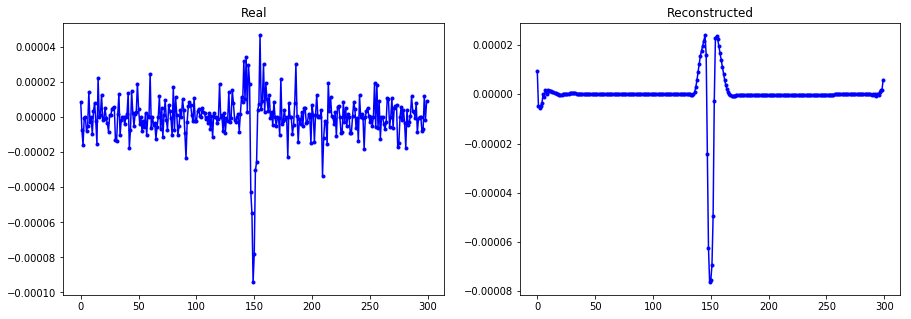

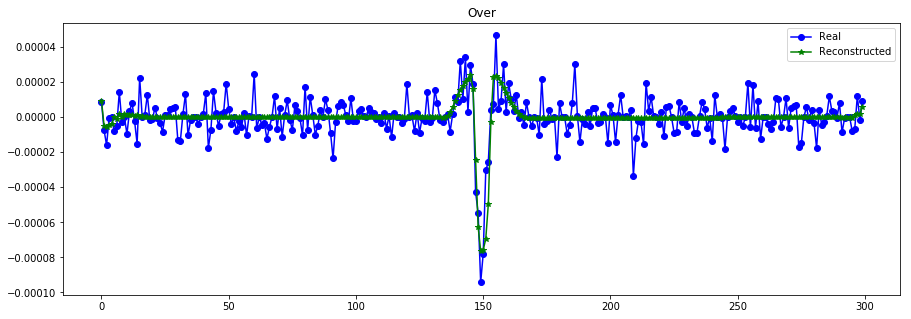

----------------------------------------------------------------
Real scale = 63420.227204
Pred scale = 64345.074219


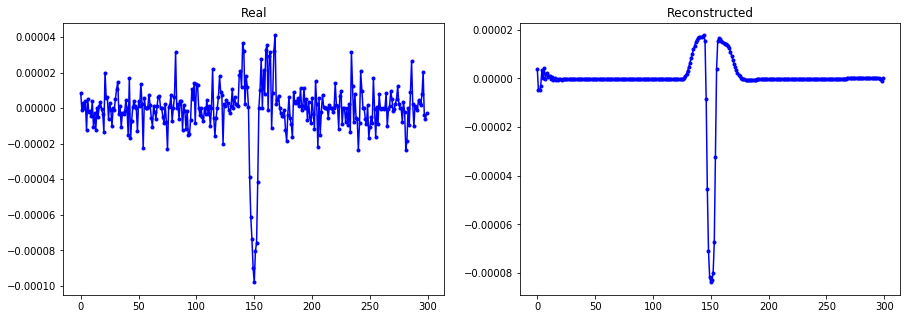

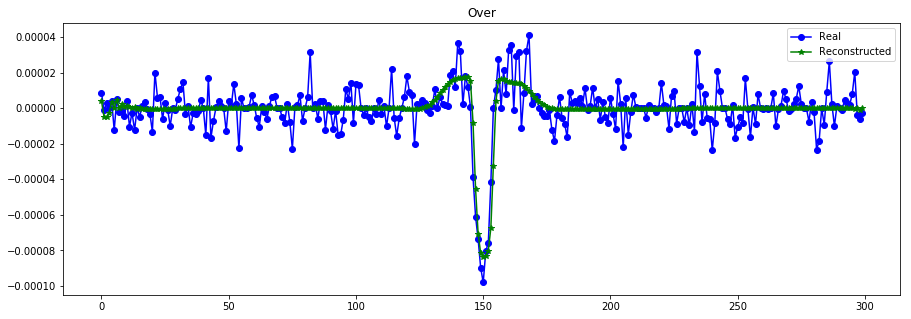

----------------------------------------------------------------
Real scale = 28339.445091
Pred scale = 28407.482422


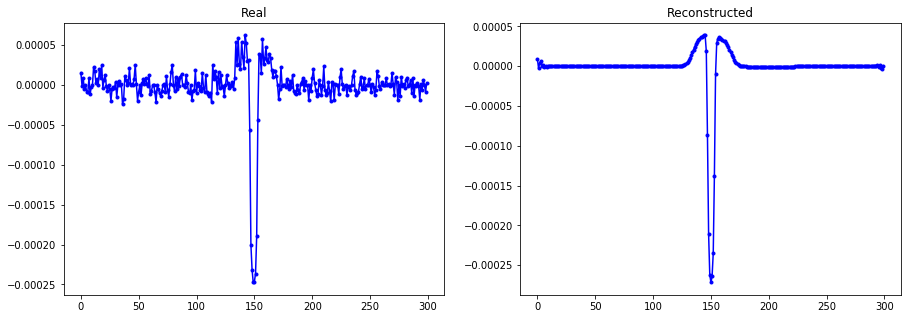

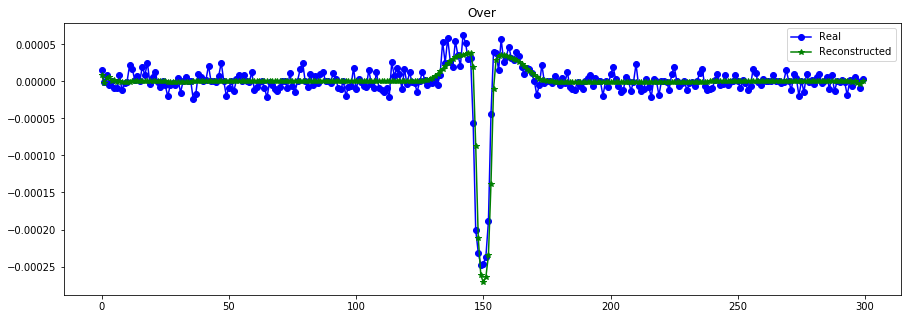

----------------------------------------------------------------
Real scale = 26016.586214
Pred scale = 26919.349609


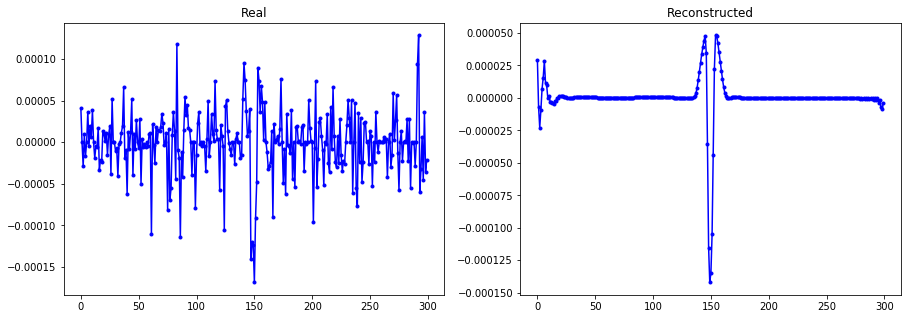

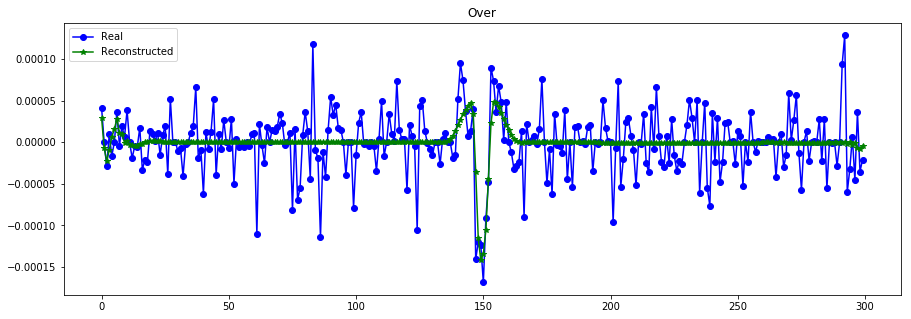

----------------------------------------------------------------
Real scale = 20413.081852
Pred scale = 19977.080078


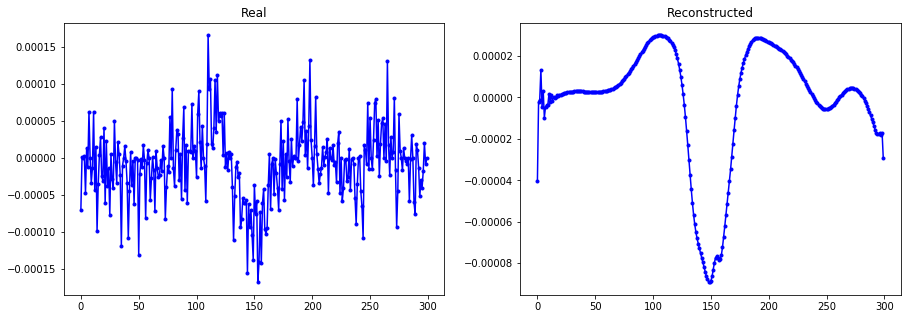

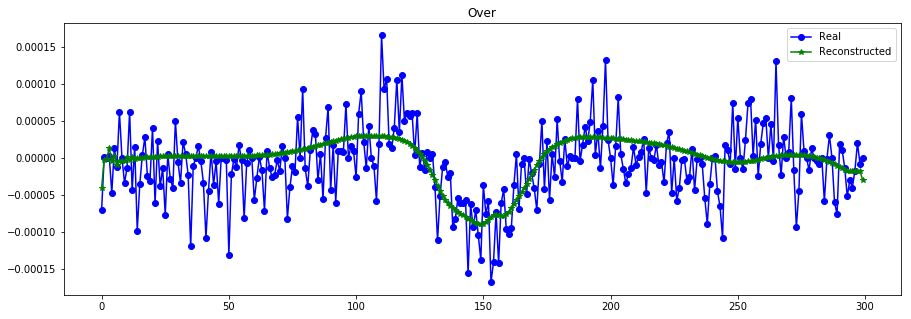

----------------------------------------------------------------


In [31]:
plot_n_lc(X_train[:N,:,0], X_train_hat, n= 15, s=[Sinv_train[:N],Sinv_train_hat]) #

In [32]:
vae.get_layer("encoder").save_weights("./models/VAEscale_%dT_%dD_%de_E.h5"%(T,latent_dim,400))
vae.get_layer("generator").save_weights("./models/VAEscale_%dT_%dD_%de_D.h5"%(T,latent_dim,400))

# con loss sobre escala mas bajo
hasta ahora el mejor:   

In [16]:
def Wvae_loss(y_true, y_pred):    
    return smse_LC(y_true, y_pred) + l*kl_loss(y_true, y_pred) + 0.1*mse_S(y_true, y_pred) 

vae.compile(optimizer='adam', loss=Wvae_loss, metrics = [smse_LC,kl_loss,mse_S])

hist = vae.fit([X_train_t, X_train, Sinv_train], X_train, epochs=400, batch_size=batch_size)
## modelo de codificar mas simple.. a 1

Epoch 1/400
8634/8634 [==============================] - 34s 4ms/step - loss: 2.1725 - SMSE: 1.8003 - KL: 7.4487 - MSE_scale: 3.6472
Epoch 2/400
8634/8634 [==============================] - 28s 3ms/step - loss: 1.4085 - SMSE: 1.0234 - KL: 7.5229 - MSE_scale: 3.7759
Epoch 3/400
8634/8634 [==============================] - 27s 3ms/step - loss: 1.3993 - SMSE: 1.0114 - KL: 12.9213 - MSE_scale: 3.7492
Epoch 4/400
8634/8634 [==============================] - 27s 3ms/step - loss: 1.3781 - SMSE: 1.0165 - KL: 6.0457 - MSE_scale: 3.5556
Epoch 5/400
8634/8634 [==============================] - 29s 3ms/step - loss: 1.3630 - SMSE: 1.0195 - KL: 4.7778 - MSE_scale: 3.3865
Epoch 6/400
8634/8634 [==============================] - 28s 3ms/step - loss: 1.3478 - SMSE: 1.0396 - KL: 3.8080 - MSE_scale: 3.0446
Epoch 7/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.3581 - SMSE: 1.0208 - KL: 9.6125 - MSE_scale: 3.2776
Epoch 8/400
8634/8634 [==============================] - 27s 3ms/ste

8634/8634 [==============================] - 30s 3ms/step - loss: 0.7648 - SMSE: 0.7456 - KL: 17.0778 - MSE_scale: 0.0216
Epoch 122/400
8634/8634 [==============================] - 29s 3ms/step - loss: 0.7618 - SMSE: 0.7426 - KL: 16.9768 - MSE_scale: 0.0217
Epoch 123/400
8634/8634 [==============================] - 34s 4ms/step - loss: 0.7792 - SMSE: 0.7588 - KL: 17.0725 - MSE_scale: 0.0336
Epoch 124/400
8634/8634 [==============================] - 33s 4ms/step - loss: 0.7579 - SMSE: 0.7366 - KL: 18.4133 - MSE_scale: 0.0289
Epoch 125/400
8634/8634 [==============================] - 32s 4ms/step - loss: 0.7551 - SMSE: 0.7345 - KL: 17.8383 - MSE_scale: 0.0275
Epoch 126/400
8634/8634 [==============================] - 31s 4ms/step - loss: 0.7611 - SMSE: 0.7400 - KL: 18.2370 - MSE_scale: 0.0281
Epoch 127/400
8634/8634 [==============================] - 30s 3ms/step - loss: 0.7710 - SMSE: 0.7505 - KL: 18.0957 - MSE_scale: 0.0245
Epoch 128/400
8634/8634 [==============================] - 29s

8634/8634 [==============================] - 25s 3ms/step - loss: 0.6952 - SMSE: 0.6772 - KL: 16.6609 - MSE_scale: 0.0135
Epoch 242/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6990 - SMSE: 0.6813 - KL: 16.4914 - MSE_scale: 0.0129
Epoch 243/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7037 - SMSE: 0.6856 - KL: 16.6138 - MSE_scale: 0.0153
Epoch 244/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7300 - SMSE: 0.7121 - KL: 16.4274 - MSE_scale: 0.0153
Epoch 245/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7060 - SMSE: 0.6883 - KL: 16.3729 - MSE_scale: 0.0140
Epoch 246/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6984 - SMSE: 0.6805 - KL: 16.5799 - MSE_scale: 0.0131
Epoch 247/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6896 - SMSE: 0.6716 - KL: 16.6376 - MSE_scale: 0.0129
Epoch 248/400
8634/8634 [==============================] - 26s

8634/8634 [==============================] - 26s 3ms/step - loss: 0.6281 - SMSE: 0.6067 - KL: 19.9865 - MSE_scale: 0.0137
Epoch 362/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6327 - SMSE: 0.6114 - KL: 19.9777 - MSE_scale: 0.0130
Epoch 363/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6419 - SMSE: 0.6205 - KL: 19.9473 - MSE_scale: 0.0137
Epoch 364/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6466 - SMSE: 0.6248 - KL: 20.2689 - MSE_scale: 0.0153
Epoch 365/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6393 - SMSE: 0.6175 - KL: 20.4161 - MSE_scale: 0.0130
Epoch 366/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6615 - SMSE: 0.6392 - KL: 20.7675 - MSE_scale: 0.0155
Epoch 367/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.6232 - SMSE: 0.6017 - KL: 20.2232 - MSE_scale: 0.0130
Epoch 368/400
8634/8634 [==============================] - 26s

In [147]:
#vae.load_weights("./old_models/%dT_%dD_%de_VAE_scaleLlow.h5"%(T,latent_dim,400))
vae.get_layer("encoder").load_weights("./models/VAEscaleLow_%dT_%dD_%de_E.h5"%(T,latent_dim,400))
vae.get_layer("generator").load_weights("./models/VAEscaleLow_%dT_%dD_%de_D.h5"%(T,latent_dim,400))

/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


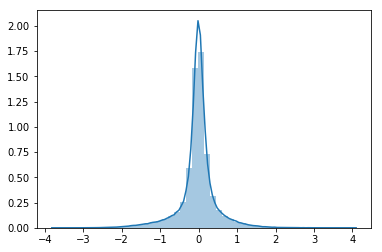

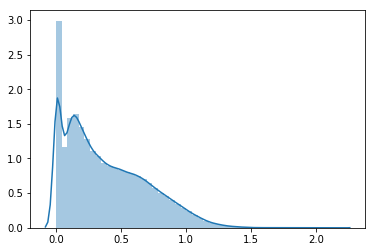

In [17]:
encoder_all = Model([x_t, x_lc,s], [z_mean, z_log_var], name="encoder")
z_aux, z_var_aux = encoder_all.predict([X_train_t,X_train, Sinv_train], batch_size=512)

sns.distplot(z_aux.flatten())
plt.show()
sns.distplot(np.exp(z_var_aux.flatten()))
plt.show()

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


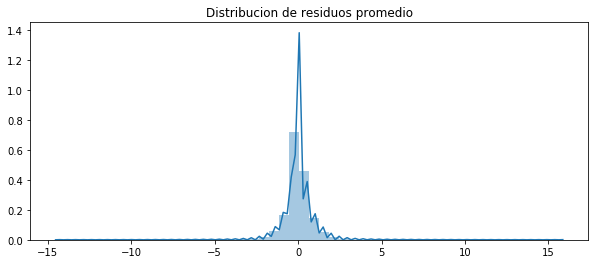

------------- Error -------------
RMSE (+-) =  0.6939362298969438
MAE  (+-) =  0.48356382777095275
------------- Smoothness -------------
AutoCorr lag-one =  0.588711277951089
Diff MEAN =  0.06781415038130018
------------- Residual -------------
AutoCorr lag-one =  -0.04007557987599006
Permutation H =  0.9957841400787466
Spectral H =  0.8993129135736088
---------------------------------------
MSE de escala escalado=  0.1739521784619327


array([[  795.0442],
       [20331.965 ],
       [82027.42  ],
       ...,
       [14620.66  ],
       [36365.44  ],
       [15283.995 ]], dtype=float32)

In [119]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], Sinv_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]*Sinv_train[:N,None,:], X_train_hat*Sinv_train[:N,None,:])

Sinv_train_hat = Sinv_model.predict([X_train_t[:N],X_train[:N], Sinv_train[:N]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error(S_train[:N], 1/Sinv_train_hat)*(1/S_std)**2)
Sinv_train_hat

Real scale = 0.000053
Pred scale = 0.000060


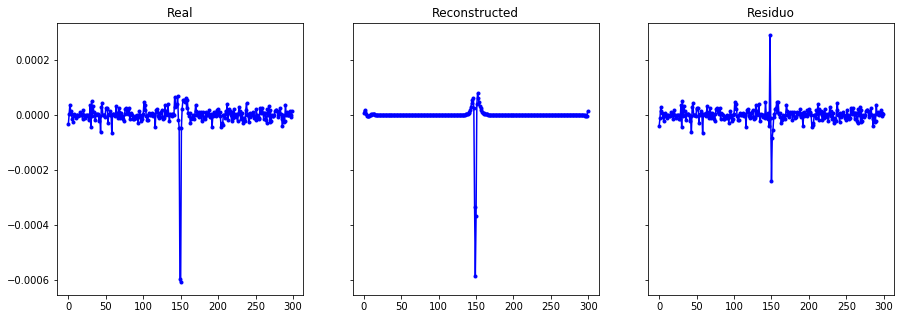

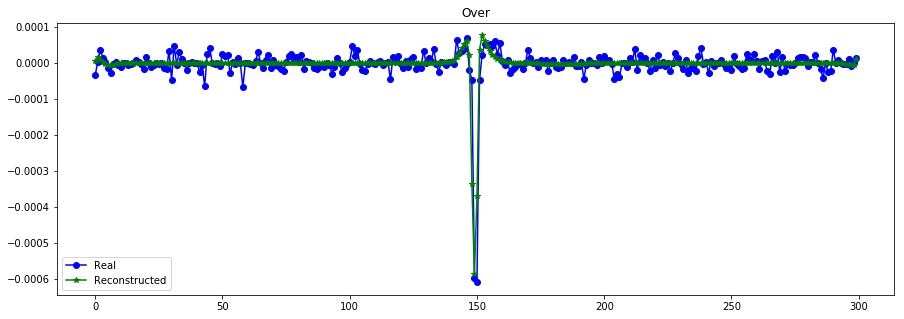

----------------------------------------------------------------
Real scale = 0.000026
Pred scale = 0.000025


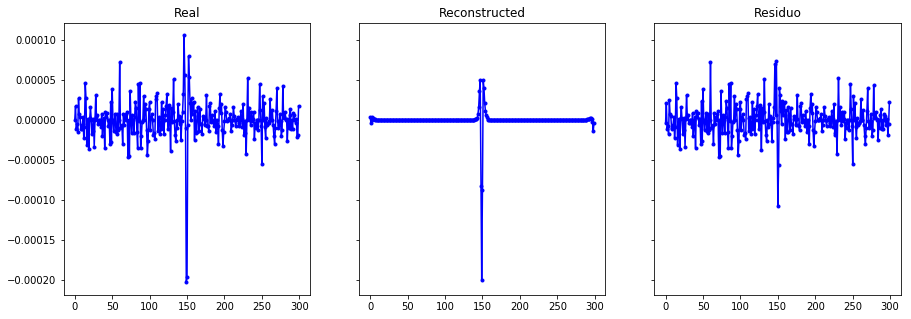

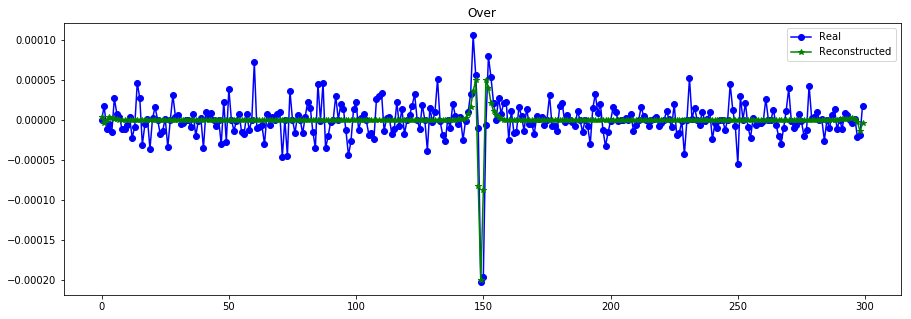

----------------------------------------------------------------
Real scale = 0.000009
Pred scale = 0.000009


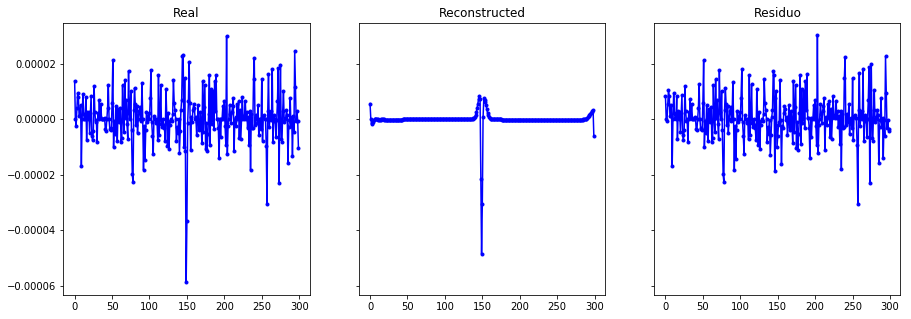

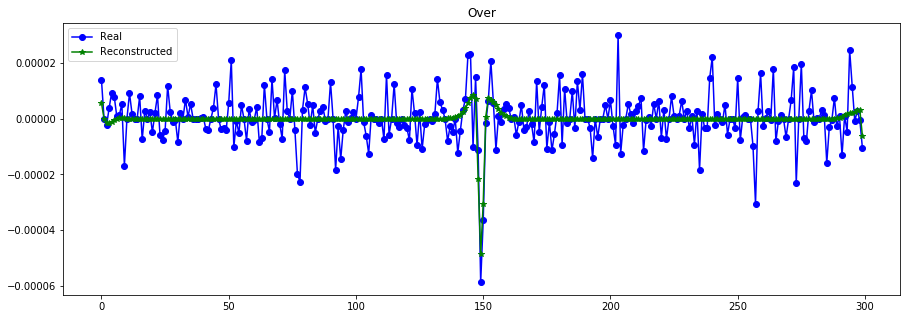

----------------------------------------------------------------
Real scale = 0.000040
Pred scale = 0.000039


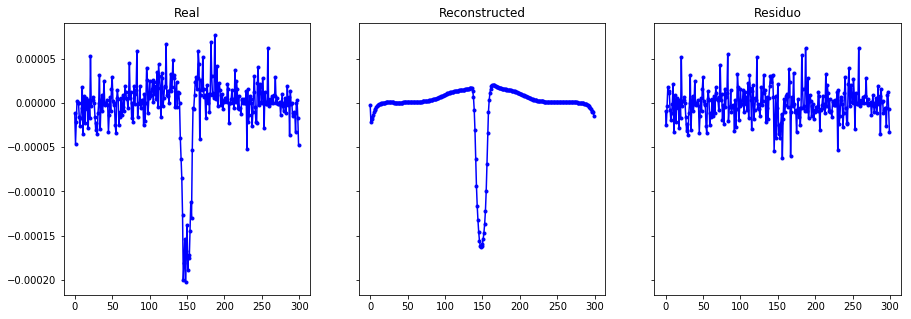

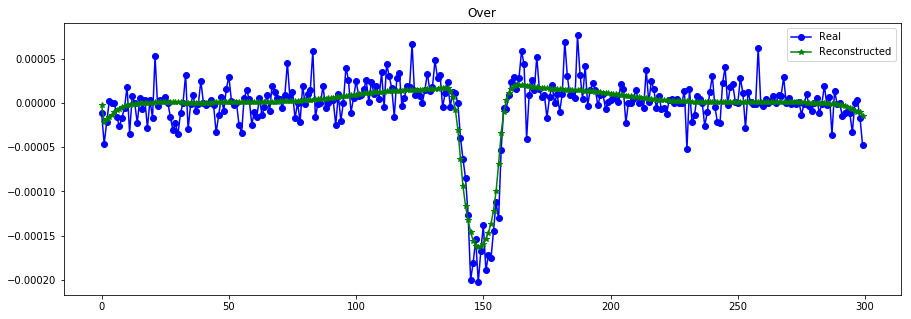

----------------------------------------------------------------
Real scale = 0.000013
Pred scale = 0.000013


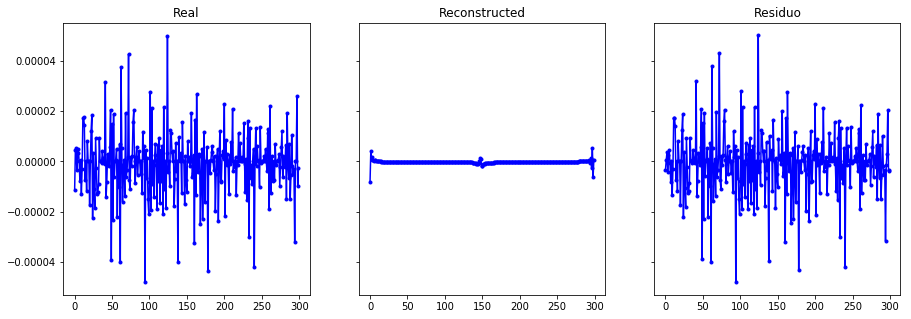

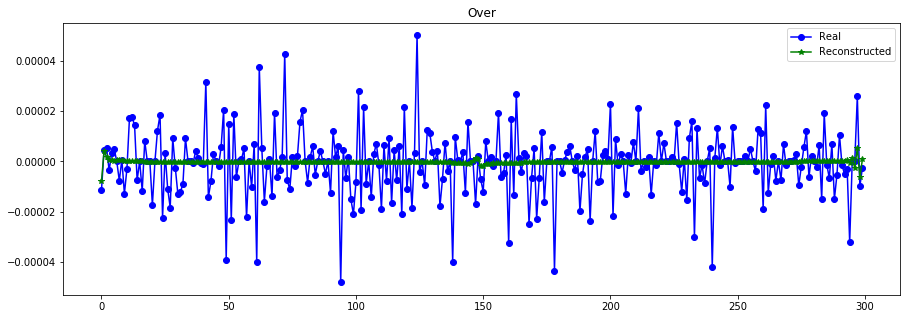

----------------------------------------------------------------
Real scale = 0.000025
Pred scale = 0.000024


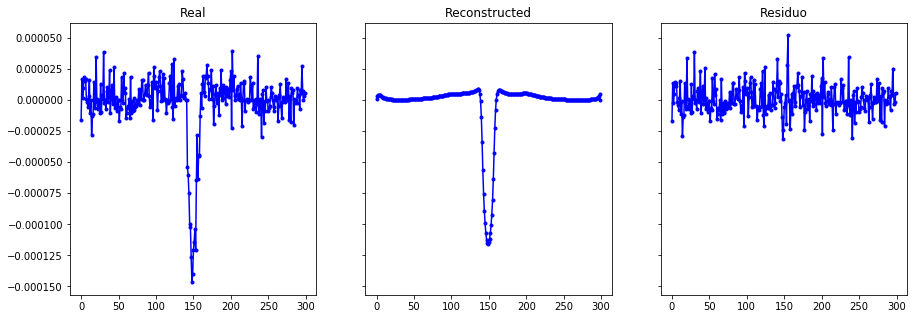

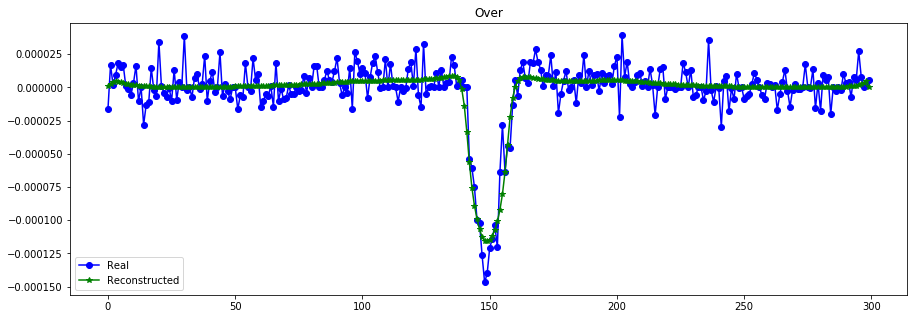

----------------------------------------------------------------
Real scale = 0.000028
Pred scale = 0.000022


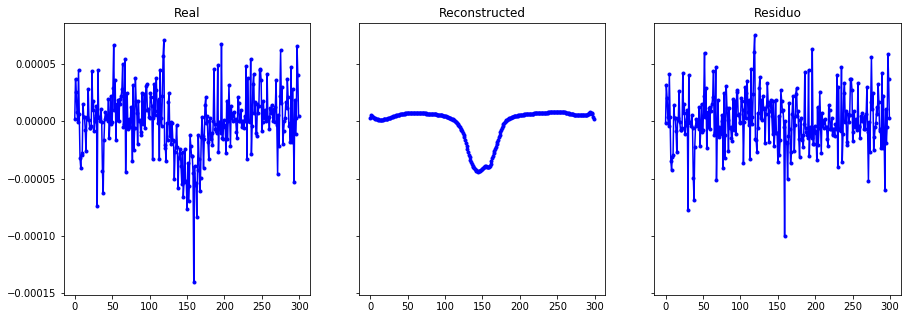

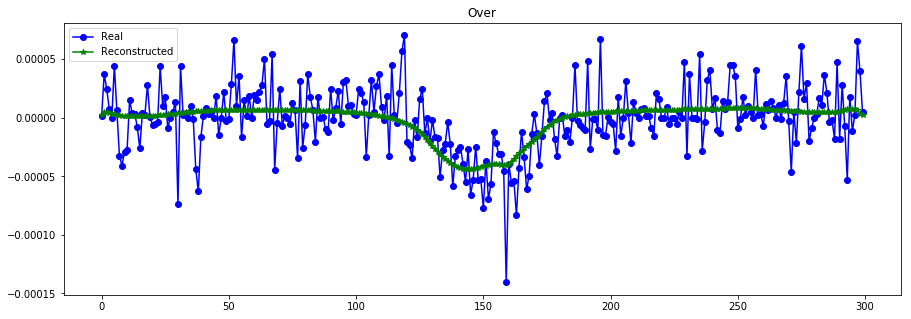

----------------------------------------------------------------
Real scale = 0.000010
Pred scale = 0.000010


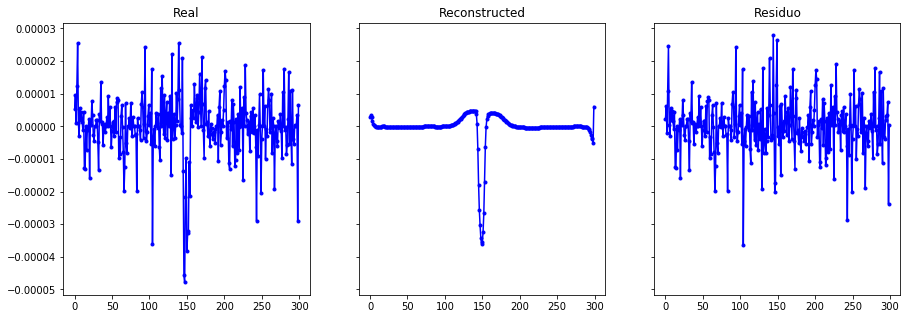

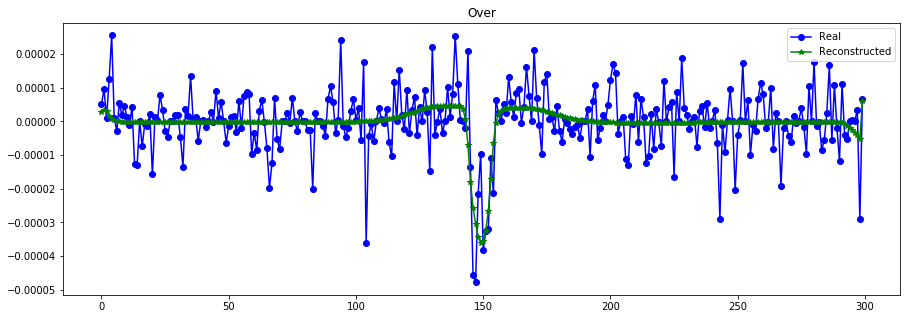

----------------------------------------------------------------
Real scale = 0.000042
Pred scale = 0.000043


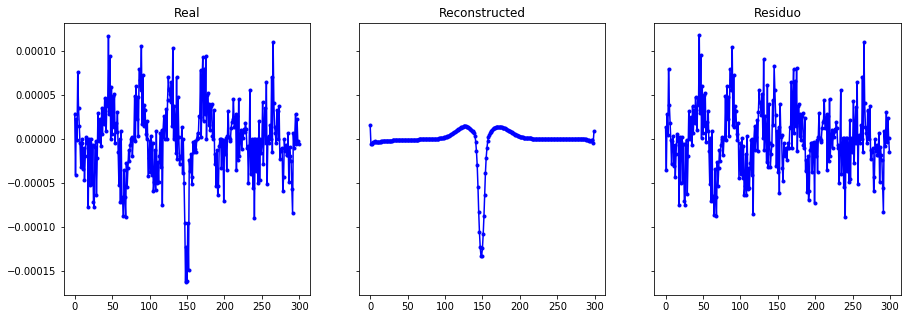

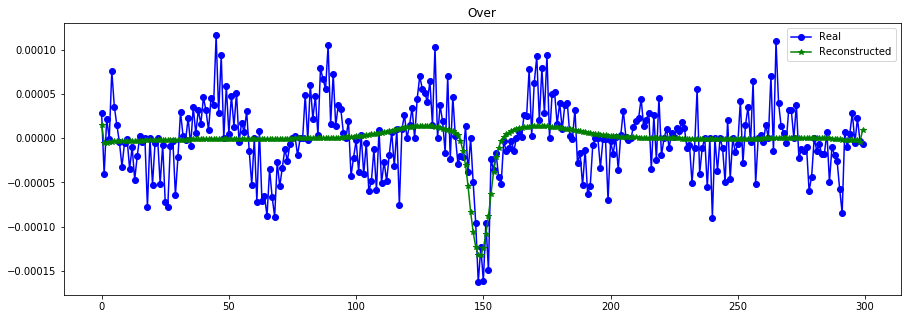

----------------------------------------------------------------
Real scale = 0.000208
Pred scale = 0.000232


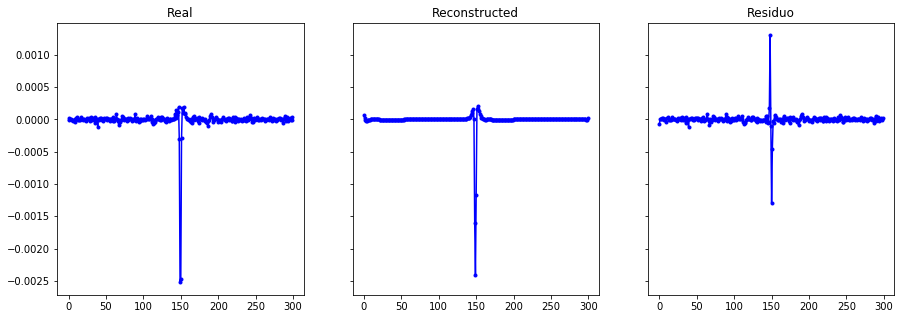

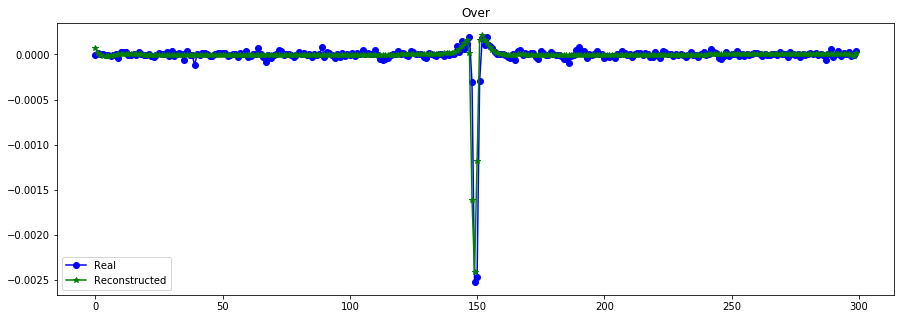

----------------------------------------------------------------
Real scale = 0.000010
Pred scale = 0.000009


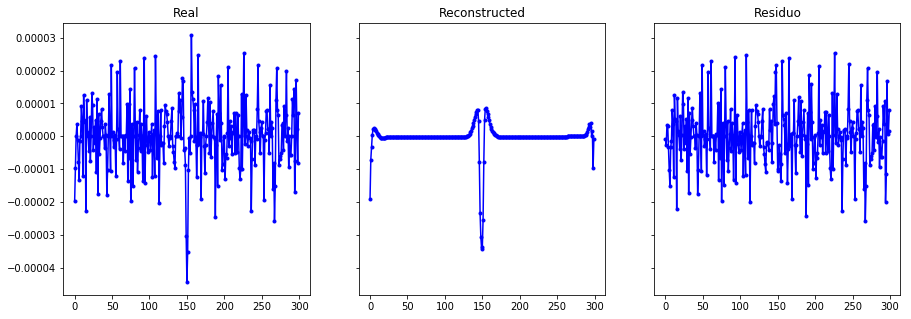

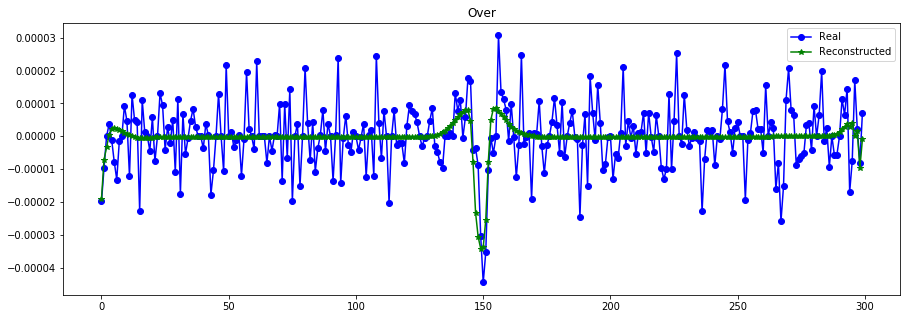

----------------------------------------------------------------
Real scale = 0.000009
Pred scale = 0.000009


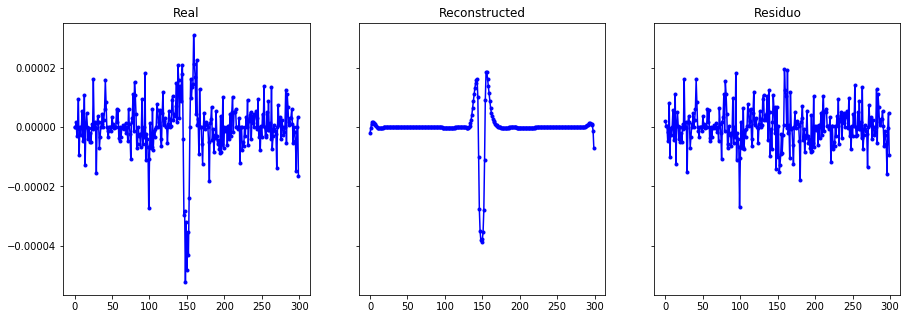

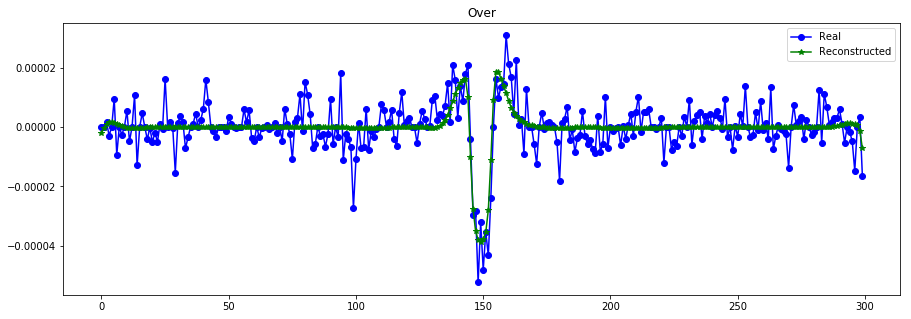

----------------------------------------------------------------
Real scale = 0.000015
Pred scale = 0.000018


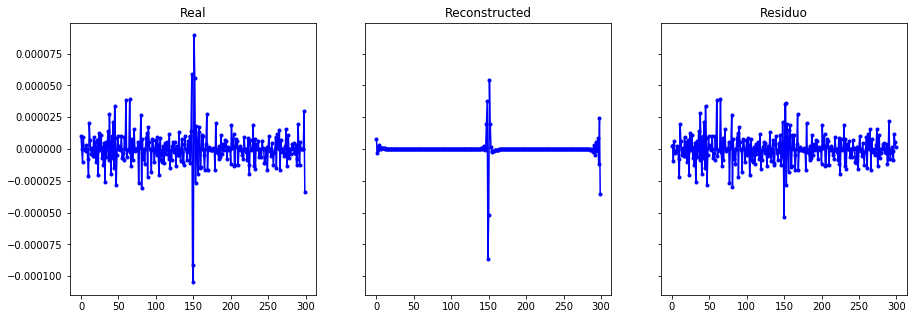

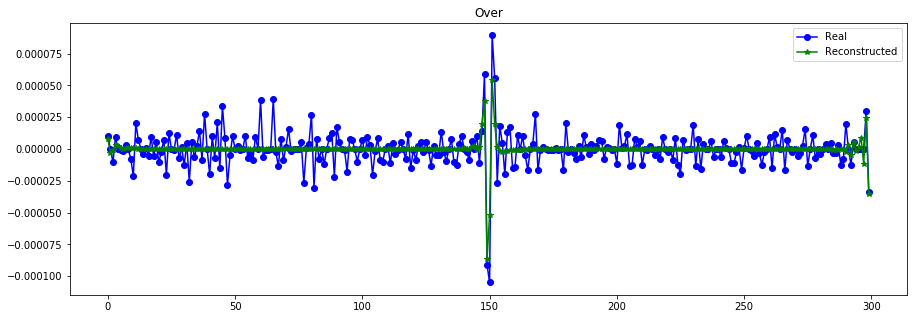

----------------------------------------------------------------
Real scale = 0.000115
Pred scale = 0.000124


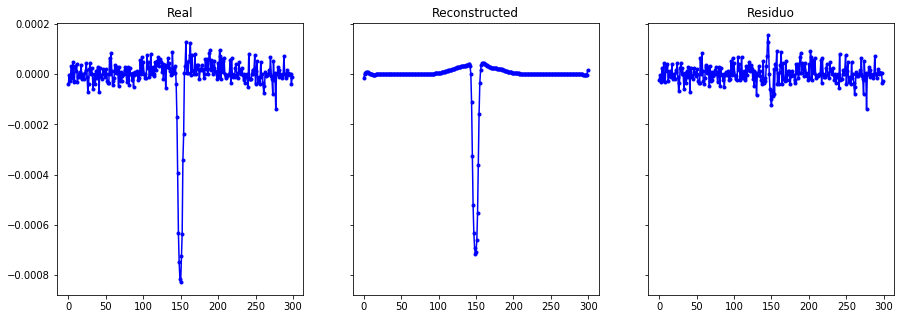

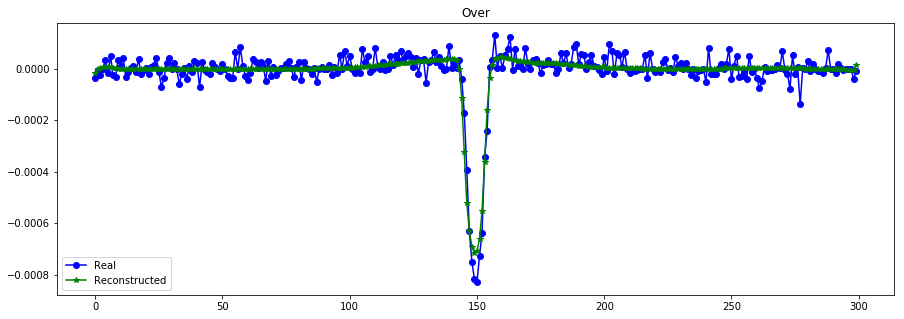

----------------------------------------------------------------
Real scale = 0.000011
Pred scale = 0.000010


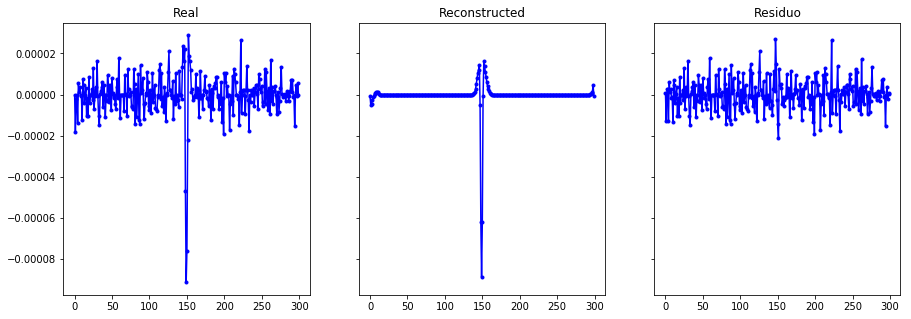

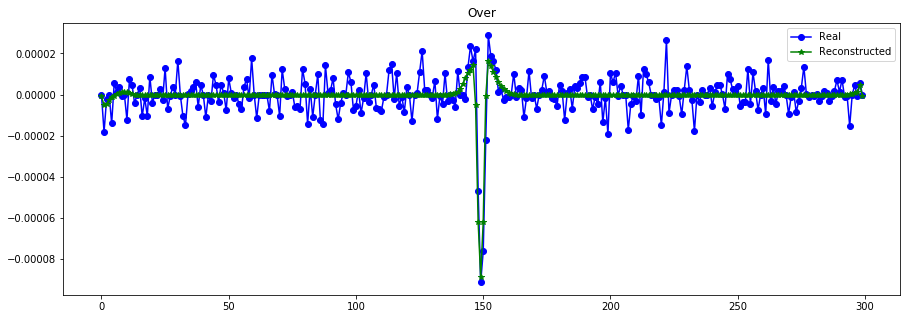

----------------------------------------------------------------


In [148]:
plot_n_lc(X_train[:N,:,0], X_train_hat, n= 15, s=[S_train[:N],1/Sinv_train_hat]) #

In [20]:
#vae.save_weights("./models/%dT_%dD_%de_VAE_scaleLlow.h5"%(T,latent_dim,400))
vae.get_layer("encoder").save_weights("./models/VAEscaleLow_%dT_%dD_%de_E.h5"%(T,latent_dim,400))
vae.get_layer("generator").save_weights("./models/VAEscaleLow_%dT_%dD_%de_D.h5"%(T,latent_dim,400))

In [63]:
def Wvae_loss(y_true, y_pred):    
    return smse_LC(y_true, y_pred) + l*kl_loss(y_true, y_pred) + 0.1*mse_S(y_true, y_pred) 

vae.compile(optimizer='adam', loss=Wvae_loss, metrics = [smse_LC,kl_loss,mse_S])

hist = vae.fit([X_train_t, X_train, Sinv_train], X_train, epochs=400, batch_size=batch_size)
## modelo de codificar mas simple.. a 1

Epoch 1/400
8634/8634 [==============================] - 32s 4ms/step - loss: 1.2541 - SMSE: 1.0985 - KL: 2.1813 - MSE_scale: 1.5350
Epoch 2/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.1085 - SMSE: 1.0107 - KL: 2.8501 - MSE_scale: 0.9496
Epoch 3/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0690 - SMSE: 1.0025 - KL: 9.8235 - MSE_scale: 0.5672
Epoch 4/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0596 - SMSE: 1.0022 - KL: 8.8455 - MSE_scale: 0.4855
Epoch 5/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0529 - SMSE: 1.0020 - KL: 9.0027 - MSE_scale: 0.4189
Epoch 6/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0473 - SMSE: 1.0018 - KL: 8.6497 - MSE_scale: 0.3681
Epoch 7/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0446 - SMSE: 1.0017 - KL: 8.6458 - MSE_scale: 0.3417
Epoch 8/400
8634/8634 [==============================] - 26s 3ms/step

Epoch 62/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7894 - SMSE: 0.7666 - KL: 19.5944 - MSE_scale: 0.0319
Epoch 63/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7869 - SMSE: 0.7638 - KL: 19.4786 - MSE_scale: 0.0360
Epoch 64/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7905 - SMSE: 0.7673 - KL: 19.9229 - MSE_scale: 0.0327
Epoch 65/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7705 - SMSE: 0.7484 - KL: 18.9995 - MSE_scale: 0.0312
Epoch 66/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7989 - SMSE: 0.7763 - KL: 19.0105 - MSE_scale: 0.0356
Epoch 67/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7822 - SMSE: 0.7604 - KL: 18.8422 - MSE_scale: 0.0297
Epoch 68/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7904 - SMSE: 0.7684 - KL: 18.6913 - MSE_scale: 0.0329
Epoch 69/400
8634/8634 [==============================]

8634/8634 [==============================] - 25s 3ms/step - loss: 0.7318 - SMSE: 0.7140 - KL: 16.1121 - MSE_scale: 0.0167
Epoch 183/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7337 - SMSE: 0.7159 - KL: 16.2365 - MSE_scale: 0.0154
Epoch 184/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7213 - SMSE: 0.7035 - KL: 16.1990 - MSE_scale: 0.0152
Epoch 185/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7157 - SMSE: 0.6981 - KL: 16.0844 - MSE_scale: 0.0149
Epoch 186/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7135 - SMSE: 0.6959 - KL: 16.1394 - MSE_scale: 0.0145
Epoch 187/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7228 - SMSE: 0.7050 - KL: 16.1706 - MSE_scale: 0.0157
Epoch 188/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7114 - SMSE: 0.6938 - KL: 16.1376 - MSE_scale: 0.0149
Epoch 189/400
8634/8634 [==============================] - 26s

8634/8634 [==============================] - 26s 3ms/step - loss: 0.6653 - SMSE: 0.6456 - KL: 18.0233 - MSE_scale: 0.0162
Epoch 303/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6670 - SMSE: 0.6476 - KL: 17.9132 - MSE_scale: 0.0148
Epoch 304/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6717 - SMSE: 0.6523 - KL: 17.7978 - MSE_scale: 0.0162
Epoch 305/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6495 - SMSE: 0.6300 - KL: 17.9405 - MSE_scale: 0.0153
Epoch 306/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6343 - SMSE: 0.6150 - KL: 17.8429 - MSE_scale: 0.0146
Epoch 307/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6579 - SMSE: 0.6384 - KL: 18.0232 - MSE_scale: 0.0150
Epoch 308/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6652 - SMSE: 0.6453 - KL: 18.0125 - MSE_scale: 0.0184
Epoch 309/400
8634/8634 [==============================] - 26s

In [122]:
vae.get_layer("encoder").load_weights("./models/VAEscaleLow_%dT_%dD_%de_E.h5"%(T,latent_dim,400))
vae.get_layer("generator").load_weights("./models/VAEscaleLow_%dT_%dD_%de_D.h5"%(T,latent_dim,400))

/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


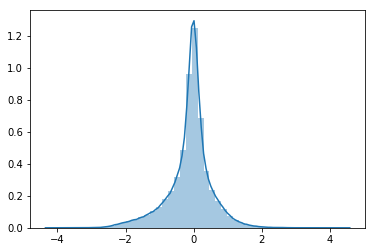

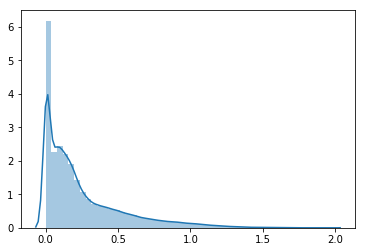

In [64]:
encoder_all = Model([x_t, x_lc,s], [z_mean, z_log_var], name="encoder")
z_aux, z_var_aux = encoder_all.predict([X_train_t,X_train, Sinv_train], batch_size=512)

sns.distplot(z_aux.flatten())
plt.show()
sns.distplot(np.exp(z_var_aux.flatten()))
plt.show()

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


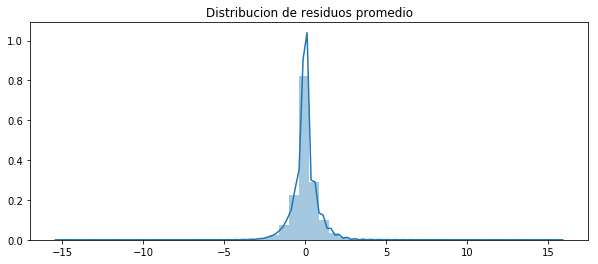

------------- Error -------------
RMSE (+-) =  0.744785669796445
MAE  (+-) =  0.4939140308722942
------------- Smoothness -------------
AutoCorr lag-one =  0.6359158919657382
Diff MEAN =  0.06168383675942264
------------- Residual -------------
AutoCorr lag-one =  0.0004560669185546441
Permutation H =  0.9956809831257126
Spectral H =  0.8959366094124422
---------------------------------------
MSE de escala escalado=  0.15078844066701785


array([[  859.5456],
       [21927.227 ],
       [84972.05  ],
       ...,
       [16167.366 ],
       [46550.582 ],
       [14861.755 ]], dtype=float32)

In [123]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], Sinv_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]*Sinv_train[:N,None,:], X_train_hat*Sinv_train[:N,None,:])

Sinv_train_hat = Sinv_model.predict([X_train_t[:N],X_train[:N], Sinv_train[:N]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error(S_train[:N], 1/Sinv_train_hat)*(1/S_std)**2)
Sinv_train_hat

Real scale = 0.000018
Pred scale = 0.000018


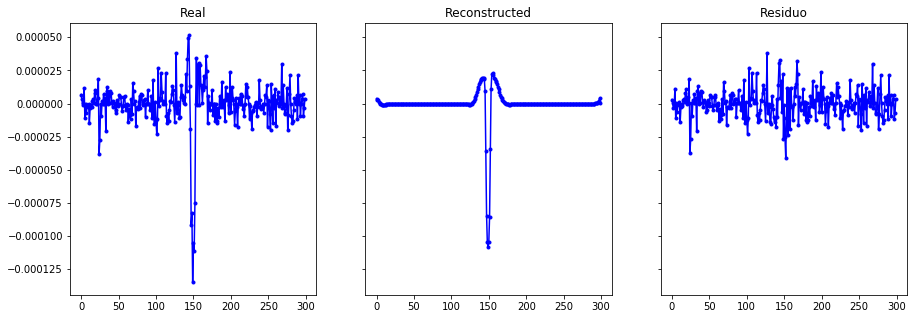

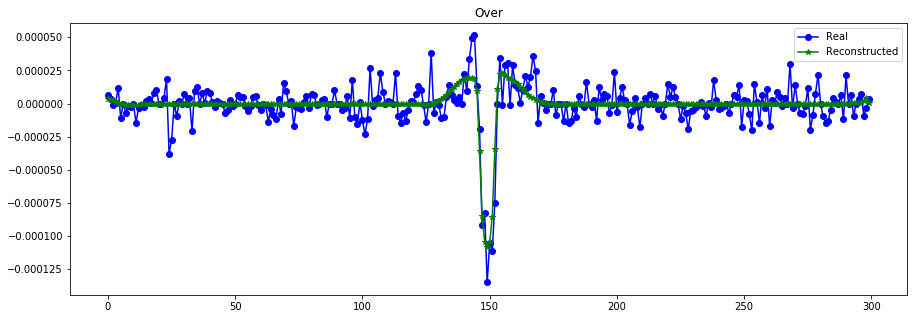

----------------------------------------------------------------
Real scale = 0.000035
Pred scale = 0.000039


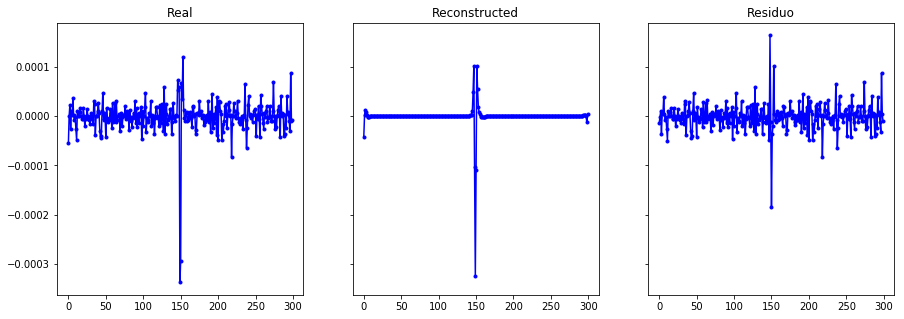

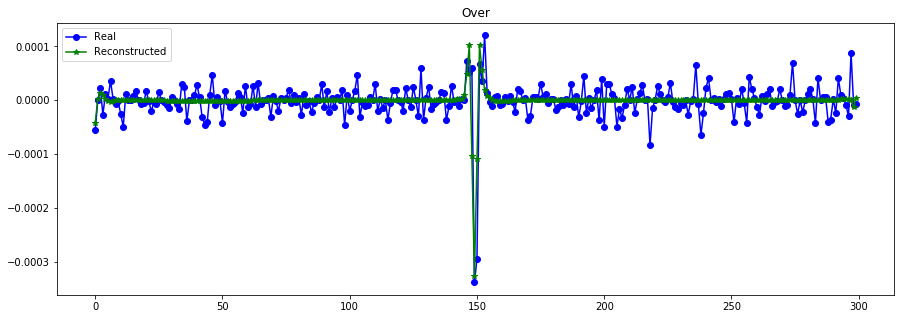

----------------------------------------------------------------
Real scale = 0.000063
Pred scale = 0.000065


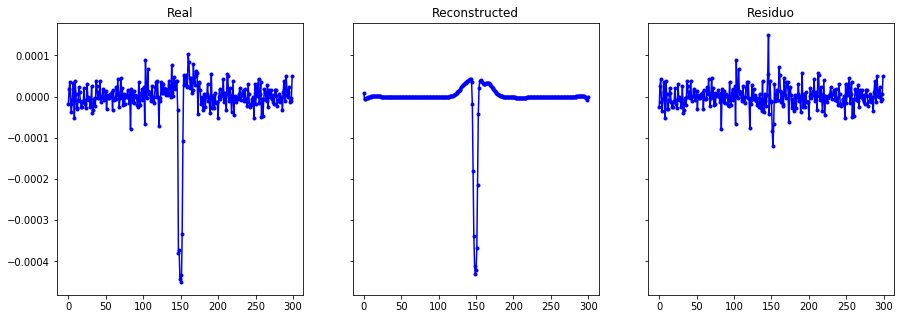

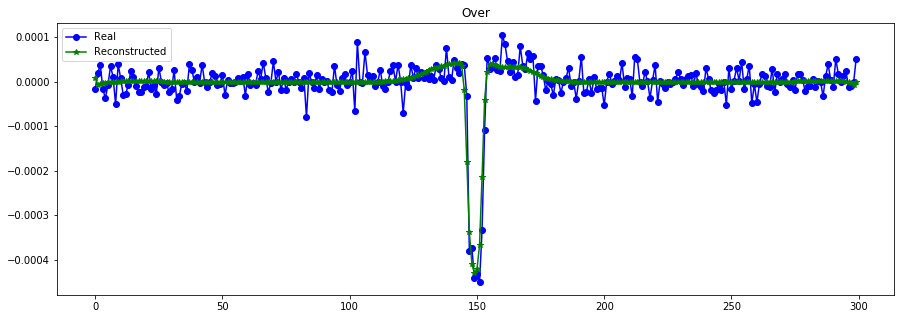

----------------------------------------------------------------
Real scale = 0.000031
Pred scale = 0.000031


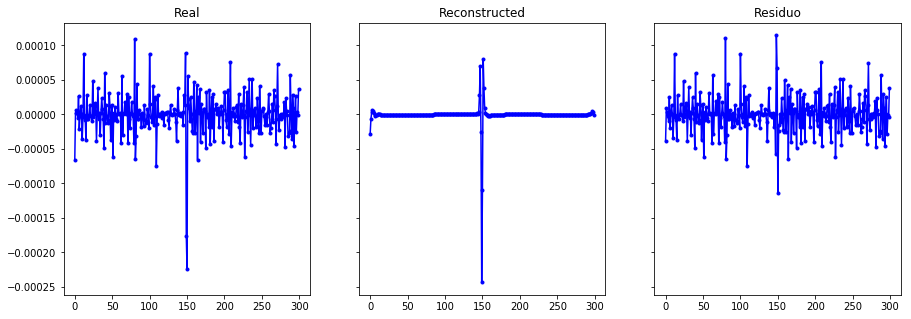

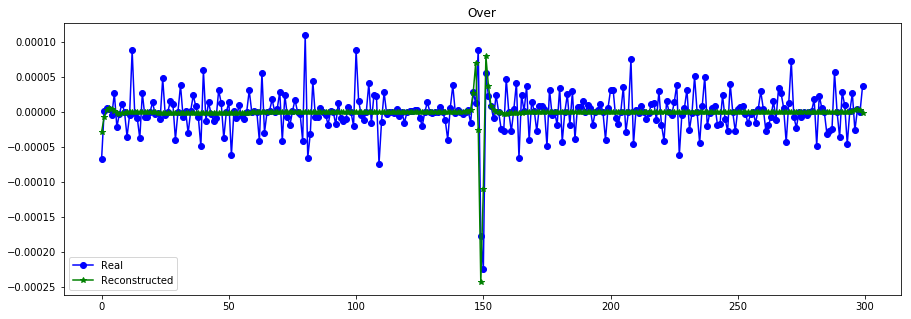

----------------------------------------------------------------
Real scale = 0.000004
Pred scale = 0.000005


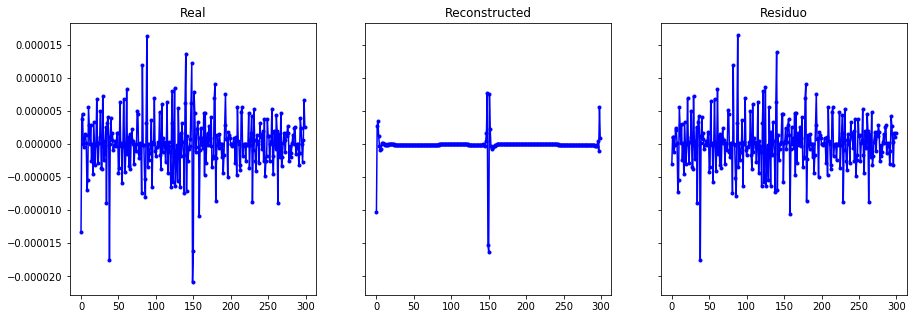

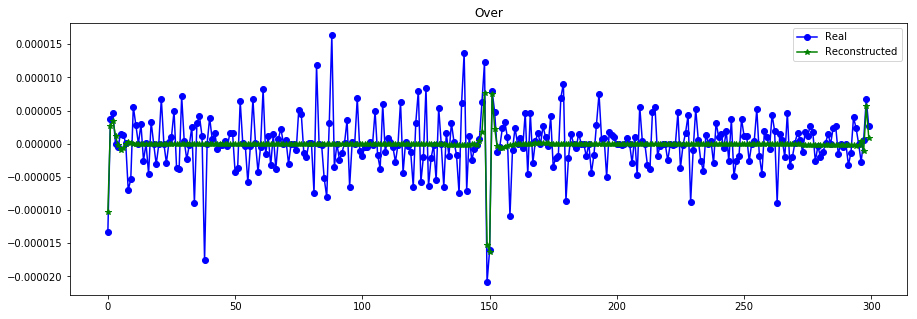

----------------------------------------------------------------
Real scale = 0.000029
Pred scale = 0.000025


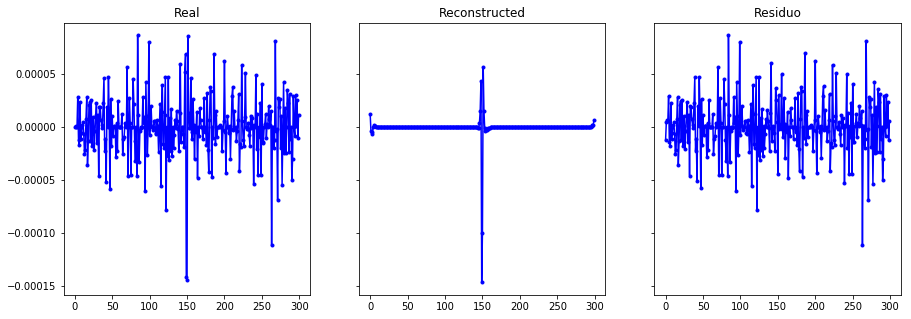

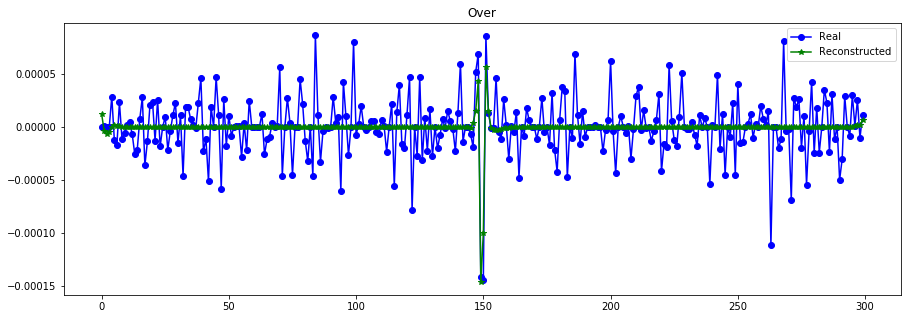

----------------------------------------------------------------
Real scale = 0.000026
Pred scale = 0.000028


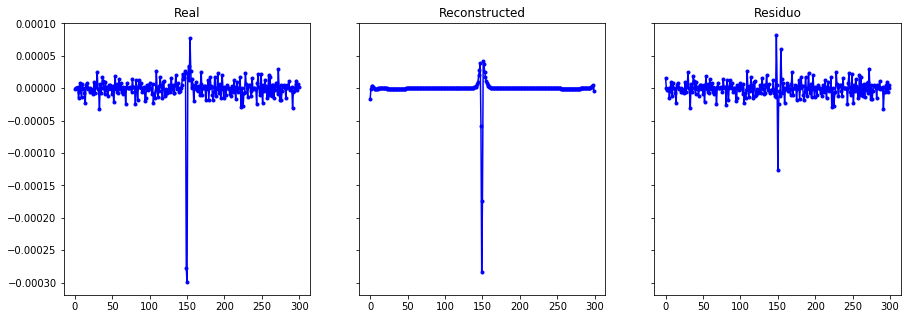

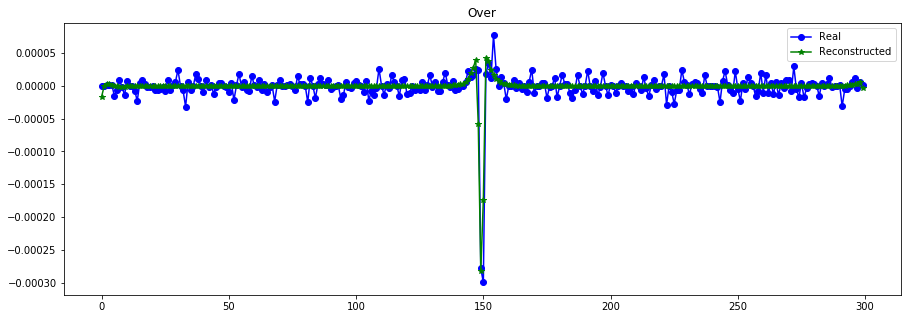

----------------------------------------------------------------
Real scale = 0.000012
Pred scale = 0.000011


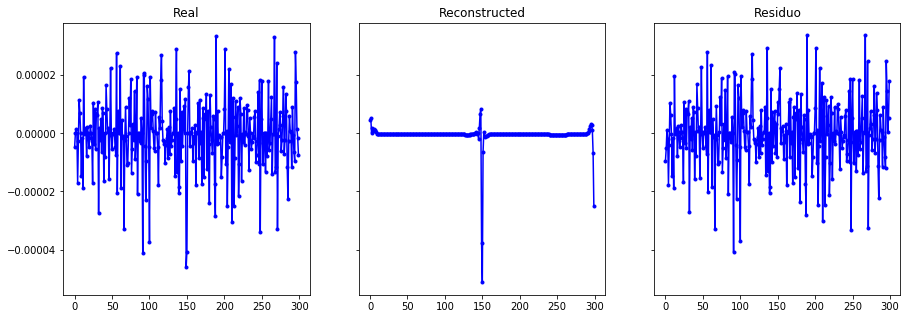

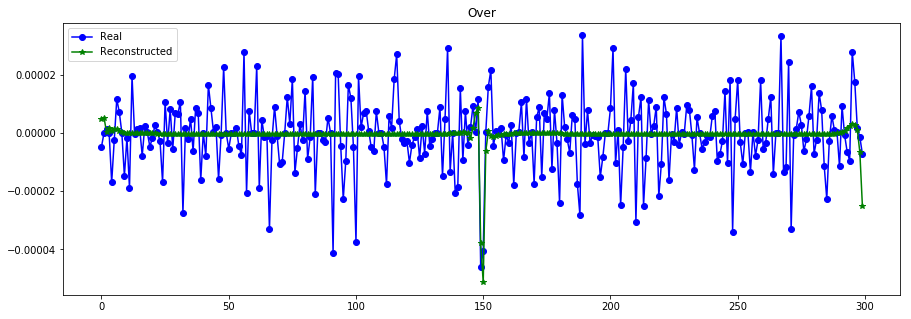

----------------------------------------------------------------
Real scale = 0.000005
Pred scale = 0.000006


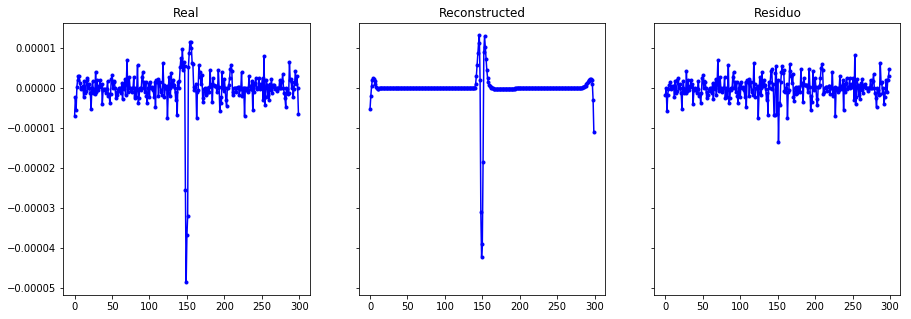

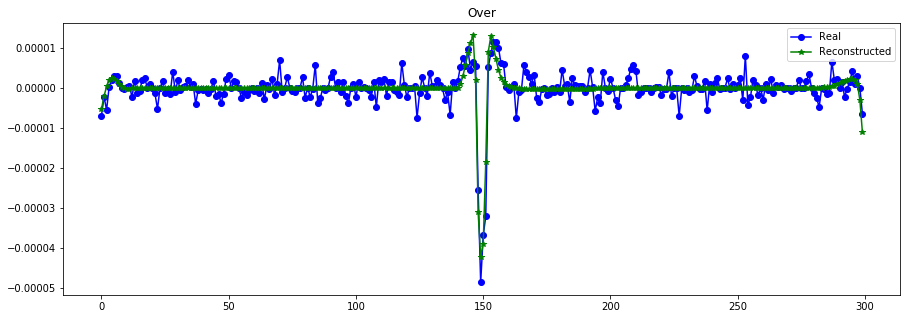

----------------------------------------------------------------
Real scale = 0.001726
Pred scale = 0.001605


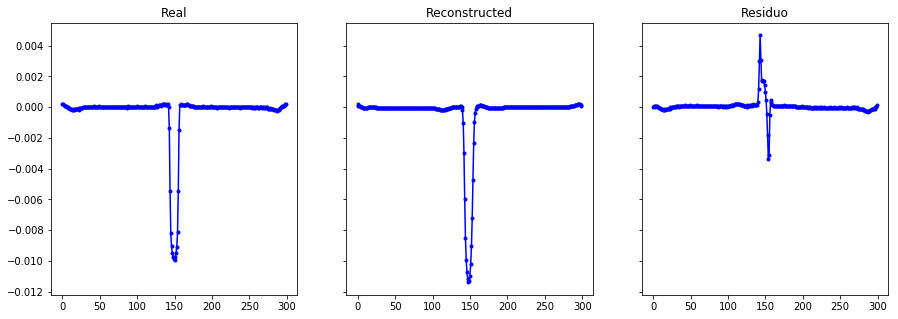

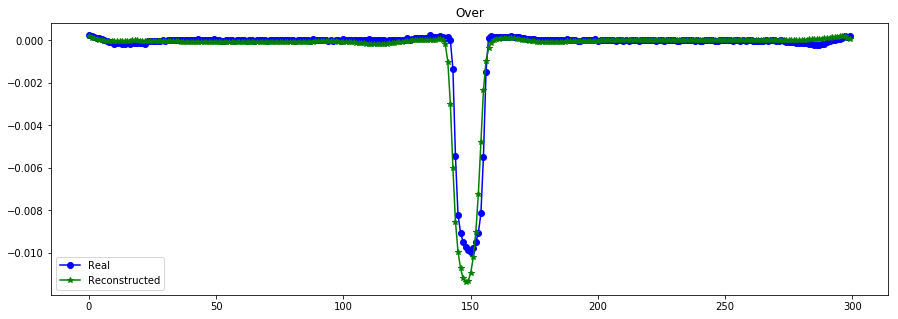

----------------------------------------------------------------
Real scale = 0.000019
Pred scale = 0.000019


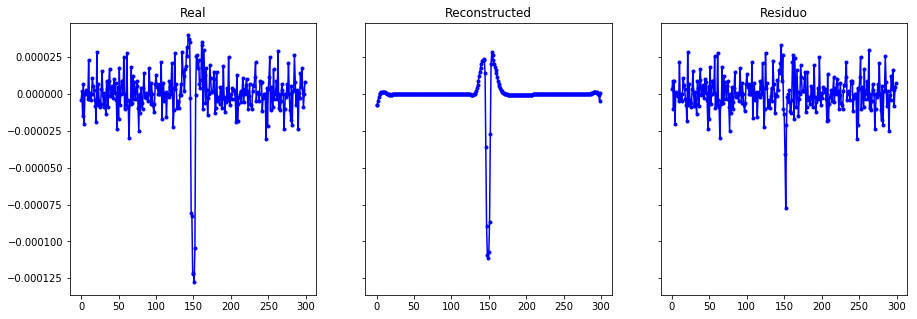

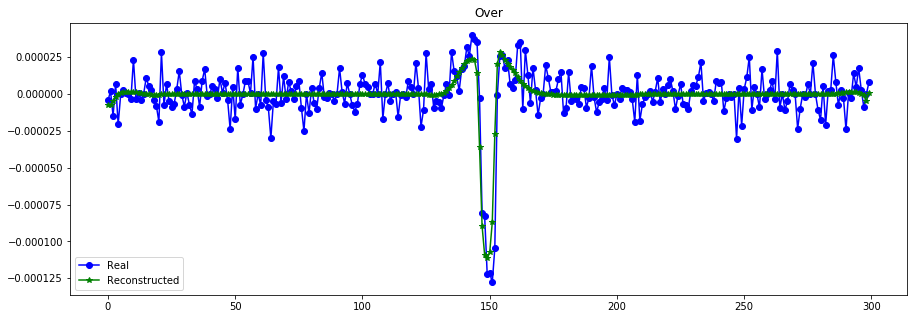

----------------------------------------------------------------
Real scale = 0.000024
Pred scale = 0.000022


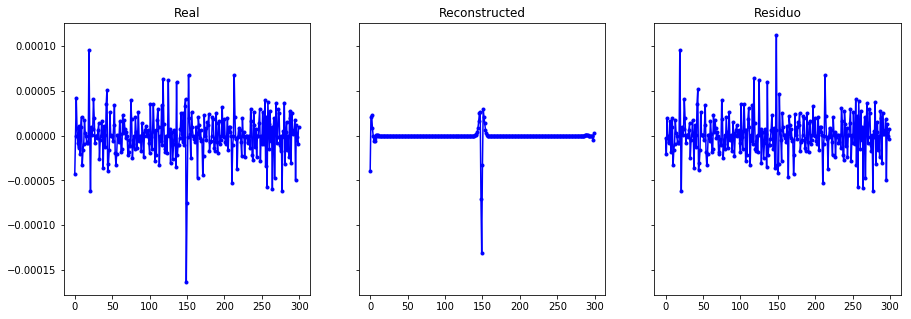

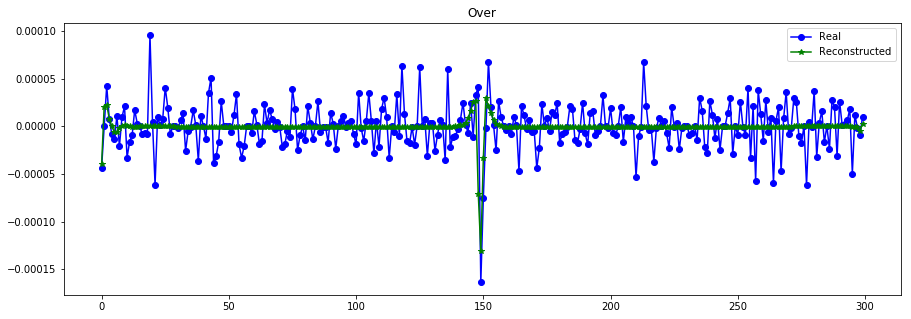

----------------------------------------------------------------
Real scale = 0.000025
Pred scale = 0.000023


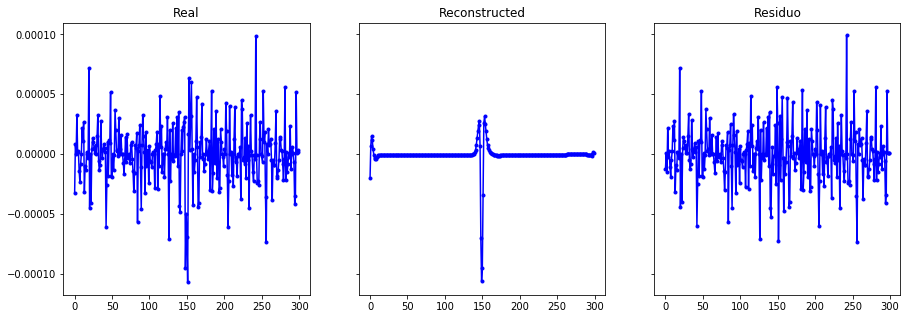

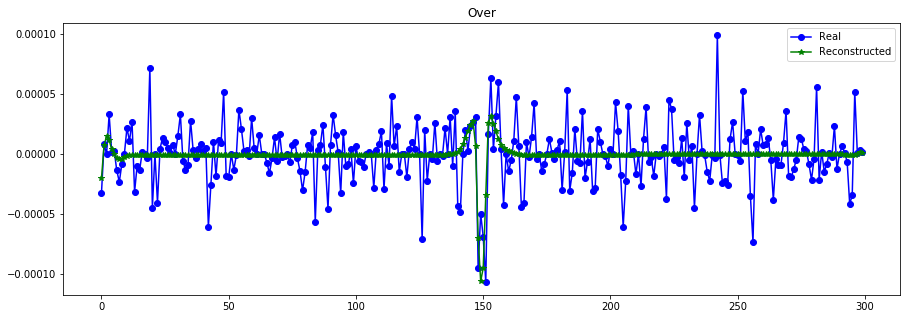

----------------------------------------------------------------
Real scale = 0.000014
Pred scale = 0.000013


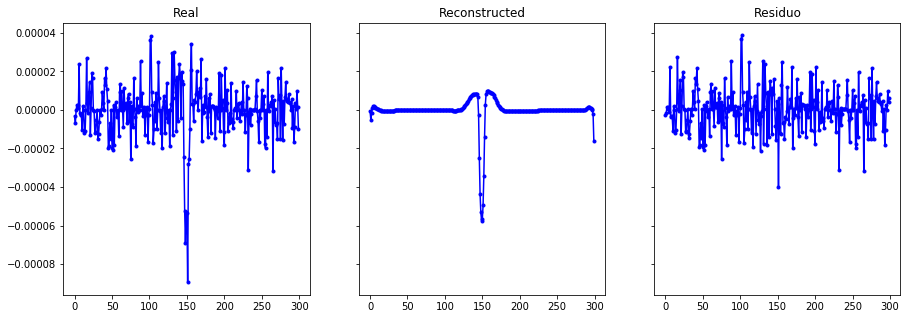

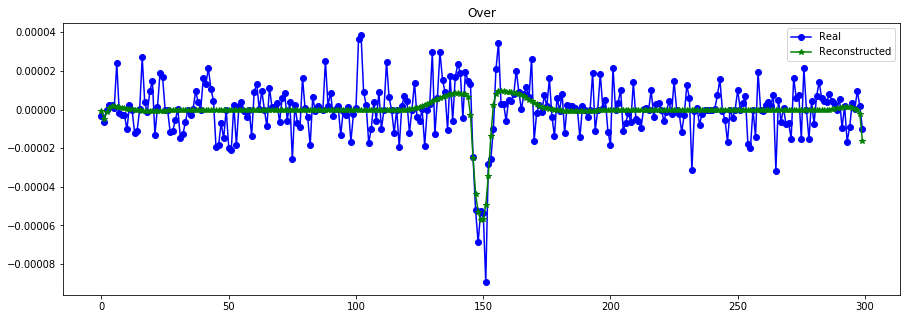

----------------------------------------------------------------
Real scale = 0.000045
Pred scale = 0.000049


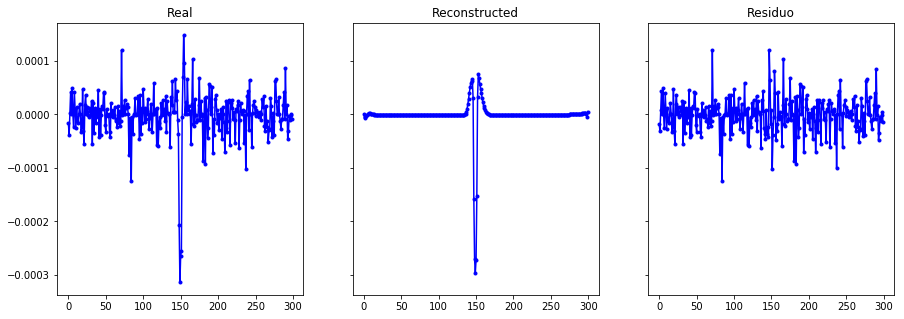

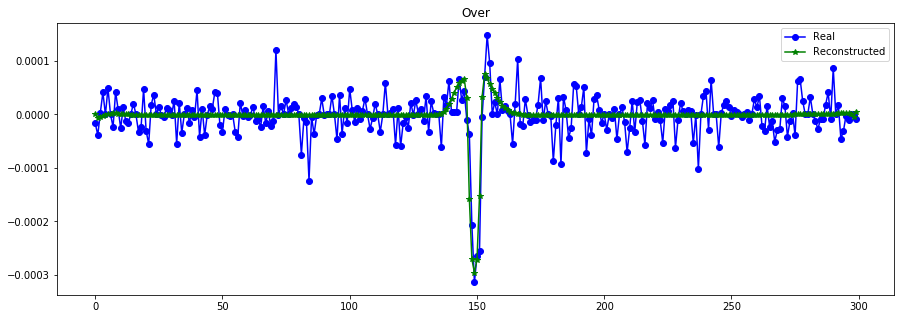

----------------------------------------------------------------


In [137]:
plot_n_lc(X_train[:N,:,0], X_train_hat, n= 15, s=[S_train[:N],1/Sinv_train_hat]) #

In [69]:
#vae.save_weights("./models/%dT_%dD_%de_VAE_scaleLlow.h5"%(T,latent_dim,400))
vae.get_layer("encoder").save_weights("./models/VAEscaleLow_%dT_%dD_%de_E.h5"%(T,latent_dim,400))
vae.get_layer("generator").save_weights("./models/VAEscaleLow_%dT_%dD_%de_D.h5"%(T,latent_dim,400))

#### KL mas alto peso
-- mas suave.. re-ejecutar
Se le olvida predecir bien las otras loss-- al optimizar kL tambien al modelo le cuesta ajustar los pics.. (los valores minimos) en especial cuando son pocos..

In [54]:
def Wvae_loss(y_true, y_pred):    
    return smse_LC(y_true, y_pred) + l*kl_loss(y_true, y_pred) + 0.1*mse_S(y_true, y_pred) 

vae.compile(optimizer='adam', loss=Wvae_loss, metrics = [smse_LC,kl_loss,mse_S])

hist = vae.fit([X_train_t, X_train, Sinv_train], X_train, epochs=300, batch_size=batch_size)
## modelo de codificar mas simple.. a 1

Epoch 1/200
8634/8634 [==============================] - 31s 4ms/step - loss: 1.3452 - SMSE: 1.2248 - KL: 1.1276 - MSE_scale: 1.0906
Epoch 2/200
8634/8634 [==============================] - 26s 3ms/step - loss: 1.1476 - SMSE: 1.0356 - KL: 0.6729 - MSE_scale: 1.0526
Epoch 3/200
8634/8634 [==============================] - 26s 3ms/step - loss: 1.1432 - SMSE: 1.0326 - KL: 0.7446 - MSE_scale: 1.0320
Epoch 4/200
8634/8634 [==============================] - 26s 3ms/step - loss: 1.1186 - SMSE: 1.0173 - KL: 0.4434 - MSE_scale: 0.9680
Epoch 5/200
8634/8634 [==============================] - 26s 3ms/step - loss: 1.1139 - SMSE: 1.0167 - KL: 0.4865 - MSE_scale: 0.9241
Epoch 6/200
8634/8634 [==============================] - 26s 3ms/step - loss: 1.1072 - SMSE: 1.0138 - KL: 0.5102 - MSE_scale: 0.8829
Epoch 7/200
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0996 - SMSE: 1.0108 - KL: 0.5935 - MSE_scale: 0.8280
Epoch 8/200
8634/8634 [==============================] - 26s 3ms/step

8634/8634 [==============================] - 26s 3ms/step - loss: 0.7897 - SMSE: 0.7488 - KL: 3.3309 - MSE_scale: 0.0759
Epoch 124/200
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7813 - SMSE: 0.7387 - KL: 3.4521 - MSE_scale: 0.0815
Epoch 125/200
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7820 - SMSE: 0.7400 - KL: 3.4418 - MSE_scale: 0.0762
Epoch 126/200
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7906 - SMSE: 0.7489 - KL: 3.4264 - MSE_scale: 0.0743
Epoch 127/200
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7843 - SMSE: 0.7425 - KL: 3.4423 - MSE_scale: 0.0739
Epoch 128/200
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7725 - SMSE: 0.7298 - KL: 3.5170 - MSE_scale: 0.0755
Epoch 129/200
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7897 - SMSE: 0.7445 - KL: 3.7418 - MSE_scale: 0.0781
Epoch 130/200
8634/8634 [==============================] - 26s 3ms/st

/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


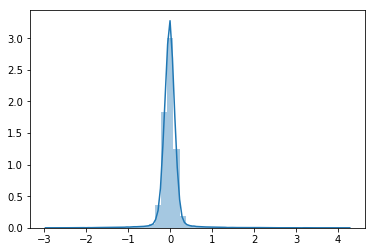

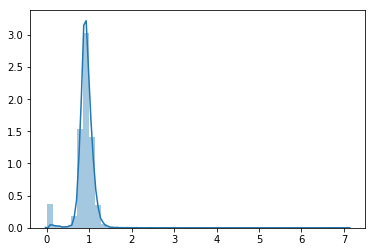

In [55]:
encoder_all = Model([x_t, x_lc,s], [z_mean, z_log_var], name="encoder")
z_aux, z_var_aux = encoder_all.predict([X_train_t,X_train, Sinv_train], batch_size=512)

sns.distplot(z_aux.flatten())
plt.show()
sns.distplot(np.exp(z_var_aux.flatten()))
plt.show()

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


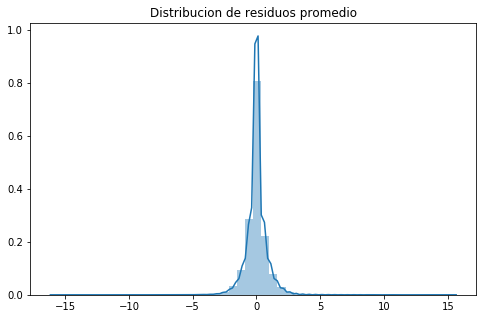

MSE      =  0.6683160012718964
RMSE (+-)=  0.7910115813445291
MAE  (+-)=  0.50963422193106
--------- Smoothness ------------
AutoCorr lag-one =  0.7620951734304091
Diff MEAN =  0.046152809629192805
Diff STD =  0.21667743072859474
--------- Smoothness ------------
MSE de escala escalado=  0.23017131443151706


array([[ 1061.4635],
       [25618.27  ],
       [66633.08  ],
       ...,
       [13332.807 ],
       [58045.62  ],
       [14631.289 ]], dtype=float32)

In [56]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], Sinv_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]*Sinv_train[:N,None,:], X_train_hat*Sinv_train[:N,None,:])

Sinv_train_hat = Sinv_model.predict([X_train_t[:N],X_train[:N], Sinv_train[:N]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error(S_train[:N], 1/Sinv_train_hat)*(1/S_std)**2)
Sinv_train_hat

Real scale = 114065.052388
Pred scale = 143052.765625


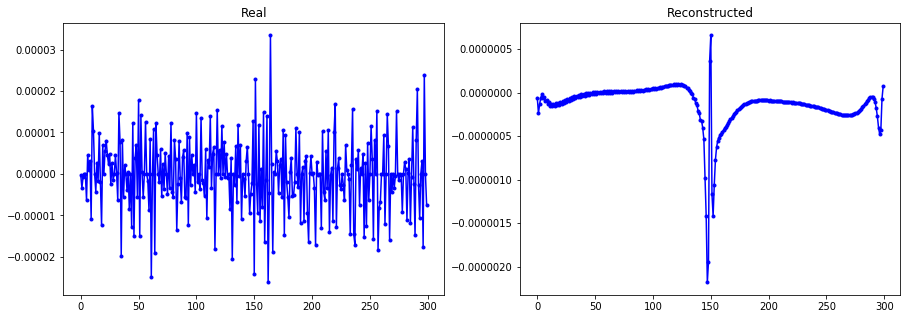

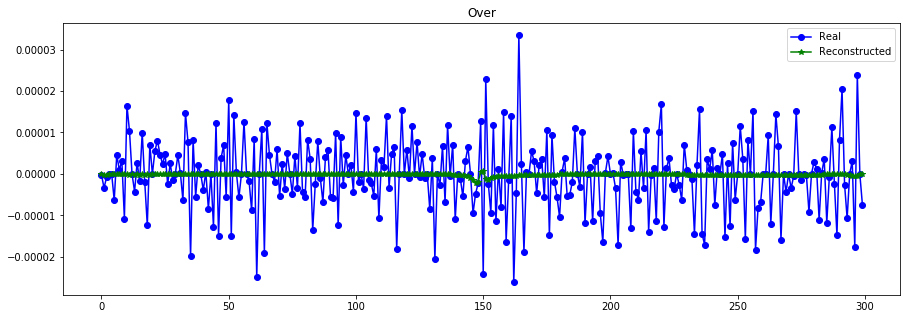

----------------------------------------------------------------
Real scale = 31054.204701
Pred scale = 26724.410156


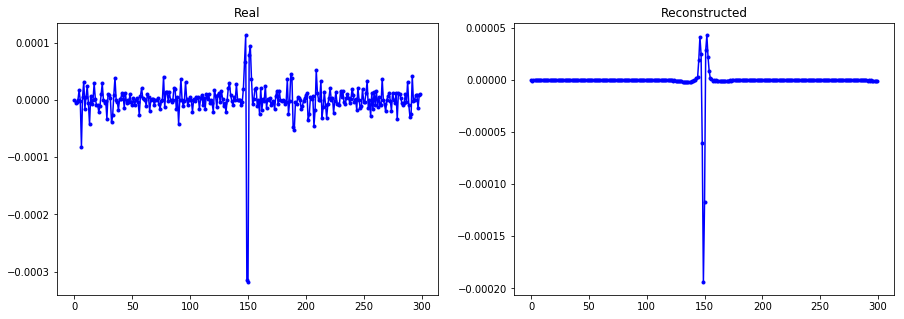

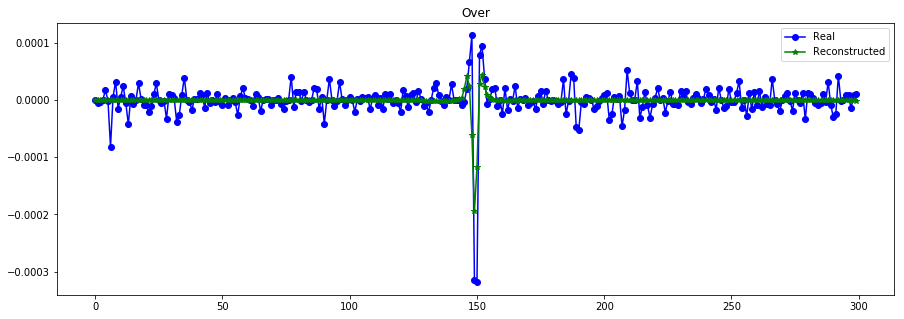

----------------------------------------------------------------
Real scale = 12276.618850
Pred scale = 8689.735352


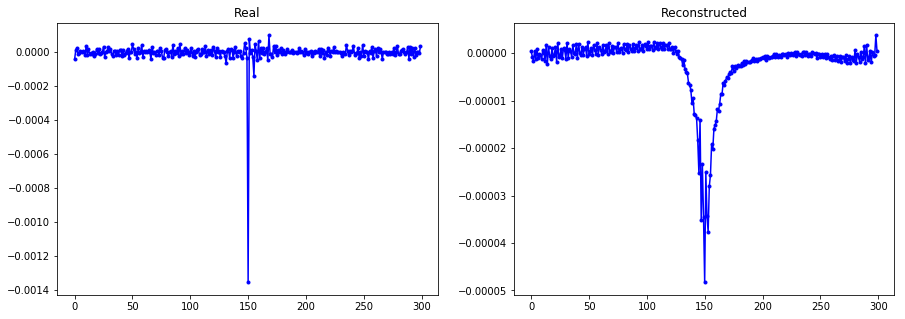

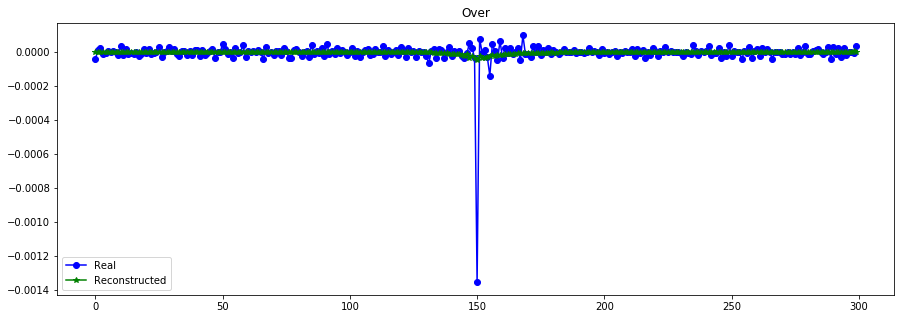

----------------------------------------------------------------
Real scale = 19157.455803
Pred scale = 15973.251953


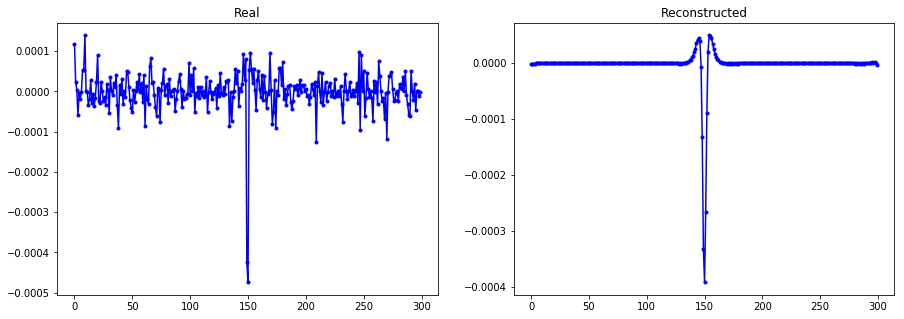

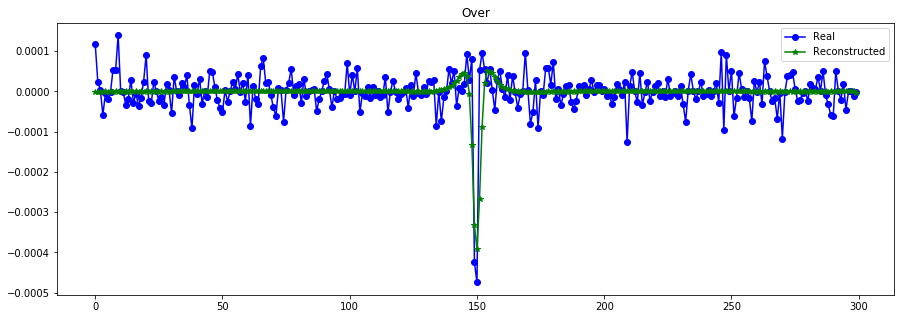

----------------------------------------------------------------
Real scale = 63873.168170
Pred scale = 54055.625000


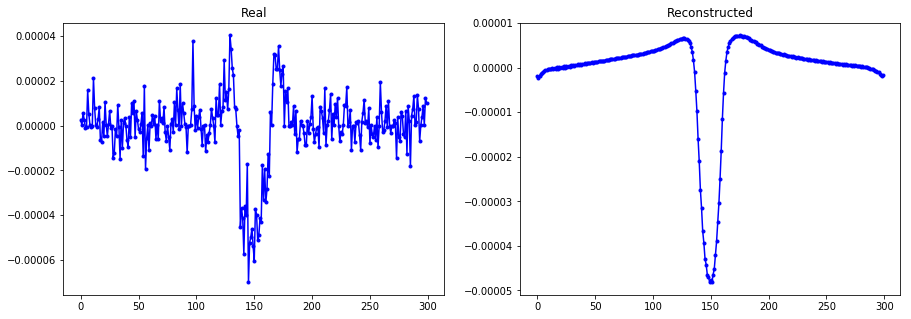

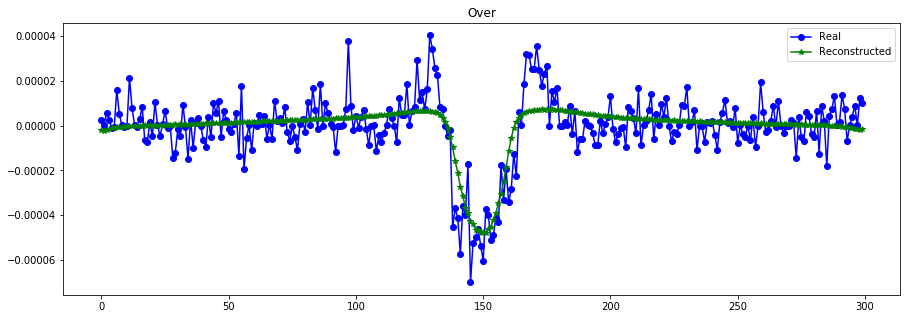

----------------------------------------------------------------
Real scale = 85000.531221
Pred scale = 63625.464844


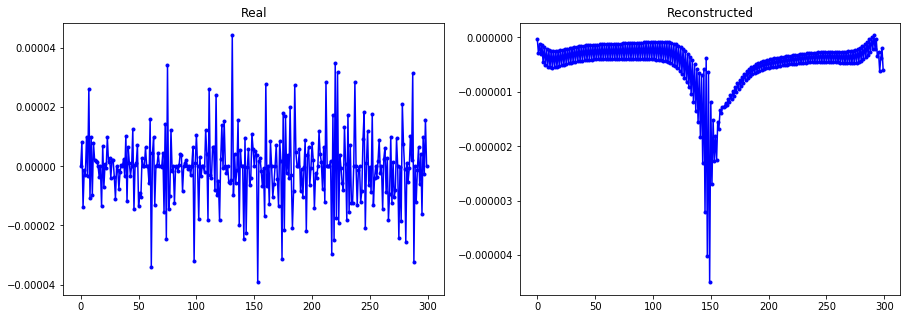

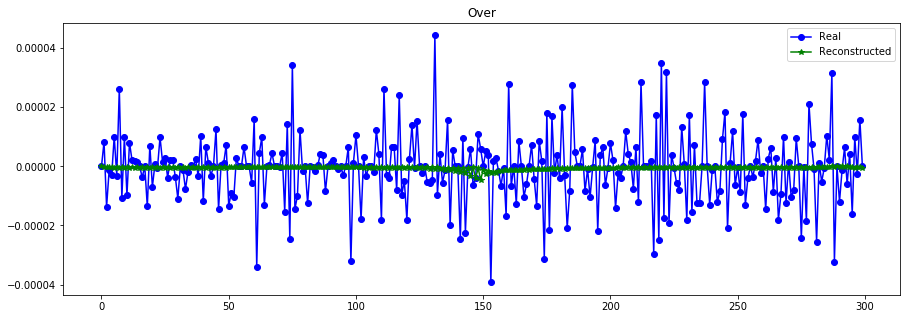

----------------------------------------------------------------
Real scale = 15164.514224
Pred scale = 21707.591797


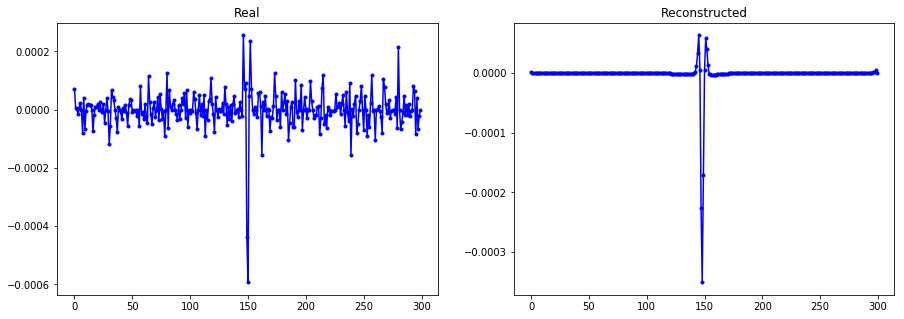

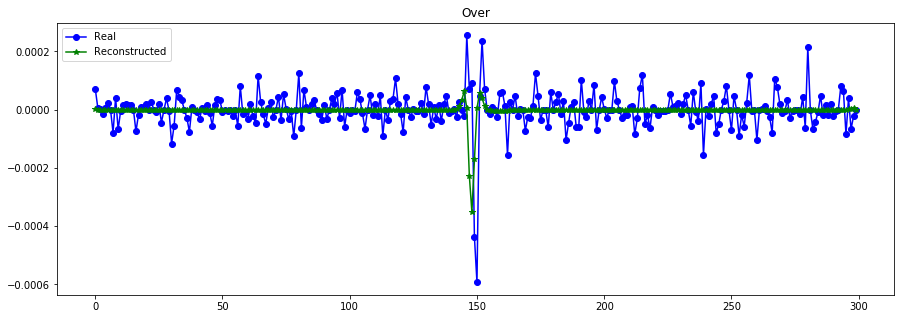

----------------------------------------------------------------
Real scale = 29563.446469
Pred scale = 40046.304688


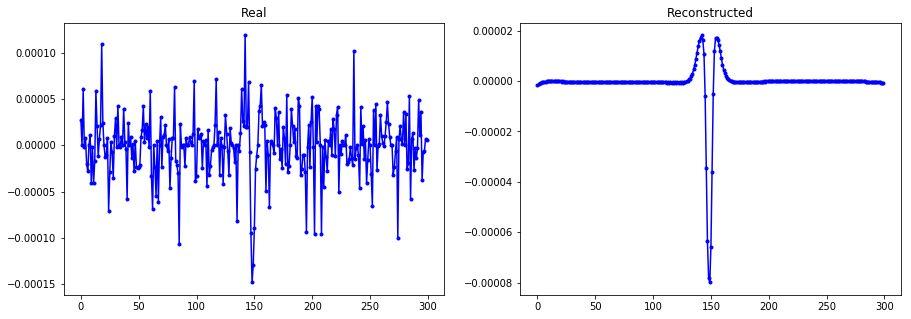

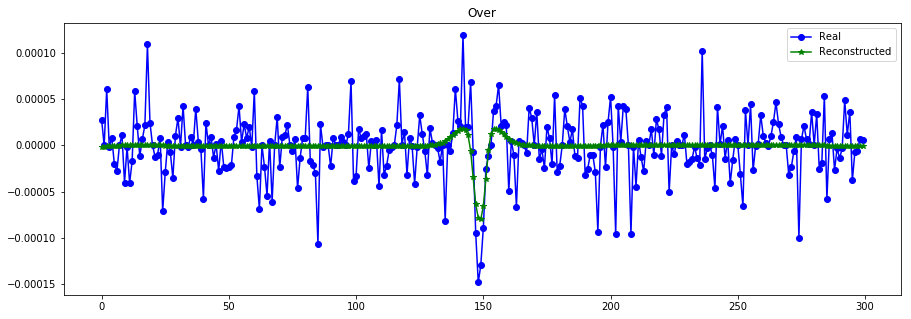

----------------------------------------------------------------
Real scale = 27162.425651
Pred scale = 20993.402344


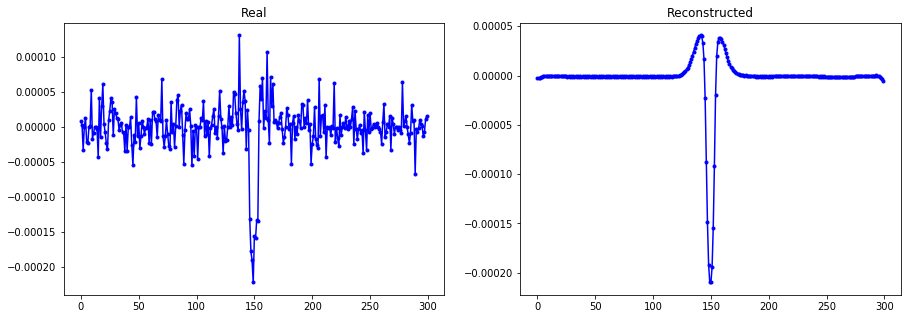

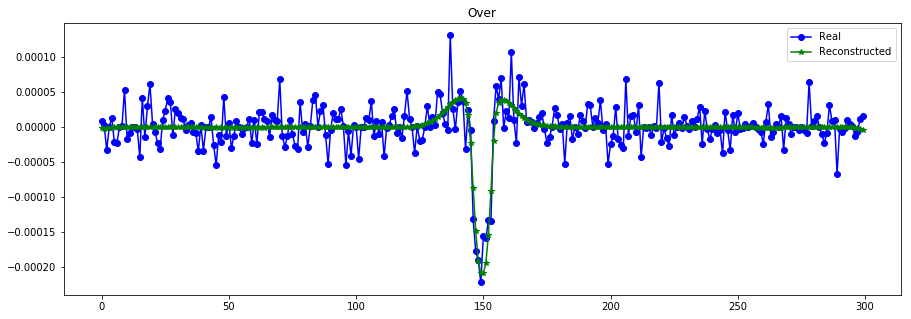

----------------------------------------------------------------
Real scale = 81576.081401
Pred scale = 84445.421875


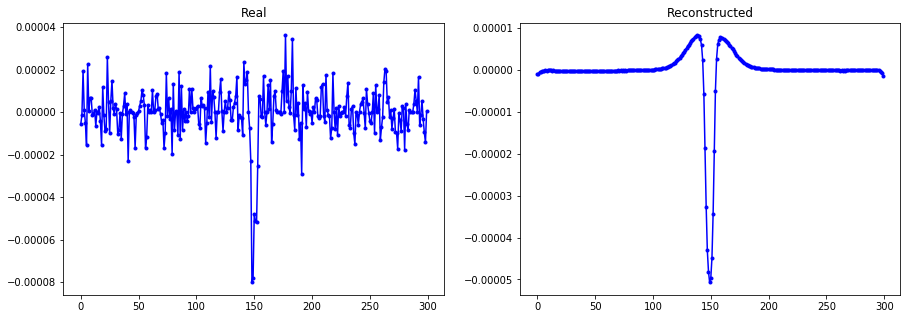

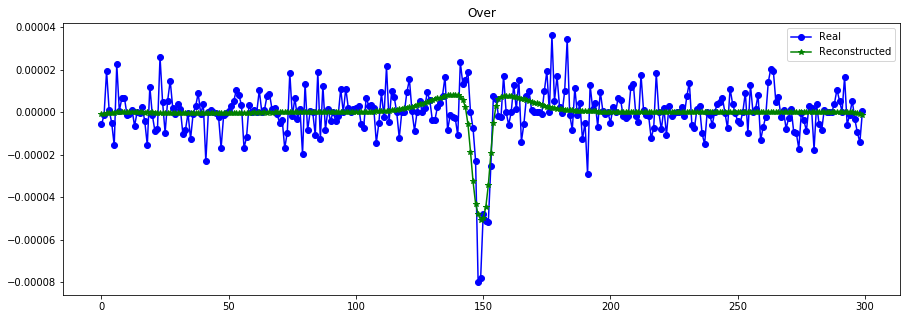

----------------------------------------------------------------
Real scale = 23302.397160
Pred scale = 18516.789062


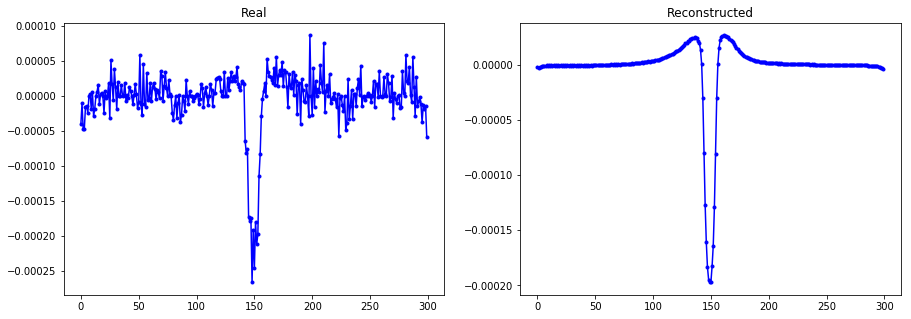

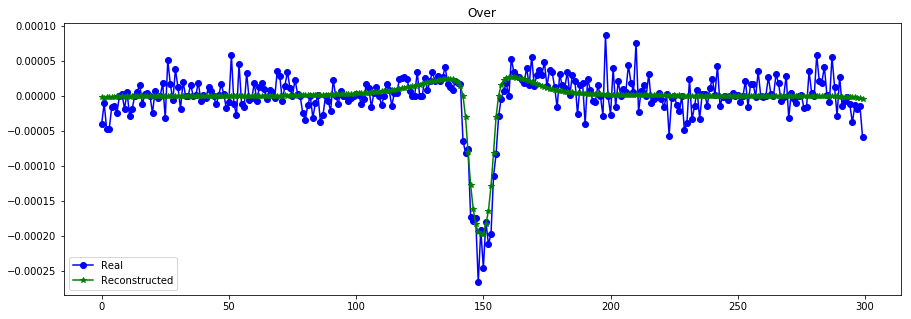

----------------------------------------------------------------
Real scale = 62503.707830
Pred scale = 54919.343750


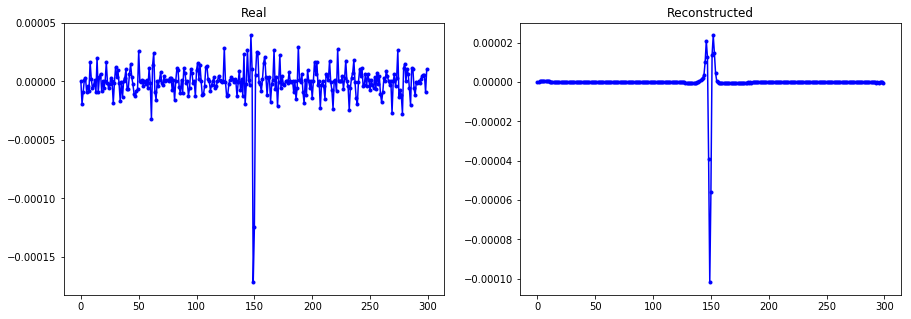

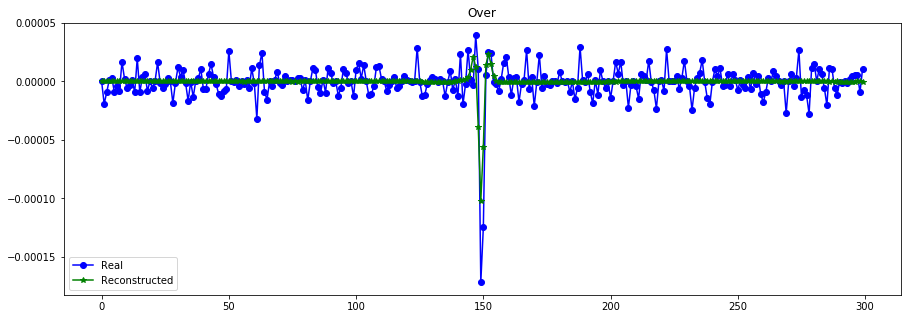

----------------------------------------------------------------
Real scale = 297400.833569
Pred scale = 178988.281250


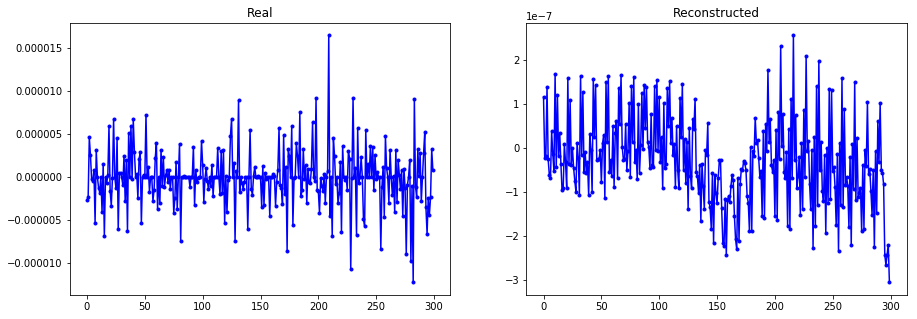

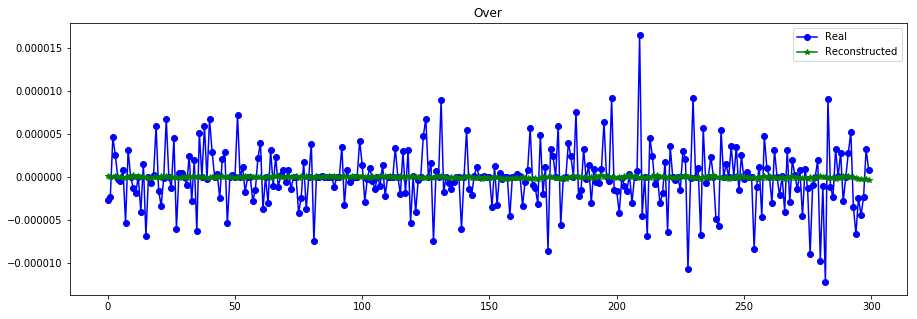

----------------------------------------------------------------
Real scale = 19041.367244
Pred scale = 21908.392578


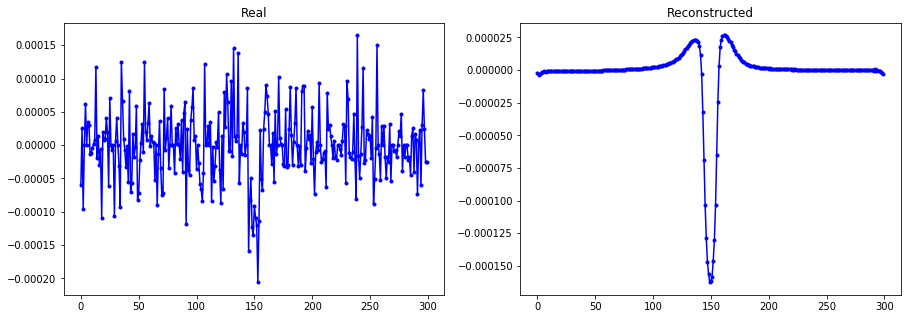

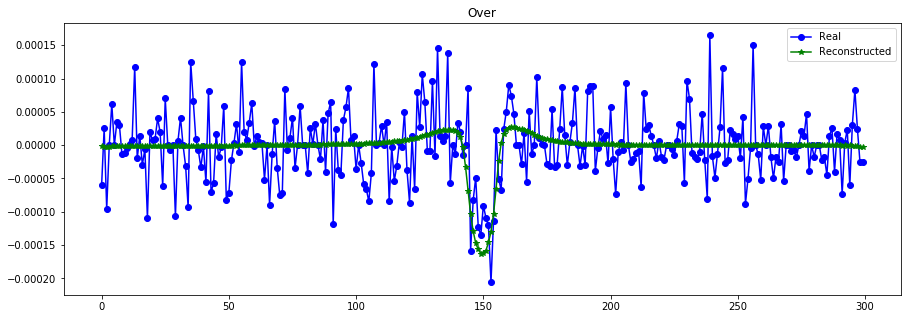

----------------------------------------------------------------
Real scale = 18718.988671
Pred scale = 17257.867188


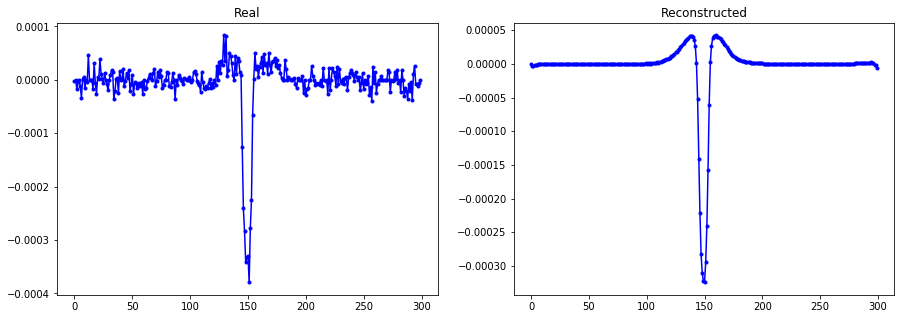

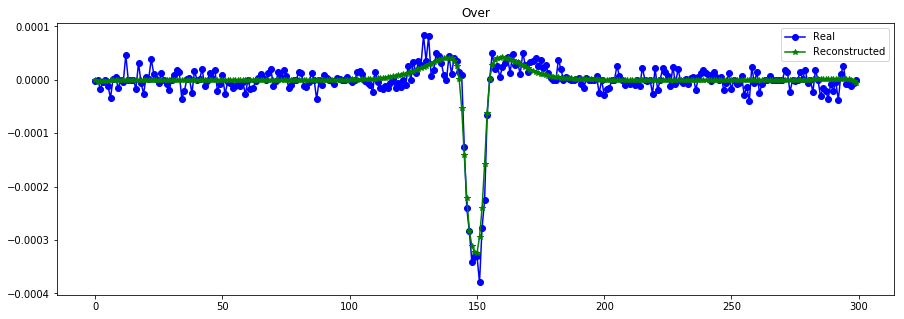

----------------------------------------------------------------


In [57]:
plot_n_lc(X_train[:N,:,0], X_train_hat, n= 15, s=[S_train[:N],1/Sinv_train_hat]) #

In [49]:
def Wvae_loss(y_true, y_pred):    
    return smse_LC(y_true, y_pred) + l*kl_loss(y_true, y_pred) + 0.5*mse_S(y_true, y_pred) 

vae.compile(optimizer='adam', loss=Wvae_loss, metrics = [smse_LC,kl_loss,mse_S])

hist = vae.fit([X_train_t, X_train, Sinv_train], X_train, epochs=300, batch_size=batch_size)
## modelo de codificar mas simple.. a 1

Epoch 1/400
8634/8634 [==============================] - 31s 4ms/step - loss: 2.2062 - SMSE: 1.3007 - KL: 1.2278 - MSE_scale: 1.7865
Epoch 2/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.6311 - SMSE: 1.0674 - KL: 2.9348 - MSE_scale: 1.0686
Epoch 3/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.4073 - SMSE: 1.0077 - KL: 7.0112 - MSE_scale: 0.6591
Epoch 4/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.3246 - SMSE: 1.0059 - KL: 7.3671 - MSE_scale: 0.4901
Epoch 5/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.2860 - SMSE: 1.0045 - KL: 6.9176 - MSE_scale: 0.4247
Epoch 6/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.2594 - SMSE: 1.0039 - KL: 6.0785 - MSE_scale: 0.3894
Epoch 7/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.2435 - SMSE: 1.0041 - KL: 5.3852 - MSE_scale: 0.3711
Epoch 8/400
8634/8634 [==============================] - 26s 3ms/step

8634/8634 [==============================] - 33s 4ms/step - loss: 0.7836 - SMSE: 0.7302 - KL: 4.3441 - MSE_scale: 0.0200
Epoch 123/400
8634/8634 [==============================] - 32s 4ms/step - loss: 0.7987 - SMSE: 0.7448 - KL: 4.4068 - MSE_scale: 0.0195
Epoch 124/400
8634/8634 [==============================] - 31s 4ms/step - loss: 0.7981 - SMSE: 0.7456 - KL: 4.2996 - MSE_scale: 0.0191
Epoch 125/400
8634/8634 [==============================] - 31s 4ms/step - loss: 0.7887 - SMSE: 0.7350 - KL: 4.3885 - MSE_scale: 0.0195
Epoch 126/400
8634/8634 [==============================] - 31s 4ms/step - loss: 0.7966 - SMSE: 0.7437 - KL: 4.3184 - MSE_scale: 0.0194
Epoch 127/400
8634/8634 [==============================] - 31s 4ms/step - loss: 0.8021 - SMSE: 0.7490 - KL: 4.3656 - MSE_scale: 0.0190
Epoch 128/400
8634/8634 [==============================] - 32s 4ms/step - loss: 0.7971 - SMSE: 0.7443 - KL: 4.3063 - MSE_scale: 0.0195
Epoch 129/400
8634/8634 [==============================] - 32s 4ms/st

8634/8634 [==============================] - 26s 3ms/step - loss: 0.7584 - SMSE: 0.7078 - KL: 4.2247 - MSE_scale: 0.0168
Epoch 243/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7799 - SMSE: 0.7300 - KL: 4.1401 - MSE_scale: 0.0170
Epoch 244/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7707 - SMSE: 0.7203 - KL: 4.1731 - MSE_scale: 0.0173
Epoch 245/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7972 - SMSE: 0.7475 - KL: 4.0528 - MSE_scale: 0.0183
Epoch 246/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7751 - SMSE: 0.7247 - KL: 4.1316 - MSE_scale: 0.0182
Epoch 247/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7730 - SMSE: 0.7226 - KL: 4.1433 - MSE_scale: 0.0179
Epoch 248/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7558 - SMSE: 0.7047 - KL: 4.2219 - MSE_scale: 0.0176
Epoch 249/400
8634/8634 [==============================] - 26s 3ms/st

8634/8634 [==============================] - 26s 3ms/step - loss: 1.2794 - SMSE: 0.7689 - KL: 50.2545 - MSE_scale: 0.0160
Epoch 363/400
8634/8634 [==============================] - 25s 3ms/step - loss: 1.2675 - SMSE: 0.7568 - KL: 50.2545 - MSE_scale: 0.0164
Epoch 364/400
8634/8634 [==============================] - 25s 3ms/step - loss: 1.2700 - SMSE: 0.7594 - KL: 50.2545 - MSE_scale: 0.0161
Epoch 365/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.2753 - SMSE: 0.7644 - KL: 50.2545 - MSE_scale: 0.0166
Epoch 366/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.2782 - SMSE: 0.7675 - KL: 50.2545 - MSE_scale: 0.0164
Epoch 367/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.2854 - SMSE: 0.7747 - KL: 50.2545 - MSE_scale: 0.0162
Epoch 368/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.2719 - SMSE: 0.7609 - KL: 50.2545 - MSE_scale: 0.0169
Epoch 369/400
8634/8634 [==============================] - 26s

/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


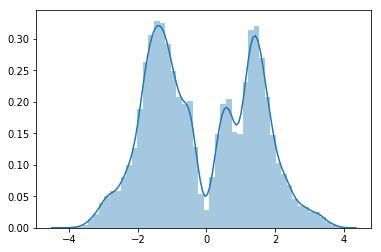

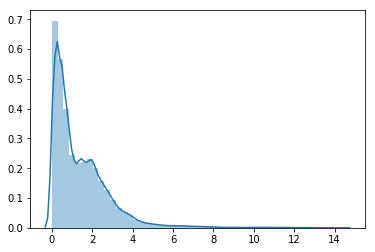

In [50]:
encoder_all = Model([x_t, x_lc,s], [z_mean, z_log_var], name="encoder")
z_aux, z_var_aux = encoder_all.predict([X_train_t,X_train, Sinv_train], batch_size=512)

sns.distplot(z_aux.flatten())
plt.show()
sns.distplot(np.exp(z_var_aux.flatten()))
plt.show()

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


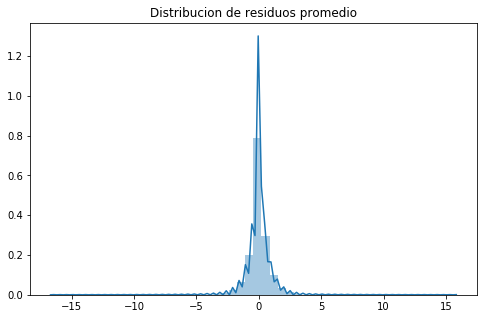

MSE      =  0.6712451588458053
RMSE (+-)=  0.792077137056245
MAE  (+-)=  0.5140650193372721
--------- Smoothness ------------
AutoCorr lag-one =  0.7800316565087834
Diff MEAN =  0.044190422814973214
Diff STD =  0.17836087636892314
--------- Smoothness ------------
MSE de escala escalado=  0.06905045079358746


array([[  951.95624],
       [29304.762  ],
       [91893.77   ],
       ...,
       [18421.766  ],
       [43553.094  ],
       [13999.617  ]], dtype=float32)

In [51]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], Sinv_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]*Sinv_train[:N,None,:], X_train_hat*Sinv_train[:N,None,:])

Sinv_train_hat = Sinv_model.predict([X_train_t[:N],X_train[:N], Sinv_train[:N]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error(S_train[:N], 1/Sinv_train_hat)*(1/S_std)**2)
Sinv_train_hat

Real scale = 43583.924281
Pred scale = 40819.011719


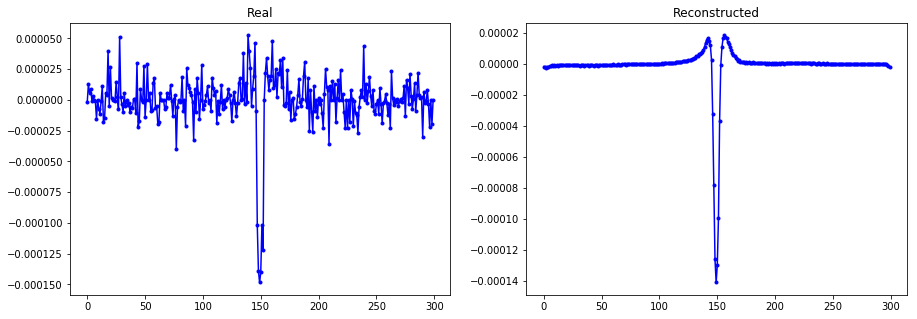

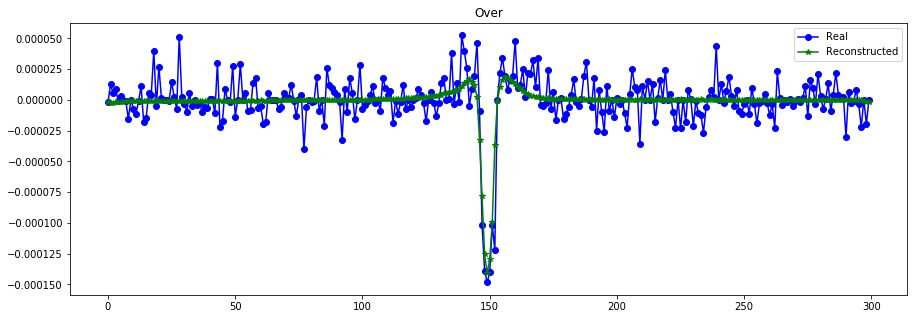

----------------------------------------------------------------
Real scale = 13994.150231
Pred scale = 14178.940430


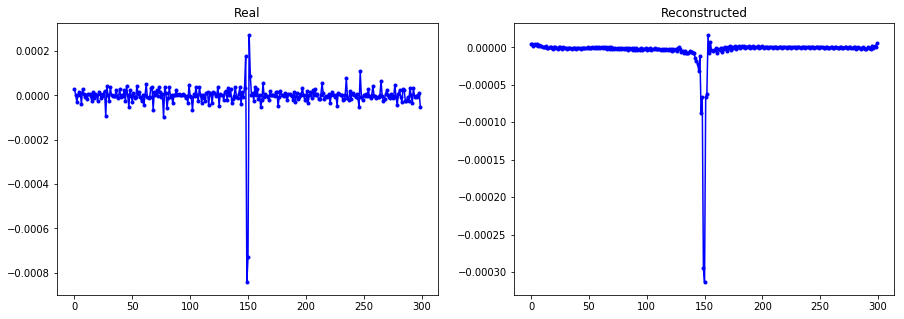

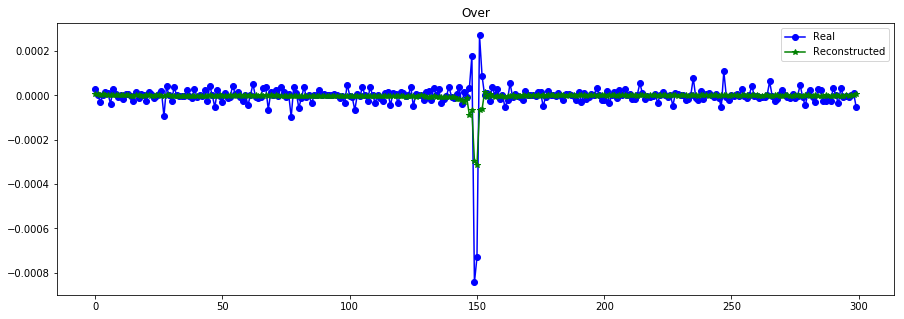

----------------------------------------------------------------
Real scale = 97924.326830
Pred scale = 108096.156250


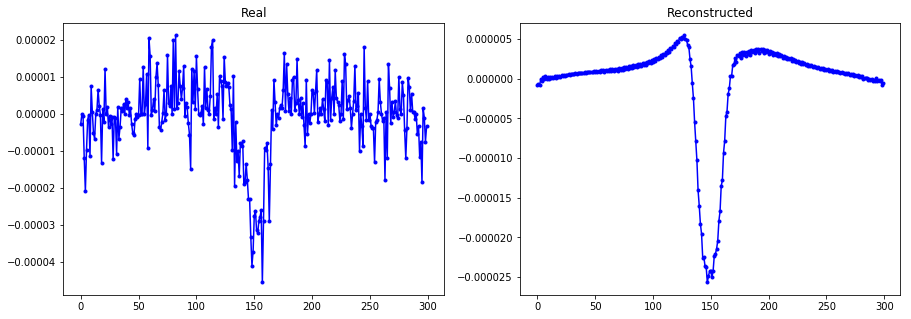

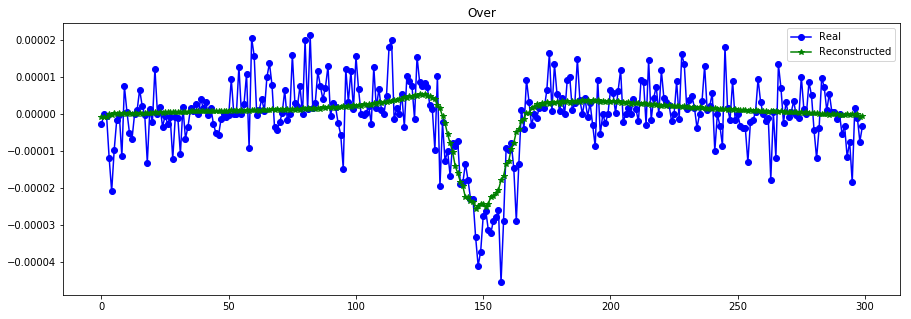

----------------------------------------------------------------
Real scale = 26528.399001
Pred scale = 27667.083984


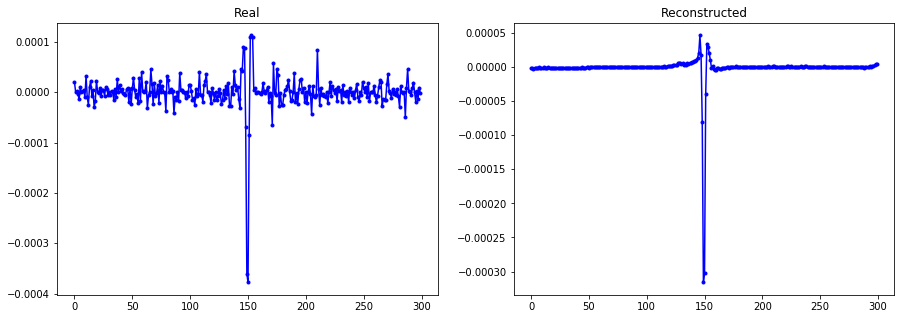

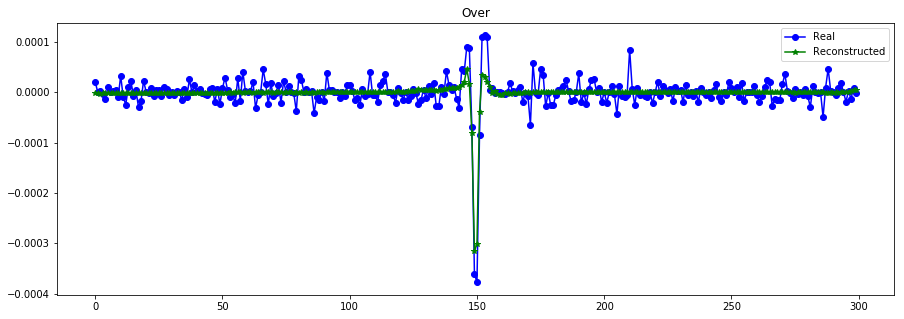

----------------------------------------------------------------
Real scale = 25042.817611
Pred scale = 29634.025391


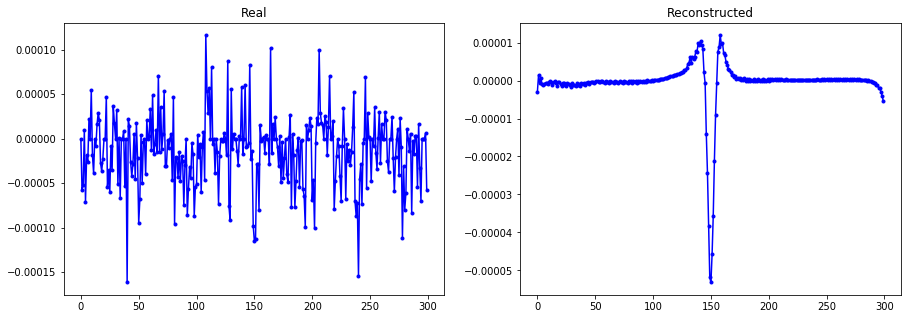

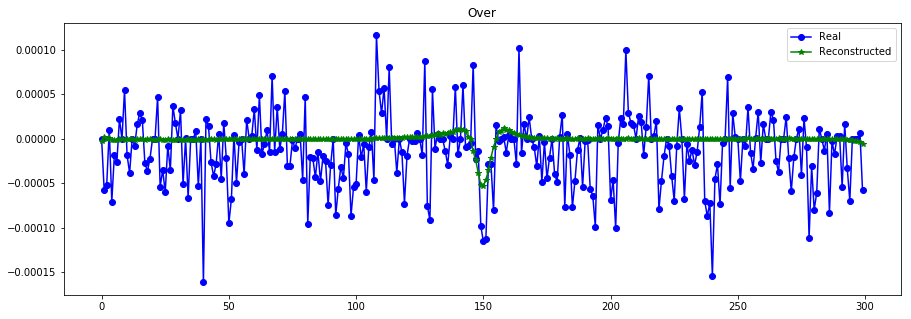

----------------------------------------------------------------
Real scale = 19364.380842
Pred scale = 18373.093750


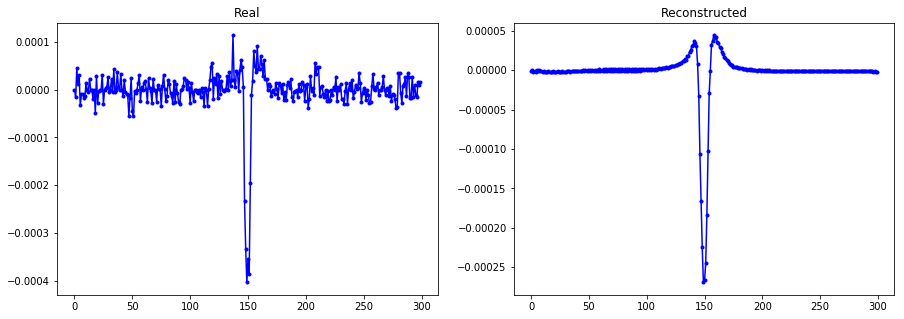

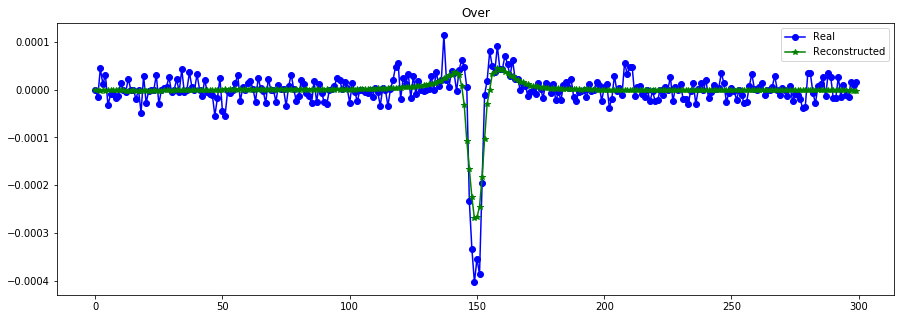

----------------------------------------------------------------
Real scale = 12132.758165
Pred scale = 13640.605469


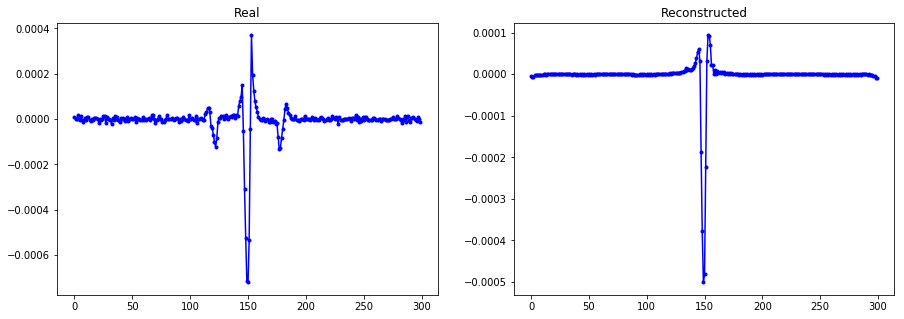

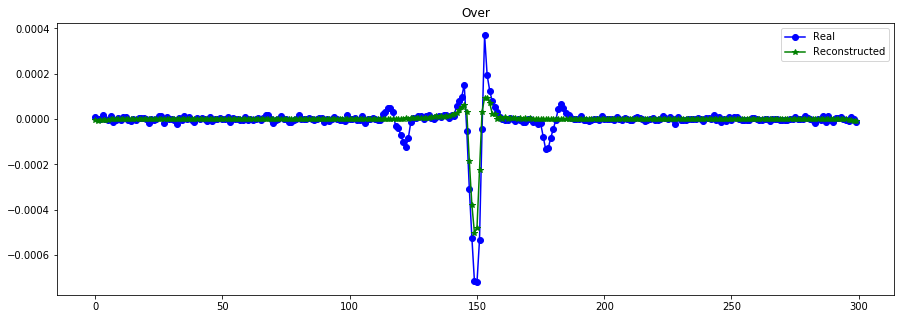

----------------------------------------------------------------
Real scale = 43666.907724
Pred scale = 51617.644531


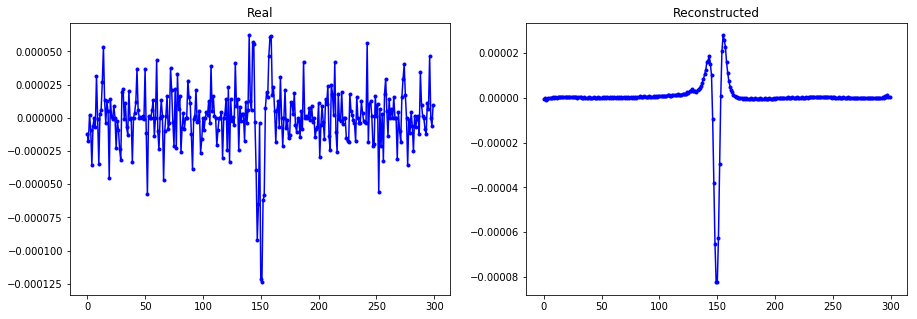

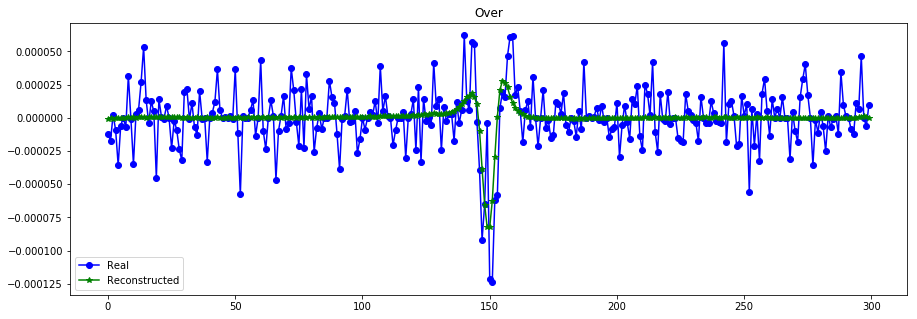

----------------------------------------------------------------
Real scale = 32585.644799
Pred scale = 31762.031250


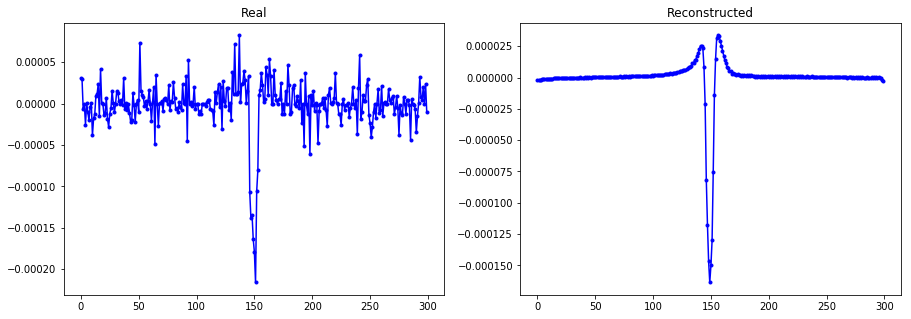

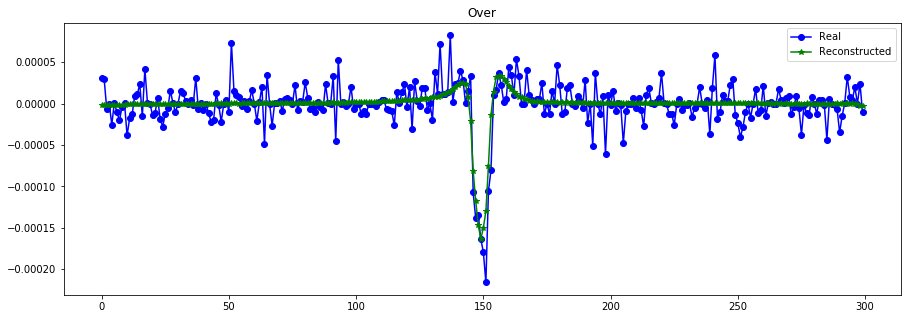

----------------------------------------------------------------
Real scale = 47023.478773
Pred scale = 51646.546875


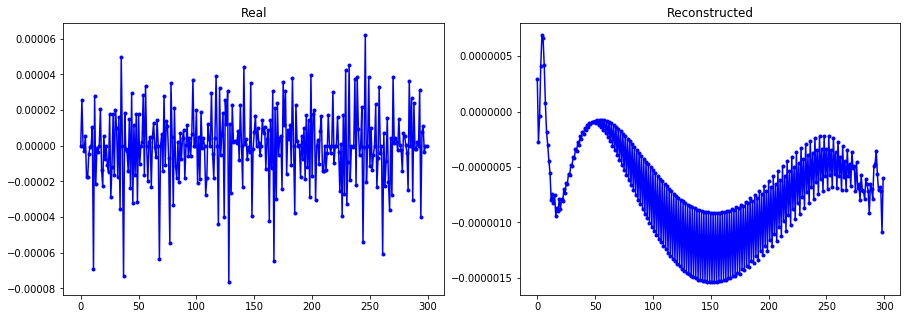

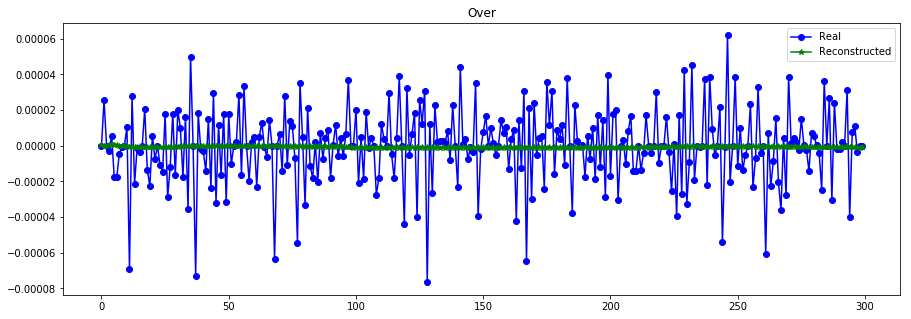

----------------------------------------------------------------
Real scale = 23922.119935
Pred scale = 21153.736328


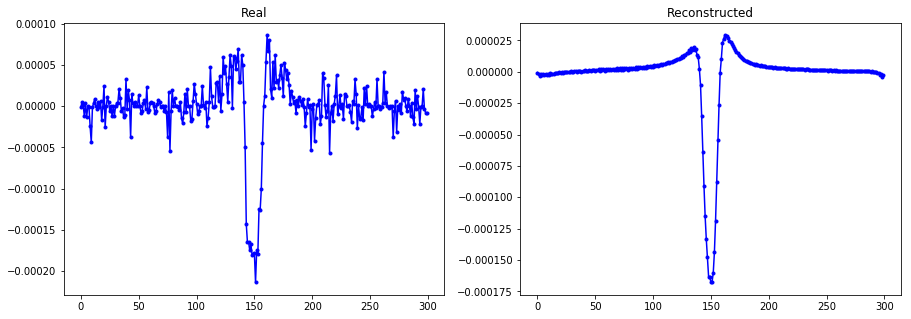

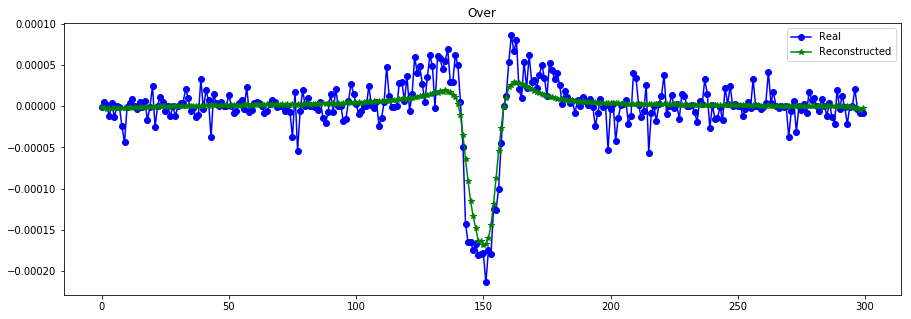

----------------------------------------------------------------
Real scale = 17347.343363
Pred scale = 20091.412109


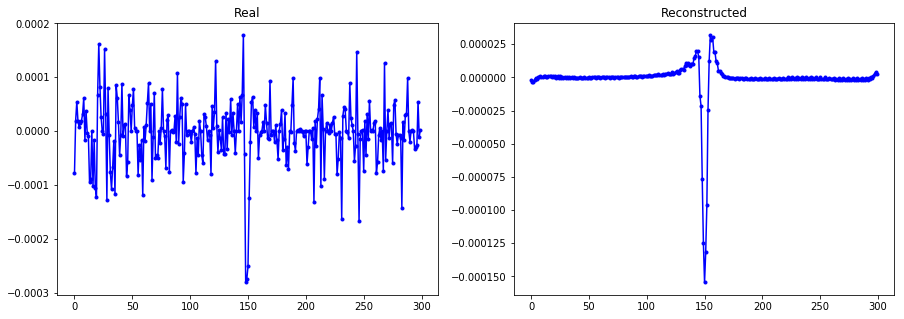

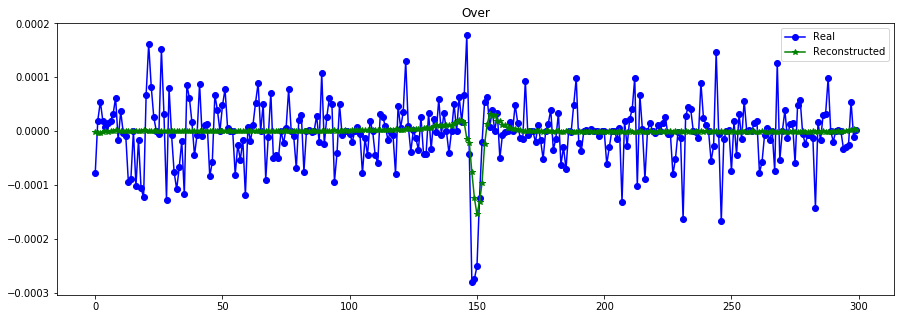

----------------------------------------------------------------
Real scale = 61630.529000
Pred scale = 60108.996094


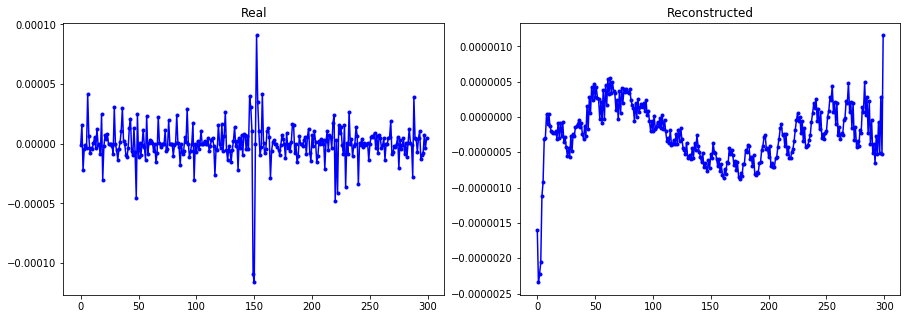

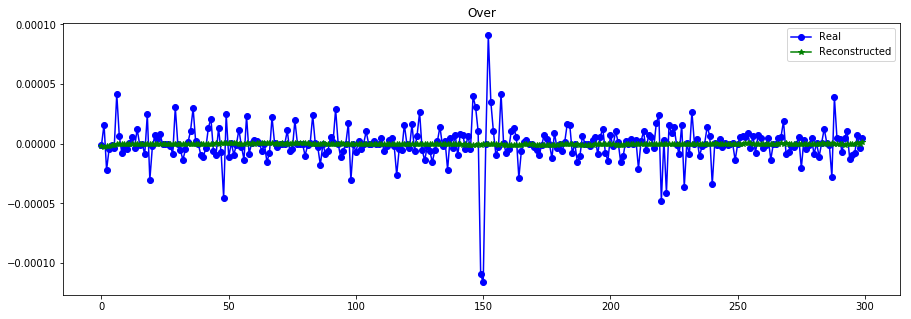

----------------------------------------------------------------
Real scale = 36119.113756
Pred scale = 50076.695312


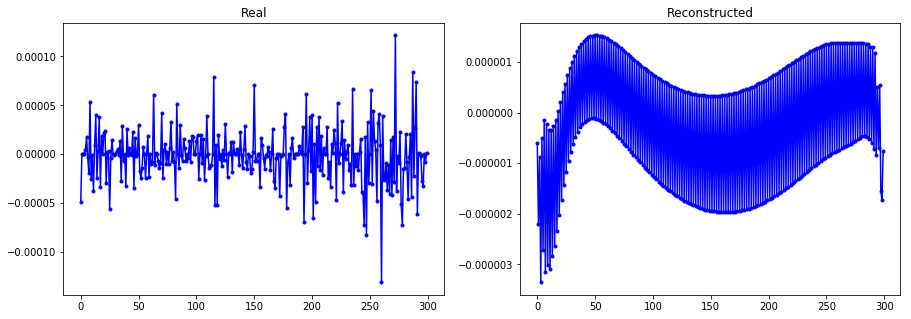

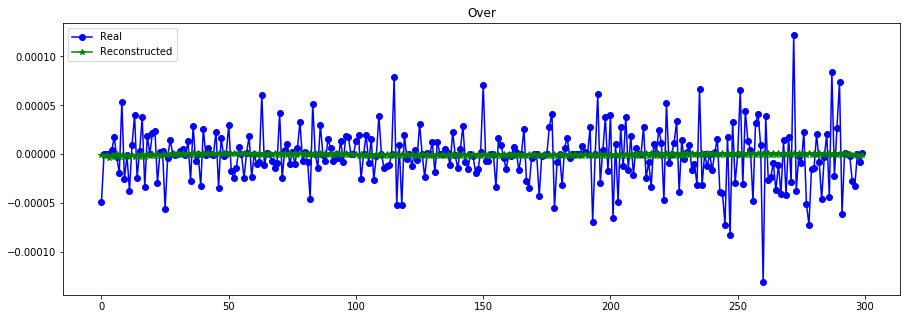

----------------------------------------------------------------
Real scale = 174415.919387
Pred scale = 179112.937500


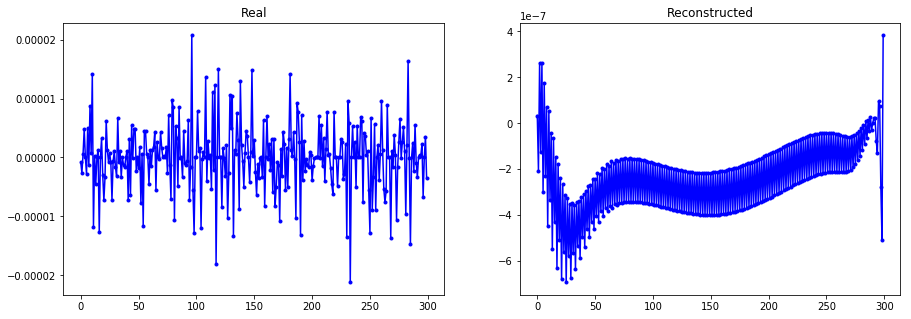

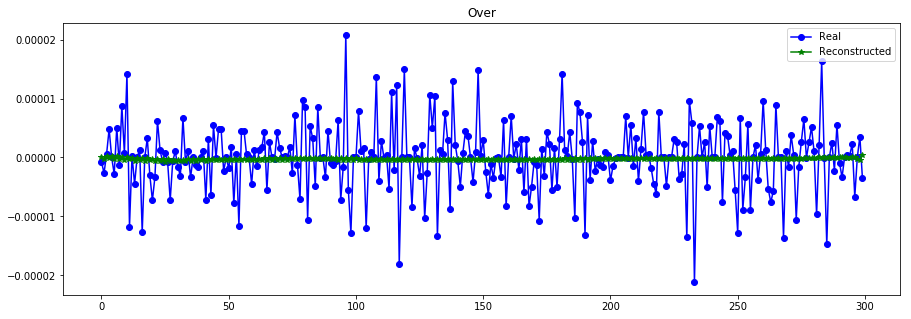

----------------------------------------------------------------


In [52]:
plot_n_lc(X_train[:N,:,0], X_train_hat, n= 15, s=[S_train[:N],1/Sinv_train_hat]) #

* subir peso KL (aumenta error y se vuelve mas smooth) **probar como modelo smooth en el futuro**
* disminuir D a 16 -- funciona bien.. aumenta leve error

MSE scale es el MSe de la escala (std) normalizada

|Técnicas| RMSE | MAE |.| AutoCorr| Diff Mean | Residuo corr| Residuo spectral-H| MSE scale|
|---     |---   |---  |---|---    |---        |---          |---                |---       |
|Curva   | -    | -   |.|  0.27   | 0.78      |  ...        |  ...              |  ...     |
|**AE-32**|0.64|0.45|.|0.46|   0.87           |   
|**VAE-32**|0.69|0.48|.|         0.58|   0.07 |  -0.04      |   0.90            |
|**VAE-32 (+S_inv)**|0.69|0.48|.|0.58|   0.07 |  -0.04      |   0.90            | 0.17     |
|**VAE-16 (+S_inv)**|0.74|0.49|.|0.64|   0.06 |   0.00      |   0.90            | 0.15     |
|**VAE-32 (+S_inv) high KL**|...|...|.|...|   ...        | ...  |
|**VAE-32 (+Scale)**|0.69|0.48|.|0.61|   0.08 |  -0.05      |   0.90            | 0.23     |
|**VAE-16 (+Scale)**|0.76|0.50|.|0.69|   0.05 |  -0.01      |   0.90            | 0.32     |
|**VAE-32 (+Scale) high KL**|0.77|0.51|.|0.82|0.05| 0.04    |   0.90            | 0.32     |

## SCALED - VAE 

Idea: aprender el comportamiento/patrones/formas/ de los datos sin su escala (std) - VAE normal ejecutado - de manera simultánea y paralela con la escala de los datos (comúnmente asociada a ruido).

> Ventajas:
* Misma reconstrucción que VAE normal (como es de esperar)
* reconstruye datos en la escala original (representación raw) de la serie de tiempo, permitiendo generar datos aleatorios en esa escala
* Al añadir la escala se tiene más información para aprender, la representación oculta es mejor para detectar planetas (F1 macro-clasificación)
* Se encuentran grupos de comportamiento en representación.

* Cada dato $x^{(i)}$ tiene su escala $s^{(i)} = std(x^{(i)})$
* Primera capa en la curva de luz, se remueve la escala: $ x_s^{(i)} = \frac{x^{(i)}}{s^{(i)}}$
    * $x_s^{(i)} \sim \mathcal{N}(0,1)$
* Ultima capa de la curva de luz, se recupera la escala (con una reconstrucción de la escala):  $ \hat{x}^{(i)} = \hat{x}_s^{(i)} * \hat{s}^{(i)}$

* La escala también es codificada, para normalizar los altos valores de los bajos se realiza una transformación logarítmica y se normaliza: 
$$
 Norm_L(s) = \frac{ \log{s} - mean(\log{s}) }{ std(\log{s})}
$$
Para revertir la transformación se realiza el proceso inverso: $\hat{s} = Norm_L^{-1}(a) = RevertNorm_L(a) = exp(a*std(\log{a}) + mean(\log{a}))$  
Los valores de media y desviación estándar son calculados sobre todo el *dataset*.

#### Entrenamiento - Optimización
* Para reconstruir la escala se utiliza *Mean squared logarithm error*:
$$
MSLE(S, \hat{S}) = \frac{1}{N} \sum_i^N \left( \log{s^{(i)}} - \log{\hat{s}^{(i)}}  \right)^2
$$

* La función *loss* de la reconstrucción se ve modificada al poner un peso sobre cada dato $w_i$, lo mismo que realiza la técnica de *sample weight*. La idea que debido a la diferente escala de los datos, poner un peso que haga que todos los datos tengan la misma influencia en la función objetivo.
$$
SMSE(X, \hat{X}) = \frac{1}{N} \sum_i^N w_i \frac{1}{T} \sum_t^T \left( x_t^{(i)} - \hat{x}_t^{(i)}  \right)^2
$$
El valor $w_i = 1/var(x^{(i)})$, derivado desde: $w_i = \left(1/s^{(i)}\right)^2$, con la idea de remover la escala a $x^{(i)}$ y tener un valor interpretable.

* La *loss* final para entrenar el VAE corresponde a:
$$
loss = SMSE(X, \hat{X}) + \lambda*KL + \alpha*MSLE(S_{inv}, \hat{S}_{inv})
$$
El valor de $\lambda $ para el factor de regularización KL, es un valor pequeño de $10^{-3}$, para lograr que el modelo aprenda los otros valores correctamente. El valor de $\alpha$ es de $10^{-1}/var(\log{(S)})$, el valor de $10^{-1}$ es para disminuir y  dejarle todo el peso a la reconstrucción $SMSE$, mientras que el valor de $var(\log{(S)})$ es para remover la escala y dejar en la mismas proporciones que la métrica $SMSE$, viene desde $\left(std(\log{(S)})\right)^2$

In [ ]:
## aumentar peso a escala?
## disminuir a 300 epochs

In [24]:
def KL_loss(z_mean,z_log_var):
    #the mean and log-var of the latent distribution
    def KL(y_true, y_pred):
        return - 0.5 * K.sum(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis=-1)
    return KL

def MSLE_scale_loss(s_true, s_hat): #Mean squared logarithm error
    def MSLE_scale(y_true, y_pred):
        mse_SCALE = K.mean(K.square( K.log(s_true) - K.log(s_hat) ), axis=-1)
        return mse_SCALE / (Slog_std)**2 #divide in order to MSLE does not have scale
    return MSLE_scale

def SMSE_loss(s_lc):
    def SMSE(y_true, y_pred):
        mse_LC = K.mean( K.square( y_true - y_pred ), axis=1) #on time axis..    
        mse_LC = K.flatten(mse_LC)
        weights = K.square(s_lc)[:,0]
        return mse_LC / weights #both values has to be on same shape
    return SMSE


##### NO TIENE QUE SUMAR 1 S ISE UTILIZAR s DEBIDO A QUE LA ESCALA ES MENOR A 1
def Norm_L(x,mu,std):
    x = K.log(x) #para normalizar un poco valores
    return (x - mu)/std

def RevertNorm_L(x,mu,std):
    return K.exp(std*x + mu)
    
S_mu = np.mean(S_train)
S_std = np.std(S_train)

Slog_mu = np.mean(np.log(S_train))
Slog_std = np.std(np.log(S_train))

S_train.shape

(8634, 1)

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
T_inp (InputLayer)              (None, 300, 1)       0                                            
__________________________________________________________________________________________________
LC_inp (InputLayer)             (None, 300, 1)       0                                            
__________________________________________________________________________________________________
scale_inp (InputLayer)          (None, 1)            0                                            
__________________________________________________________________________________________________
encoder (Model)                 [(None, 16), (None,  104770      T_inp[0][0]                      
                                                                 LC_inp[0][0]                     
          

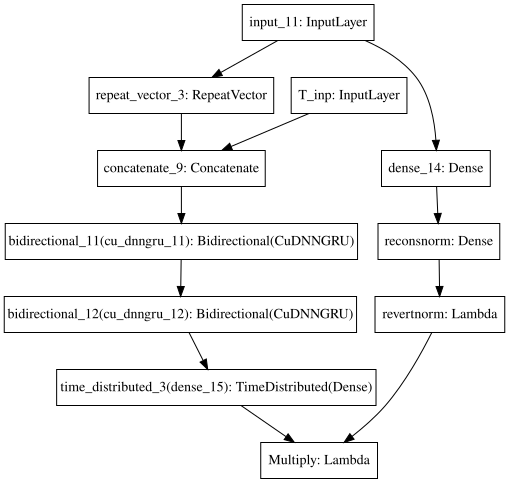

In [39]:
##### INPUTS ENCODER ######
x_lc = Input(shape = (T, channels) , name="LC_inp")
x_t = Input(shape = (T, 1) , name ="T_inp")
s_lc = Input(shape= (1,), name="scale_inp") #para pesar loss
x_lc_s = Lambda(Div_L, name="Divide")([x_lc, s_lc]) #NEW: quitar escala del dato (o escalar a una version normal)

##### CODIFY LIGHT CURVE ######
x = Concatenate(axis=-1)([x_t, x_lc_s]) 
f1 = Bidirectional(CuDNNGRU(64, return_sequences=True))(x)
f1 = Bidirectional(CuDNNGRU(64, return_sequences=False))(f1) 

##### CODIFY SCALE AND CONCATENATE ######
f1_s = Lambda(Norm_L, arguments={'mu':Slog_mu,'std':Slog_std}, name="norm")(s_lc) #mas capas?
f1_s = Dense(1, activation='tanh')(f1_s) #o tanh

f1 = Concatenate(axis=-1)([f1, f1_s]) #NEW: agregar escala a codificar

##### GET THE LATENT VARIABLE ######
z_mean = Dense(latent_dim,activation='linear')(f1)
z_log_var = Dense(latent_dim,activation='linear')(f1)
encoder = Model([x_t, x_lc, s_lc], [z_mean,z_log_var], name="encoder")
samp_model = define_samp_model(latent_dim) #model to sample


##### INPUTS DECODER ######
decoder_input = Input(shape=(latent_dim,))

##### RECONSTRCT SCALE ######
s_out = Dense(1, activation='tanh')(decoder_input)
s_out = Dense(1, activation='linear', name="reconsnorm")(s_out) #NEW: aprende s 
s_out = Lambda(RevertNorm_L, arguments={'mu':Slog_mu,'std':Slog_std},name="revertnorm")(s_out) #NEW: volver a escala normal 
s_hat = Model(decoder_input, s_out)(samp_model(encoder([x_t, x_lc, s_lc])))
S_model = Model([x_t, x_lc, s_lc], s_hat)

##### RECONSTRUCT LIGHT CURVE ######
decode = RepeatVector(T)(decoder_input)
decode = Concatenate(axis=-1)([x_t, decode]) #add time decode
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional

decode = TimeDistributed(Dense(1, activation='linear'))(decode)
decode = Lambda(Mul_L, name="Multiply")([decode, s_out]) #NEW: recuperar escala de dato (multiplicar por std)
generator = Model([x_t, decoder_input], decode, name="generator")


##### VAE MODEL ######
out = generator([x_t, samp_model(encoder([x_t, x_lc, s_lc])) ])
vae = Model([x_t, x_lc, s_lc], out)

#define loss functions over model components
smse_LC = SMSE_loss(s_lc)
mse_S = MSLE_scale_loss(s_lc, s_hat) 
kl_loss = KL_loss(z_mean, z_log_var)

def Wvae_loss(y_true, y_pred):    
    return smse_LC(y_true, y_pred) + l*kl_loss(y_true, y_pred) +0.1*mse_S(y_true, y_pred)

vae.compile(optimizer='adam', loss=Wvae_loss, metrics = [smse_LC,kl_loss, mse_S])
vae.summary()

vae.get_layer("encoder").load_weights("./models/VAEscaleLow_S_%dT_%dD_%de_E.h5"%(T,latent_dim,400))
vae.get_layer("generator").load_weights("./models/VAEscaleLow_S_%dT_%dD_%de_D.h5"%(T,latent_dim,400))

SVG(model_to_dot(generator).create(prog='dot', format='svg'))

In [16]:
hist = vae.fit([X_train_t, X_train, S_train], X_train, epochs=400, batch_size=batch_size)

Epoch 1/400
8634/8634 [==============================] - 33s 4ms/step - loss: 1.2376 - SMSE: 1.0981 - KL: 3.4807 - MSLE_scale: 1.3604
Epoch 2/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.1417 - SMSE: 1.0186 - KL: 1.3042 - MSLE_scale: 1.2171
Epoch 3/400
8634/8634 [==============================] - 27s 3ms/step - loss: 1.1182 - SMSE: 1.0177 - KL: 3.4440 - MSLE_scale: 0.9705
Epoch 4/400
8634/8634 [==============================] - 27s 3ms/step - loss: 1.0858 - SMSE: 1.0075 - KL: 4.9755 - MSLE_scale: 0.7328
Epoch 5/400
8634/8634 [==============================] - 27s 3ms/step - loss: 1.0722 - SMSE: 1.0037 - KL: 5.3199 - MSLE_scale: 0.6315
Epoch 6/400
8634/8634 [==============================] - 27s 3ms/step - loss: 1.0594 - SMSE: 1.0027 - KL: 6.4431 - MSLE_scale: 0.5031
Epoch 7/400
8634/8634 [==============================] - 28s 3ms/step - loss: 1.0539 - SMSE: 1.0028 - KL: 5.8793 - MSLE_scale: 0.4517
Epoch 8/400
8634/8634 [==============================] - 27s 3

8634/8634 [==============================] - 26s 3ms/step - loss: 0.7402 - SMSE: 0.7253 - KL: 11.9159 - MSLE_scale: 0.0299
Epoch 122/400
8634/8634 [==============================] - 28s 3ms/step - loss: 0.7433 - SMSE: 0.7283 - KL: 12.3526 - MSLE_scale: 0.0264
Epoch 123/400
8634/8634 [==============================] - 27s 3ms/step - loss: 0.7490 - SMSE: 0.7346 - KL: 12.0856 - MSLE_scale: 0.0225
Epoch 124/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7492 - SMSE: 0.7354 - KL: 11.7383 - MSLE_scale: 0.0202
Epoch 125/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7656 - SMSE: 0.7515 - KL: 11.5810 - MSLE_scale: 0.0255
Epoch 126/400
8634/8634 [==============================] - 27s 3ms/step - loss: 0.7411 - SMSE: 0.7271 - KL: 11.9521 - MSLE_scale: 0.0204
Epoch 127/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7313 - SMSE: 0.7174 - KL: 11.7455 - MSLE_scale: 0.0213
Epoch 128/400
8634/8634 [==============================

8634/8634 [==============================] - 26s 3ms/step - loss: 0.7898 - SMSE: 0.7730 - KL: 11.9947 - MSLE_scale: 0.0481
Epoch 240/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7503 - SMSE: 0.7356 - KL: 12.1328 - MSLE_scale: 0.0253
Epoch 241/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7296 - SMSE: 0.7149 - KL: 12.3424 - MSLE_scale: 0.0240
Epoch 242/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7433 - SMSE: 0.7285 - KL: 12.5677 - MSLE_scale: 0.0219
Epoch 243/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.6915 - SMSE: 0.6772 - KL: 12.2870 - MSLE_scale: 0.0199
Epoch 244/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7278 - SMSE: 0.7138 - KL: 11.9998 - MSLE_scale: 0.0203
Epoch 245/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7310 - SMSE: 0.7165 - KL: 12.1392 - MSLE_scale: 0.0231
Epoch 246/400
8634/8634 [==============================

8634/8634 [==============================] - 26s 3ms/step - loss: 0.7270 - SMSE: 0.7112 - KL: 12.9044 - MSLE_scale: 0.0283
Epoch 358/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7569 - SMSE: 0.7403 - KL: 13.6723 - MSLE_scale: 0.0298
Epoch 359/400
8634/8634 [==============================] - 27s 3ms/step - loss: 0.7293 - SMSE: 0.7130 - KL: 13.2727 - MSLE_scale: 0.0303
Epoch 360/400
8634/8634 [==============================] - 27s 3ms/step - loss: 0.7490 - SMSE: 0.7341 - KL: 12.9147 - MSLE_scale: 0.0200
Epoch 361/400
8634/8634 [==============================] - 27s 3ms/step - loss: 0.6751 - SMSE: 0.6601 - KL: 13.2348 - MSLE_scale: 0.0181
Epoch 362/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7194 - SMSE: 0.7045 - KL: 12.8845 - MSLE_scale: 0.0205
Epoch 363/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7325 - SMSE: 0.7175 - KL: 12.9935 - MSLE_scale: 0.0205
Epoch 364/400
8634/8634 [==============================

/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


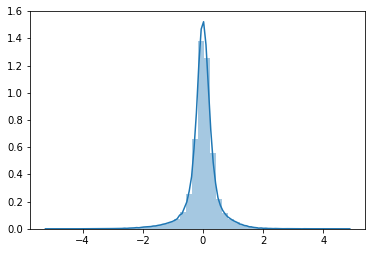

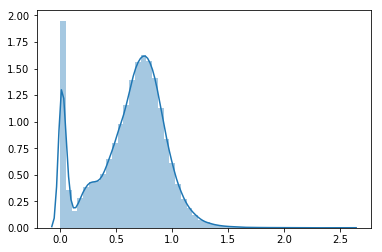

In [17]:
z_aux, z_var_aux = encoder.predict([X_train_t,X_train, S_train], batch_size=512)

sns.distplot(z_aux.flatten())
plt.show()
sns.distplot(np.exp(z_var_aux.flatten()))
plt.show()

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


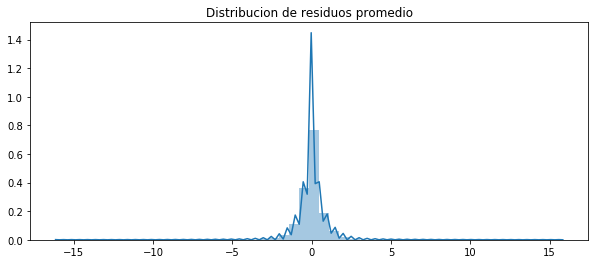

------------- Error -------------
RMSE (+-) =  0.6886044370602805
MAE  (+-) =  0.4821491070020168
------------- Smoothness -------------
AutoCorr lag-one =  0.6064027728923207
Diff MEAN =  0.07757293424452172
------------- Residual -------------
AutoCorr lag-one =  -0.04960860915201043
Permutation H =  0.9955791889633716
Spectral H =  0.8994862736520525
---------------------------------------
MSE de escala escalado=  0.2334101274849772


array([[1.0489828e-03],
       [4.7135352e-05],
       [1.3084722e-05],
       ...,
       [5.9733909e-05],
       [2.0036268e-05],
       [7.3932737e-05]], dtype=float32)

In [35]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], S_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]/S_train[:N,None,:], X_train_hat/S_train[:N,None,:])

S_train_hat = S_model.predict([X_train_t[:N],X_train[:N], S_train[:N]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error(S_train[:N], S_train_hat)*(1/S_std)**2)
S_train_hat ## no predice valores negativos

Real scale = 0.000036
Pred scale = 0.000038


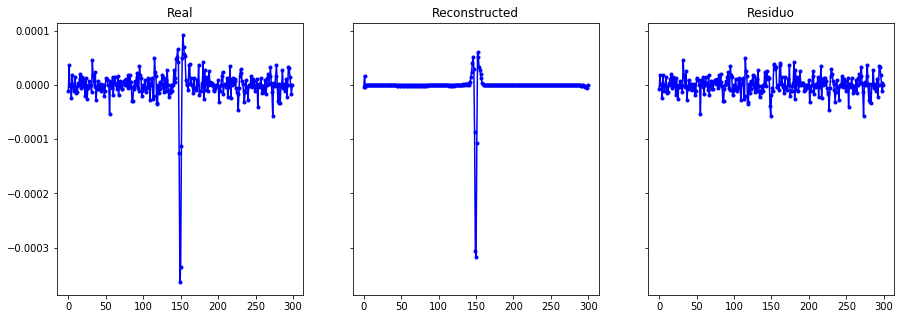

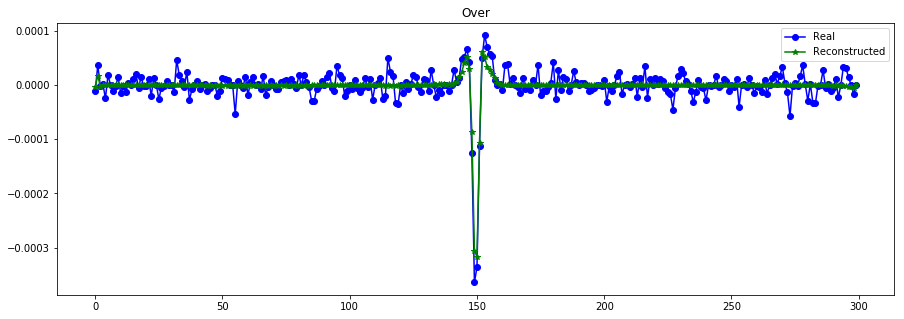

----------------------------------------------------------------
Real scale = 0.000015
Pred scale = 0.000015


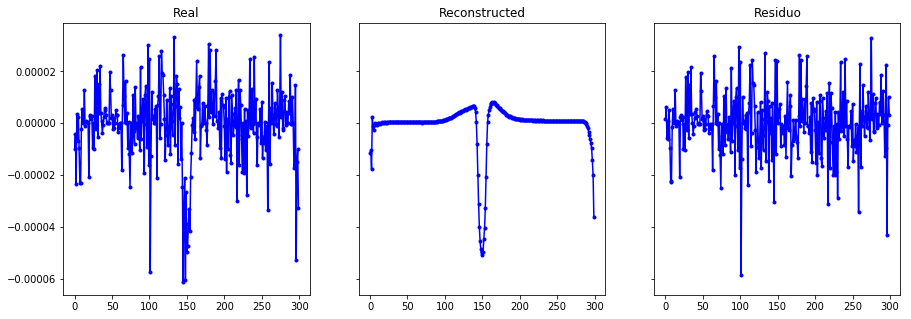

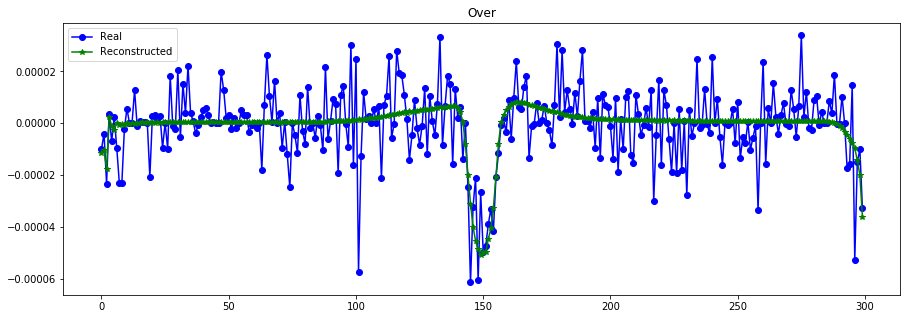

----------------------------------------------------------------
Real scale = 0.000111
Pred scale = 0.000134


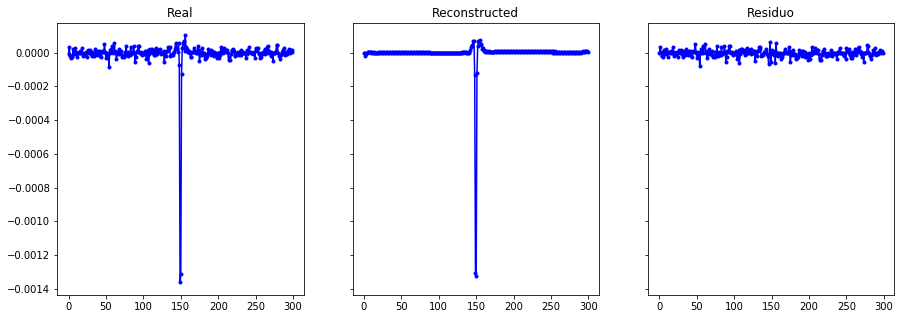

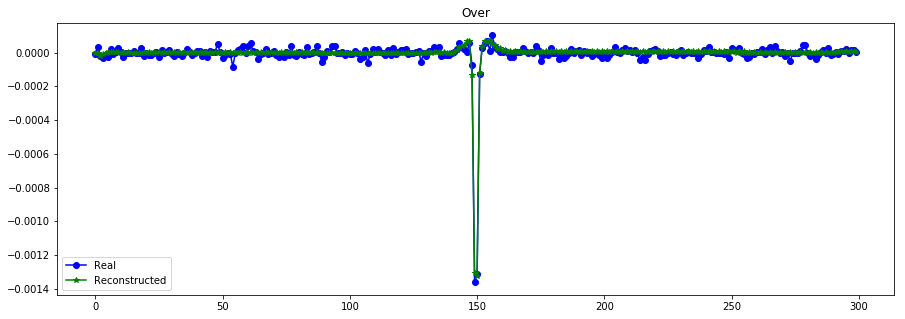

----------------------------------------------------------------
Real scale = 0.000016
Pred scale = 0.000016


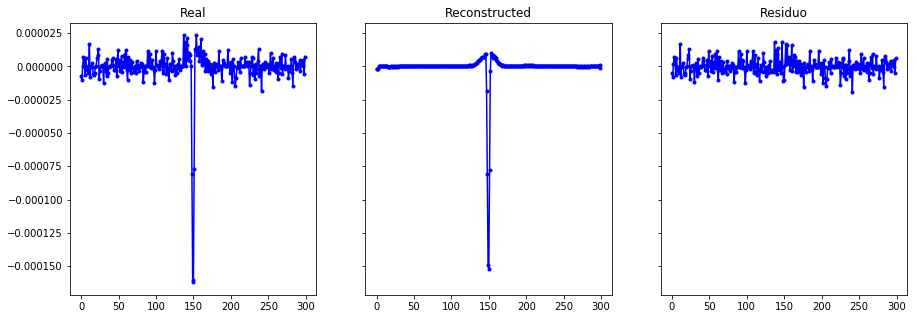

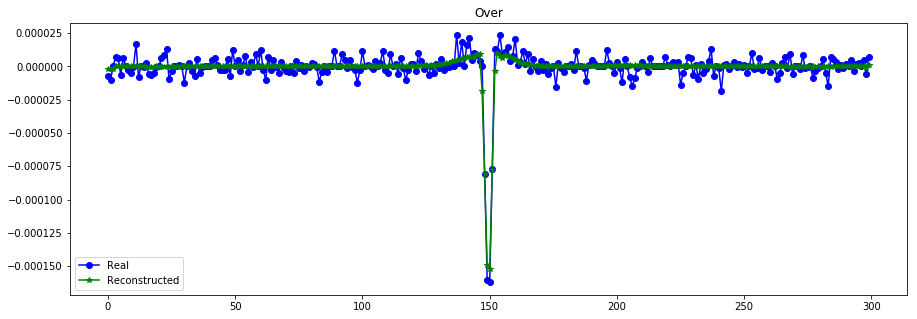

----------------------------------------------------------------
Real scale = 0.000009
Pred scale = 0.000009


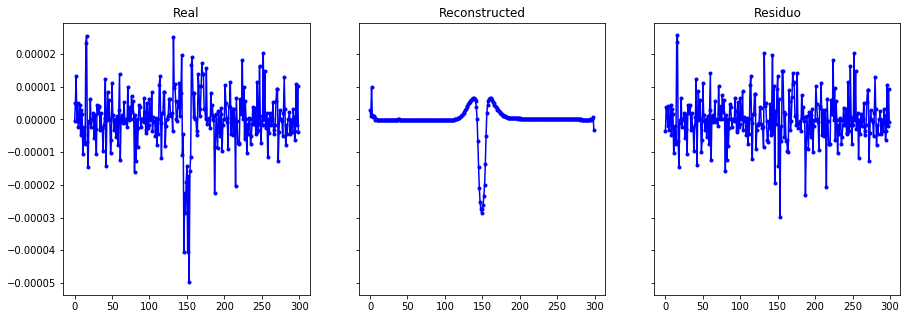

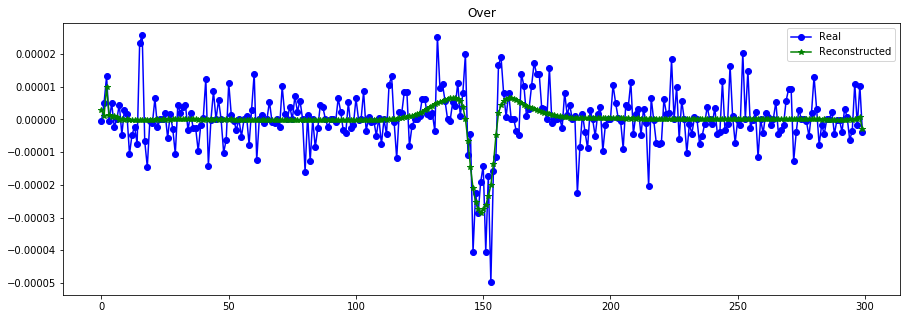

----------------------------------------------------------------
Real scale = 0.000040
Pred scale = 0.000040


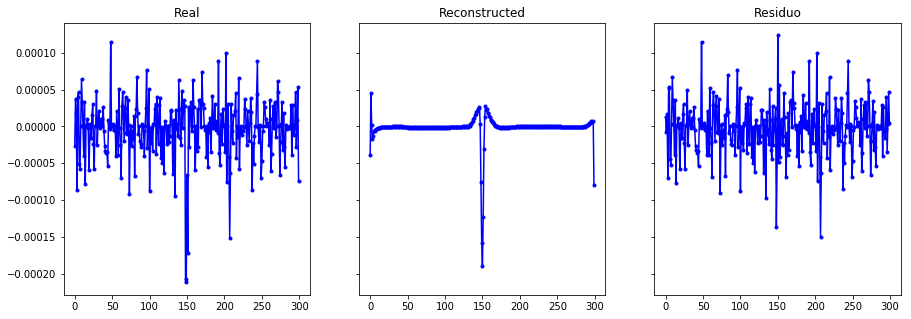

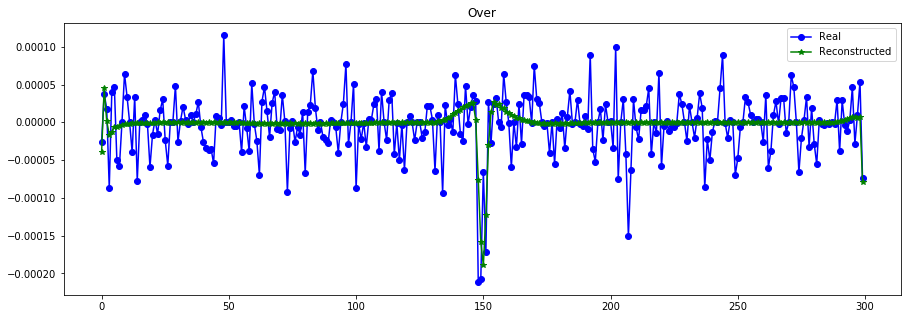

----------------------------------------------------------------
Real scale = 0.000127
Pred scale = 0.000156


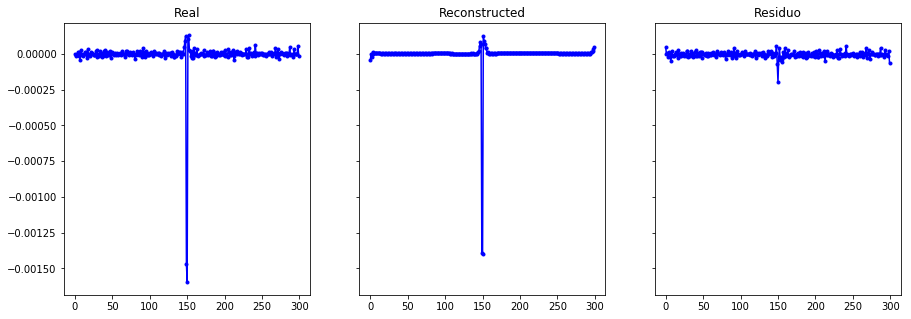

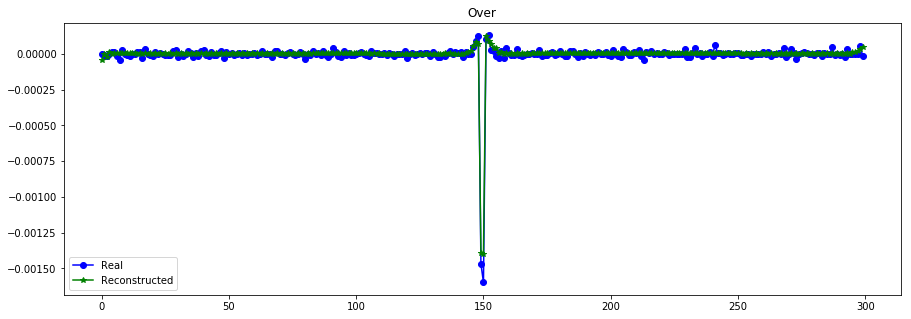

----------------------------------------------------------------
Real scale = 0.000012
Pred scale = 0.000013


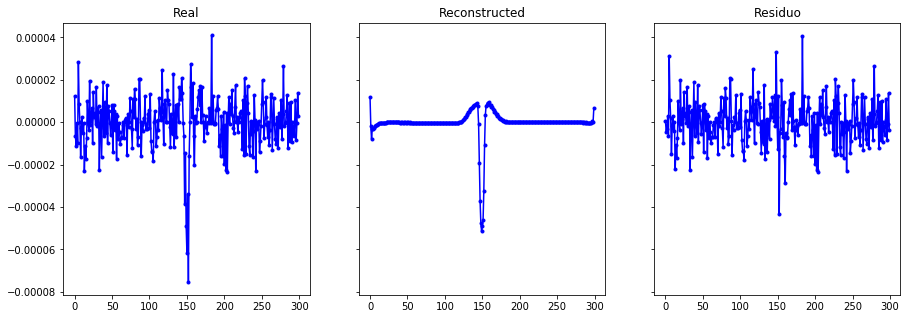

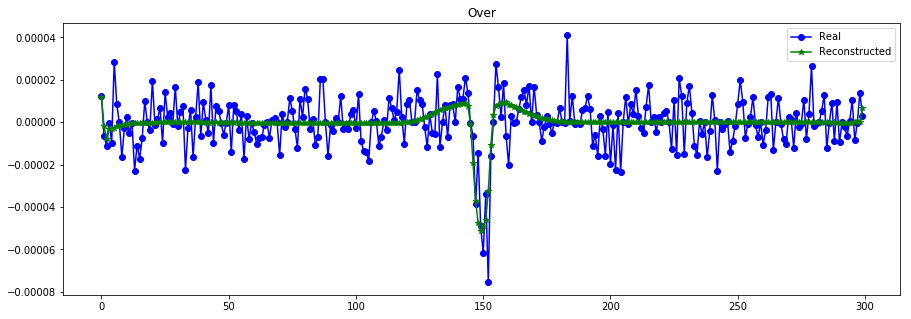

----------------------------------------------------------------
Real scale = 0.000421
Pred scale = 0.000393


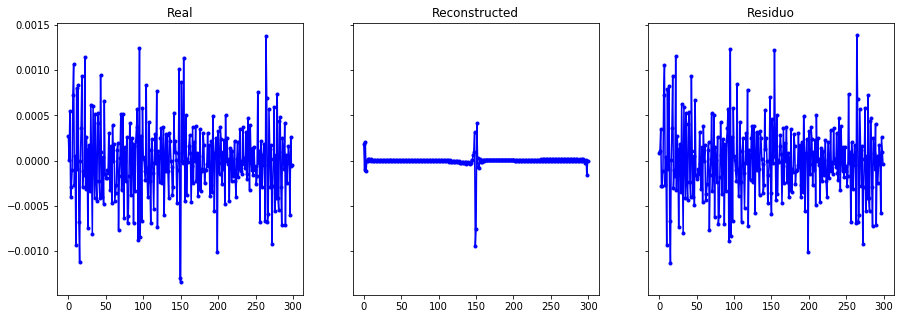

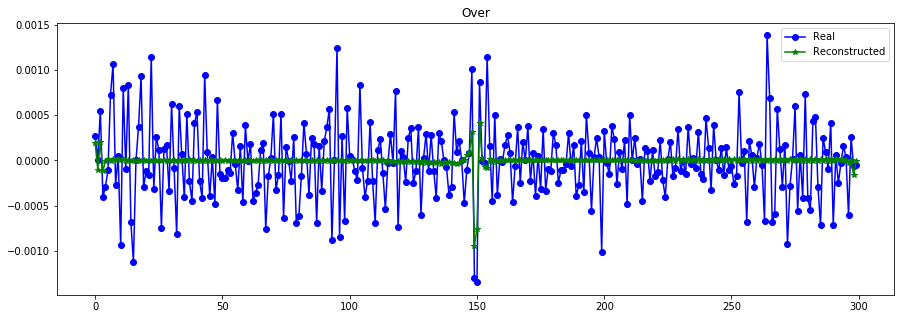

----------------------------------------------------------------
Real scale = 0.000039
Pred scale = 0.000036


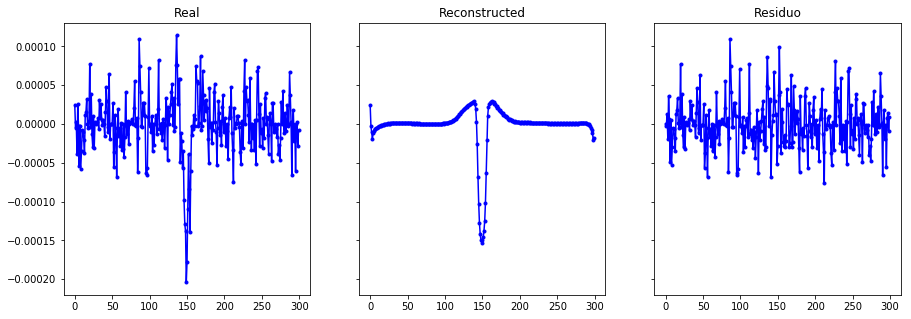

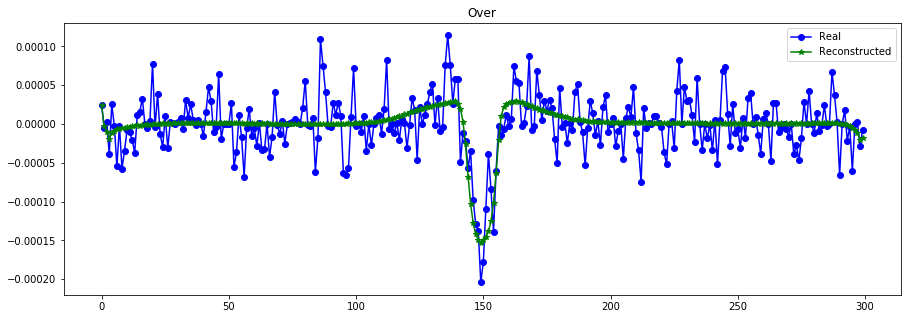

----------------------------------------------------------------
Real scale = 0.000035
Pred scale = 0.000032


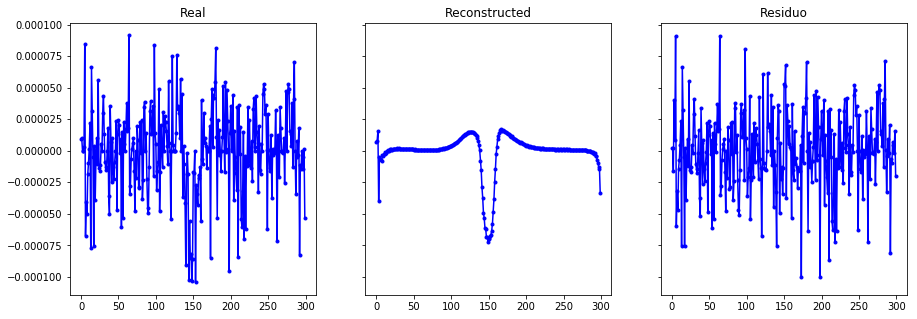

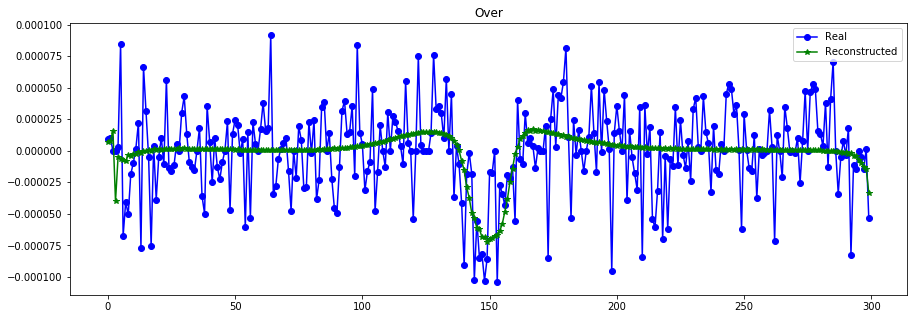

----------------------------------------------------------------
Real scale = 0.000004
Pred scale = 0.000005


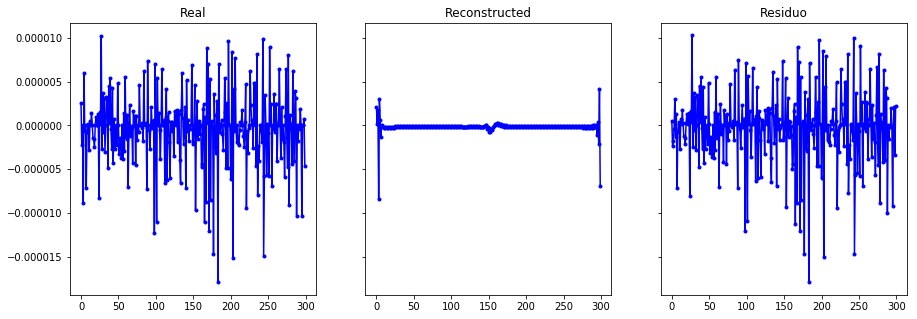

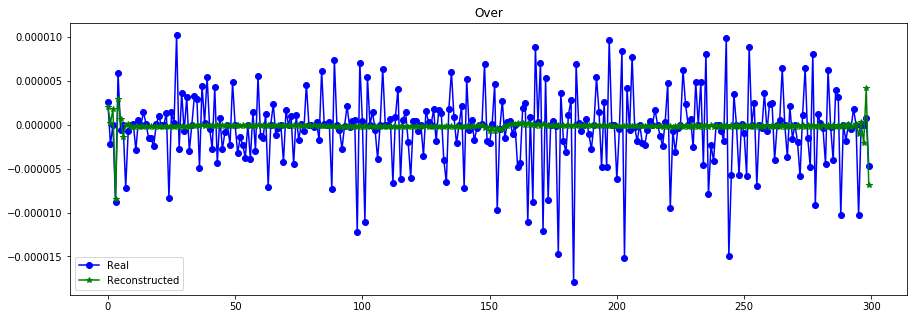

----------------------------------------------------------------
Real scale = 0.000049
Pred scale = 0.000057


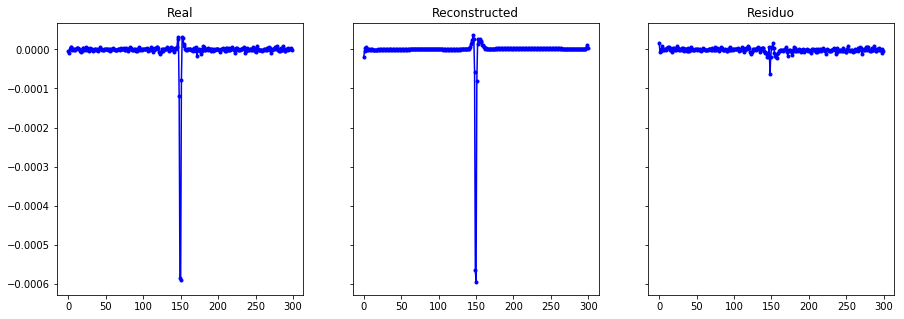

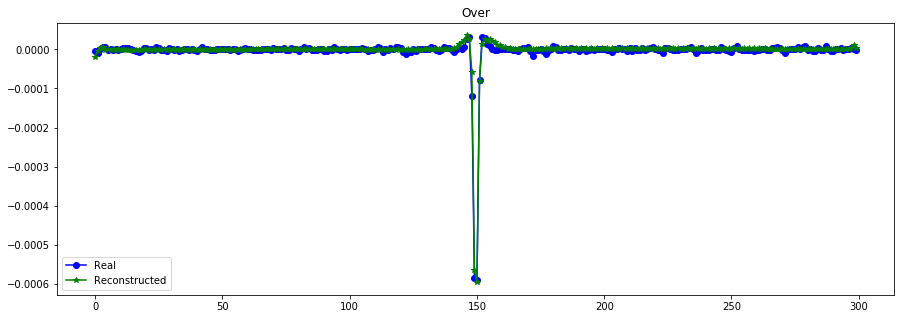

----------------------------------------------------------------
Real scale = 0.000037
Pred scale = 0.000043


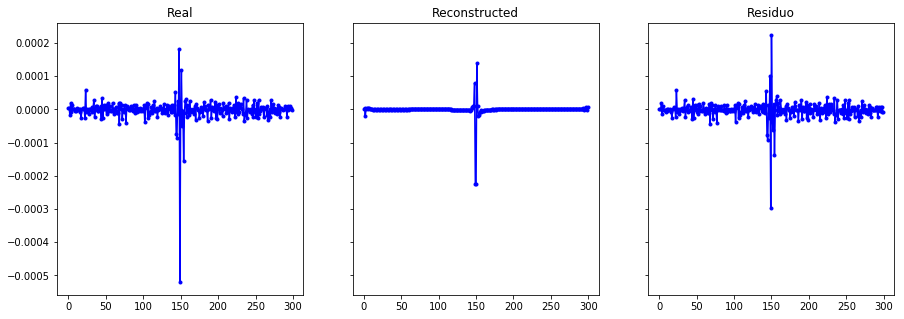

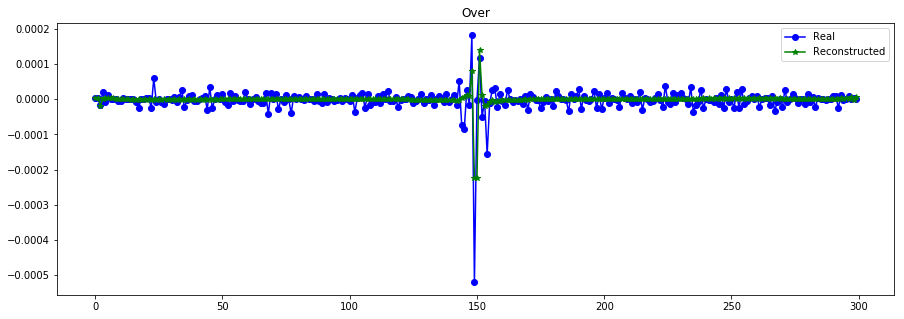

----------------------------------------------------------------
Real scale = 0.000045
Pred scale = 0.000046


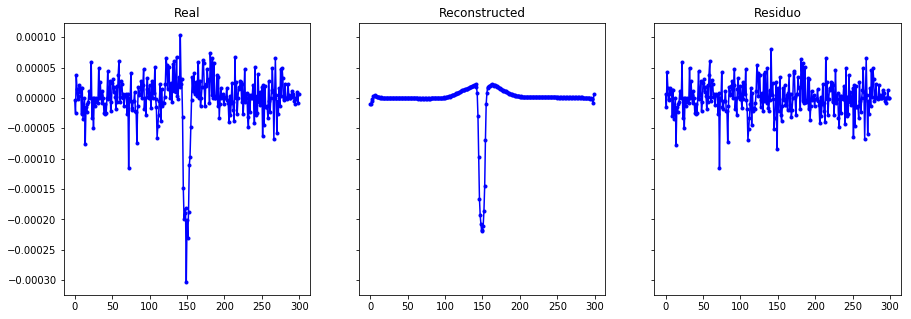

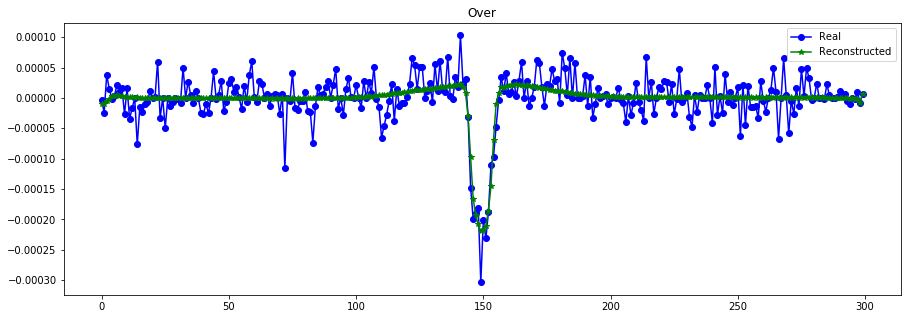

----------------------------------------------------------------


In [19]:
plot_n_lc(X_train[:N,:,0], X_train_hat, n= 15, s=[S_train[:N],S_train_hat]) #

In [20]:
vae.get_layer("encoder").save_weights("./models/VAEscaleLow_S_%dT_%dD_%de_E.h5"%(T,latent_dim,400))
vae.get_layer("generator").save_weights("./models/VAEscaleLow_S_%dT_%dD_%de_D.h5"%(T,latent_dim,400))

In [18]:
hist = vae.fit([X_train_t, X_train, S_train], X_train, epochs=400, batch_size=batch_size)

Epoch 1/400
8634/8634 [==============================] - 24s 3ms/step - loss: 1.2621 - SMSE: 1.1029 - KL: 1.6911 - MSLE_scale: 1.5753
Epoch 2/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.1481 - SMSE: 1.0146 - KL: 0.7714 - MSLE_scale: 1.3267
Epoch 3/400
8634/8634 [==============================] - 18s 2ms/step - loss: 1.1155 - SMSE: 1.0080 - KL: 5.0362 - MSLE_scale: 1.0253
Epoch 4/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.0898 - SMSE: 1.0027 - KL: 9.1982 - MSLE_scale: 0.7793
Epoch 5/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.0835 - SMSE: 1.0030 - KL: 8.4104 - MSLE_scale: 0.7205
Epoch 6/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.0786 - SMSE: 1.0025 - KL: 7.4973 - MSLE_scale: 0.6858
Epoch 7/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.0786 - SMSE: 1.0026 - KL: 7.6243 - MSLE_scale: 0.6836
Epoch 8/400
8634/8634 [==============================] - 17s 2

8634/8634 [==============================] - 18s 2ms/step - loss: 0.7606 - SMSE: 0.7431 - KL: 15.3174 - MSLE_scale: 0.0218
Epoch 122/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7527 - SMSE: 0.7349 - KL: 15.4334 - MSLE_scale: 0.0240
Epoch 123/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7613 - SMSE: 0.7438 - KL: 15.3048 - MSLE_scale: 0.0221
Epoch 124/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7621 - SMSE: 0.7445 - KL: 15.3348 - MSLE_scale: 0.0226
Epoch 125/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7481 - SMSE: 0.7305 - KL: 15.2612 - MSLE_scale: 0.0228
Epoch 126/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7611 - SMSE: 0.7439 - KL: 15.2339 - MSLE_scale: 0.0194
Epoch 127/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7768 - SMSE: 0.7594 - KL: 14.6025 - MSLE_scale: 0.0270
Epoch 128/400
8634/8634 [==============================

8634/8634 [==============================] - 18s 2ms/step - loss: 0.7119 - SMSE: 0.6963 - KL: 14.0462 - MSLE_scale: 0.0156
Epoch 240/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7194 - SMSE: 0.7037 - KL: 14.0823 - MSLE_scale: 0.0163
Epoch 241/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7243 - SMSE: 0.7088 - KL: 14.0777 - MSLE_scale: 0.0141
Epoch 242/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7121 - SMSE: 0.6963 - KL: 14.2370 - MSLE_scale: 0.0153
Epoch 243/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7101 - SMSE: 0.6947 - KL: 13.8168 - MSLE_scale: 0.0161
Epoch 244/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7204 - SMSE: 0.7050 - KL: 14.0515 - MSLE_scale: 0.0138
Epoch 245/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7235 - SMSE: 0.7080 - KL: 13.9770 - MSLE_scale: 0.0154
Epoch 246/400
8634/8634 [==============================

8634/8634 [==============================] - 17s 2ms/step - loss: 0.6921 - SMSE: 0.6761 - KL: 14.4836 - MSLE_scale: 0.0151
Epoch 358/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7566 - SMSE: 0.7394 - KL: 13.8894 - MSLE_scale: 0.0330
Epoch 359/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7182 - SMSE: 0.7022 - KL: 14.4204 - MSLE_scale: 0.0156
Epoch 360/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7319 - SMSE: 0.7165 - KL: 13.7935 - MSLE_scale: 0.0167
Epoch 361/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7157 - SMSE: 0.7002 - KL: 13.9684 - MSLE_scale: 0.0151
Epoch 362/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.6847 - SMSE: 0.6686 - KL: 14.6323 - MSLE_scale: 0.0144
Epoch 363/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7173 - SMSE: 0.7010 - KL: 14.1983 - MSLE_scale: 0.0213
Epoch 364/400
8634/8634 [==============================

/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


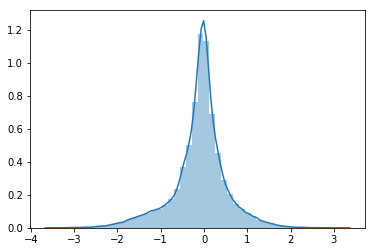

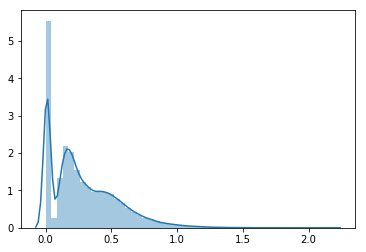

In [19]:
z_aux, z_var_aux = encoder.predict([X_train_t,X_train, S_train], batch_size=512)

sns.distplot(z_aux.flatten())
plt.show()
sns.distplot(np.exp(z_var_aux.flatten()))
plt.show()

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


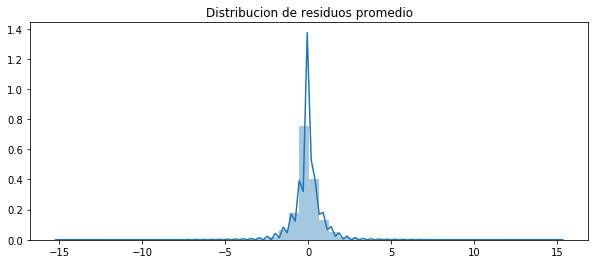

------------- Error -------------
RMSE (+-) =  0.7571971796138021
MAE  (+-) =  0.49717420541098567
------------- Smoothness -------------
AutoCorr lag-one =  0.6930625008227665
Diff MEAN =  0.05220103074831906
------------- Residual -------------
AutoCorr lag-one =  -0.007083657006924288
Permutation H =  0.9957190518957035
Spectral H =  0.8980032201488253
---------------------------------------
MSE de escala escalado=  0.31851598151016314


array([[1.0648126e-03],
       [3.9718452e-05],
       [1.1840975e-05],
       ...,
       [6.7898800e-05],
       [2.0197343e-05],
       [6.9587237e-05]], dtype=float32)

In [20]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], S_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]/S_train[:N,None,:], X_train_hat/S_train[:N,None,:])

S_train_hat = S_model.predict([X_train_t[:N],X_train[:N], S_train[:N]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error(S_train[:N], S_train_hat)*(1/S_std)**2)
S_train_hat ## no predice valores negativos

Real scale = 0.000016
Pred scale = 0.000015


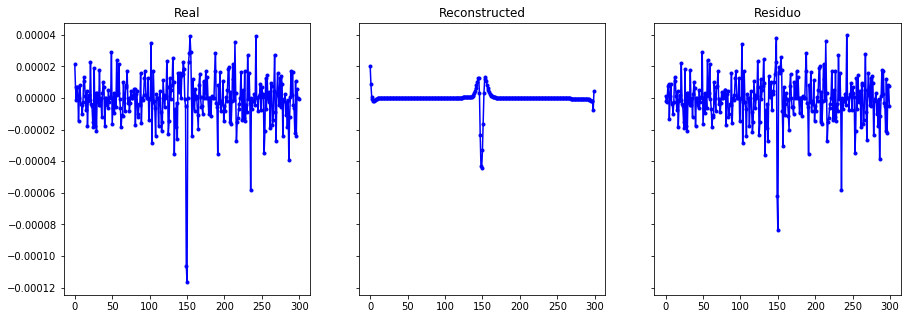

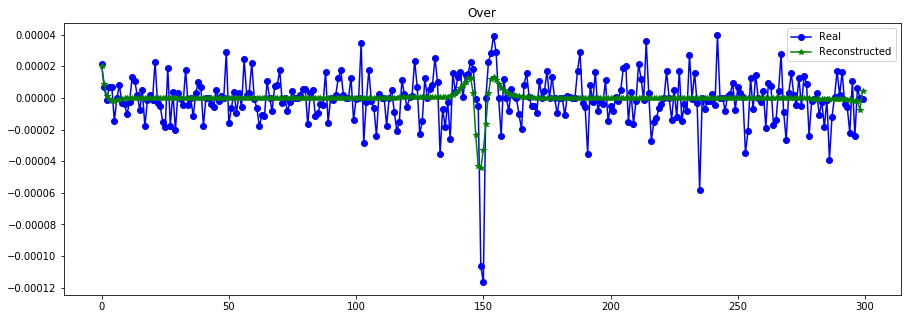

----------------------------------------------------------------
Real scale = 0.000083
Pred scale = 0.000091


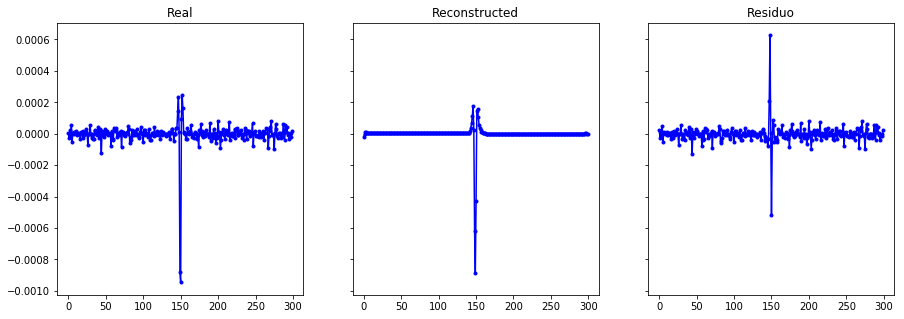

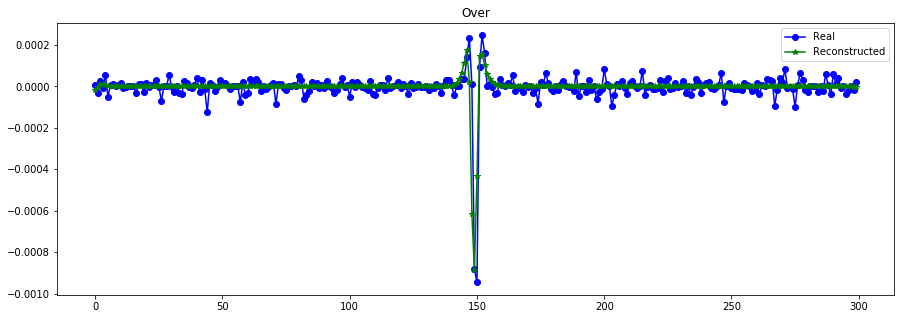

----------------------------------------------------------------
Real scale = 0.000091
Pred scale = 0.000091


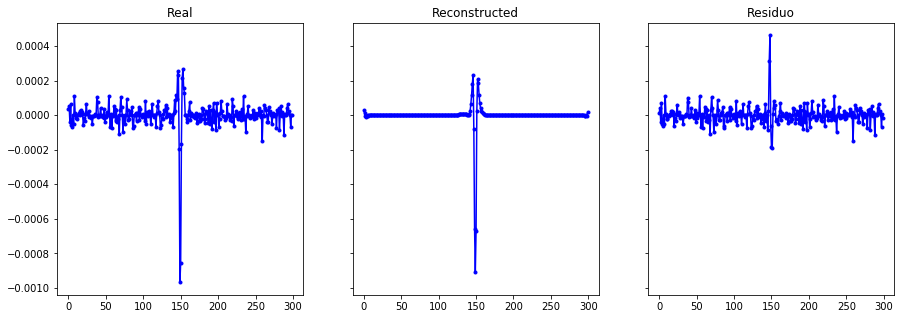

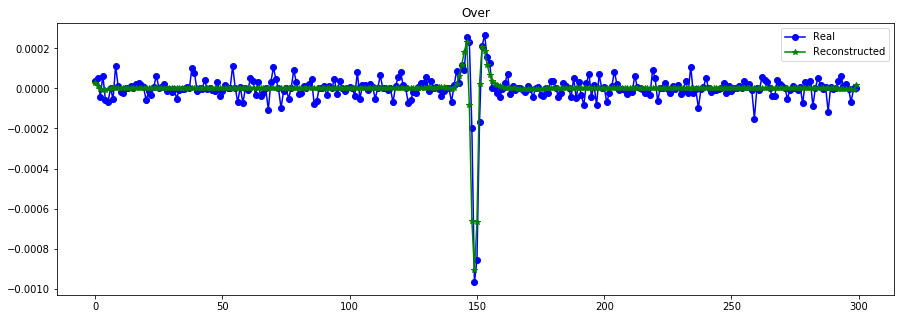

----------------------------------------------------------------
Real scale = 0.000084
Pred scale = 0.000094


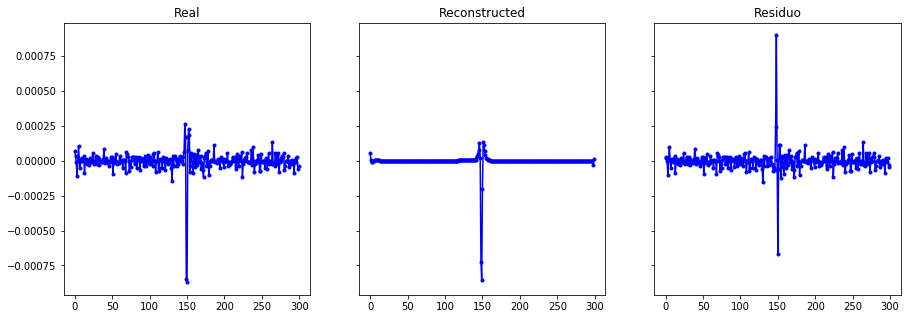

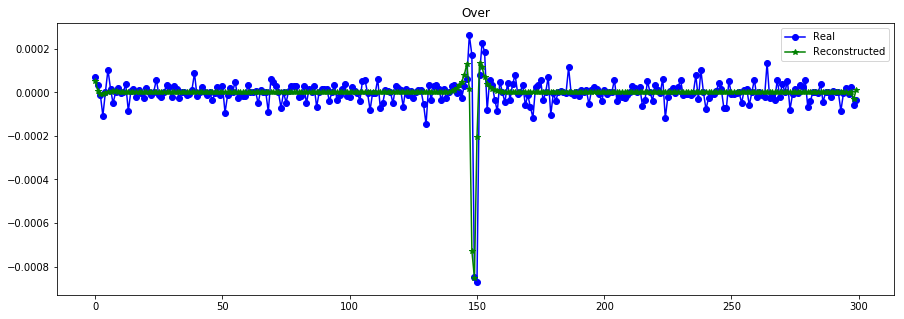

----------------------------------------------------------------
Real scale = 0.000036
Pred scale = 0.000032


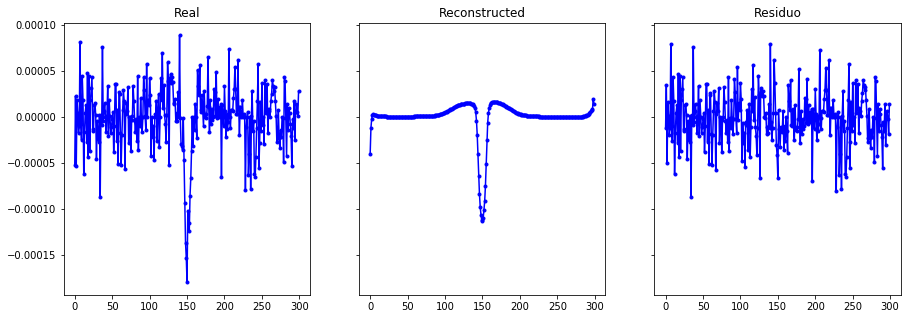

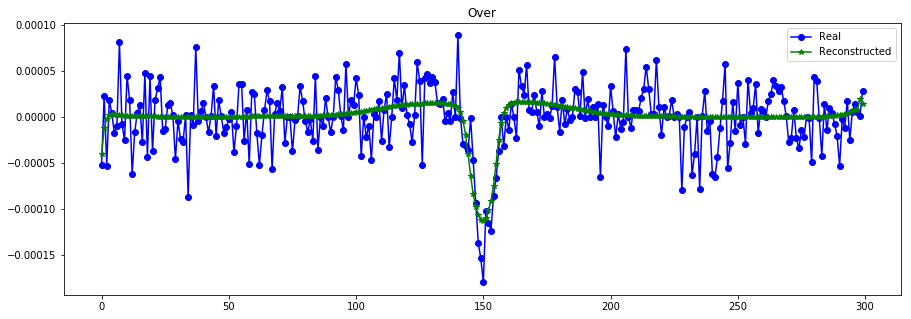

----------------------------------------------------------------
Real scale = 0.000027
Pred scale = 0.000024


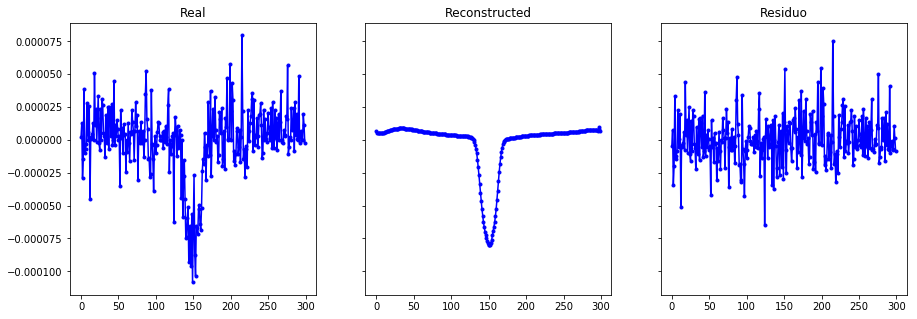

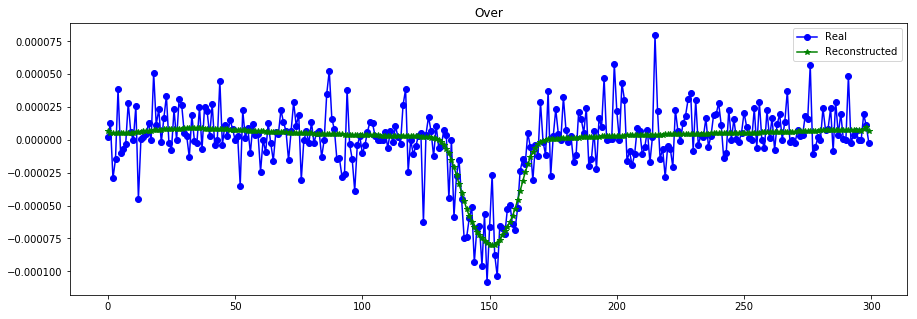

----------------------------------------------------------------
Real scale = 0.000067
Pred scale = 0.000066


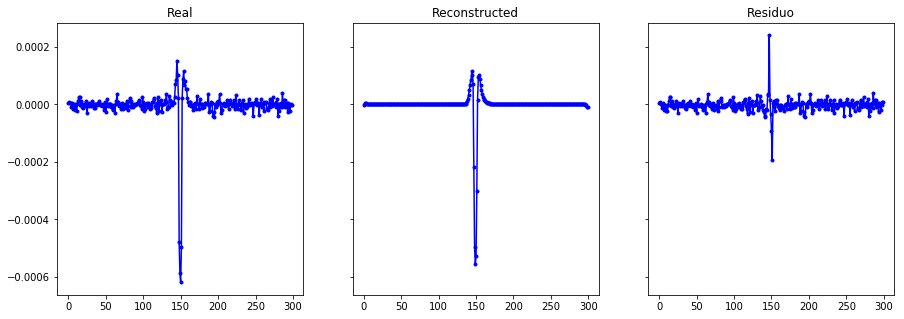

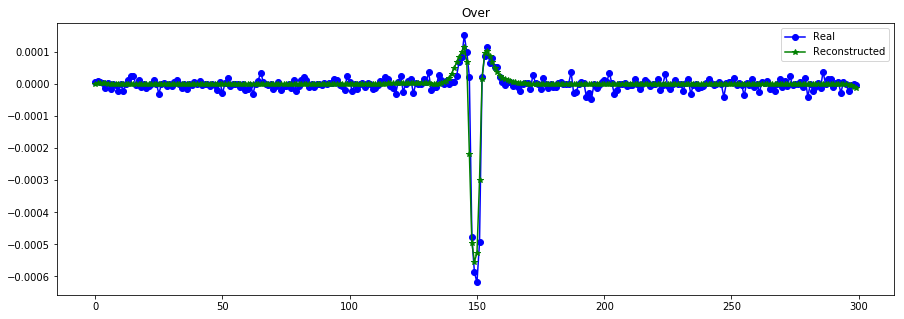

----------------------------------------------------------------
Real scale = 0.000054
Pred scale = 0.000050


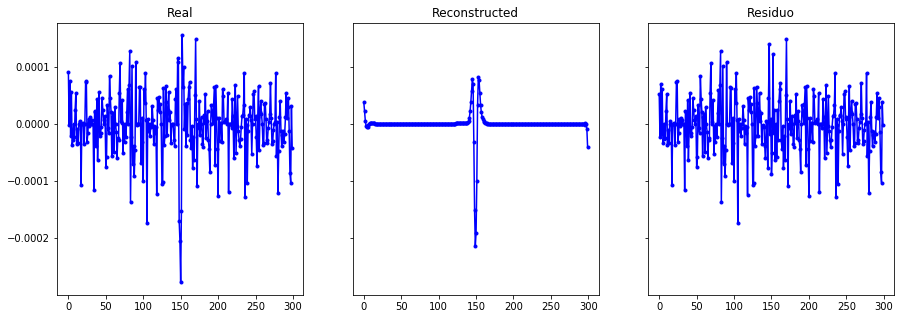

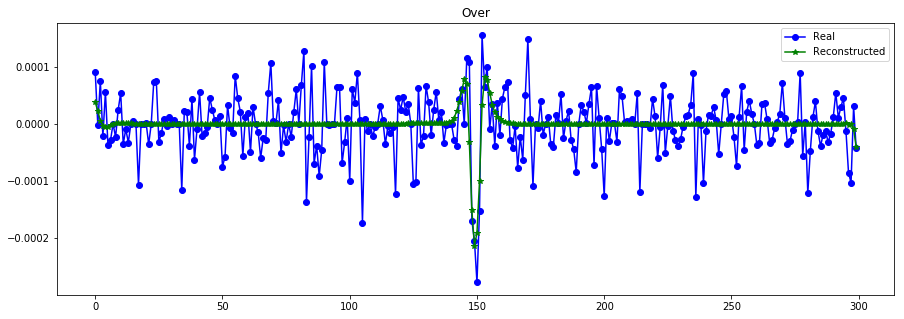

----------------------------------------------------------------
Real scale = 0.000102
Pred scale = 0.000115


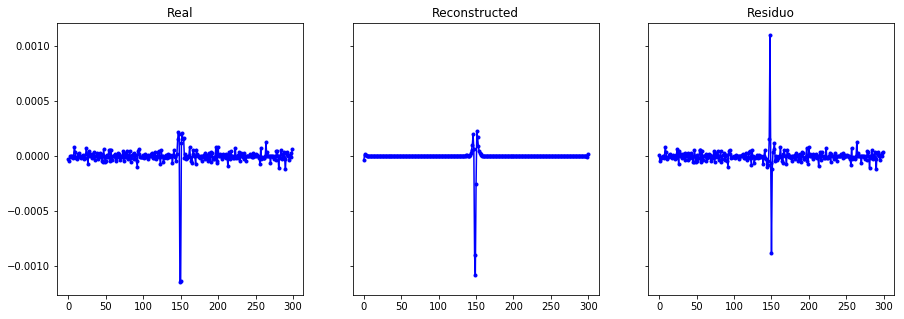

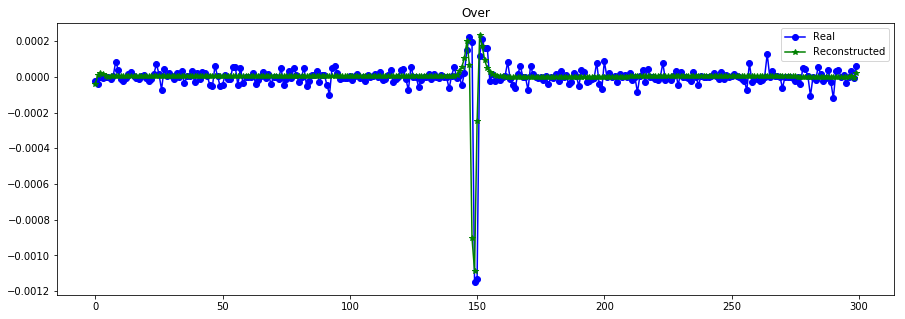

----------------------------------------------------------------
Real scale = 0.000069
Pred scale = 0.000072


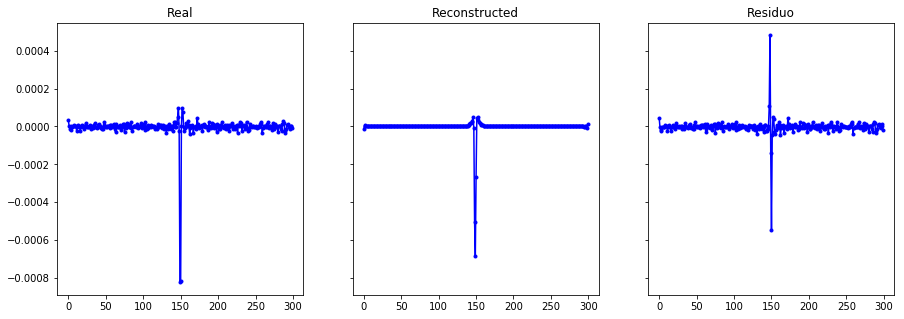

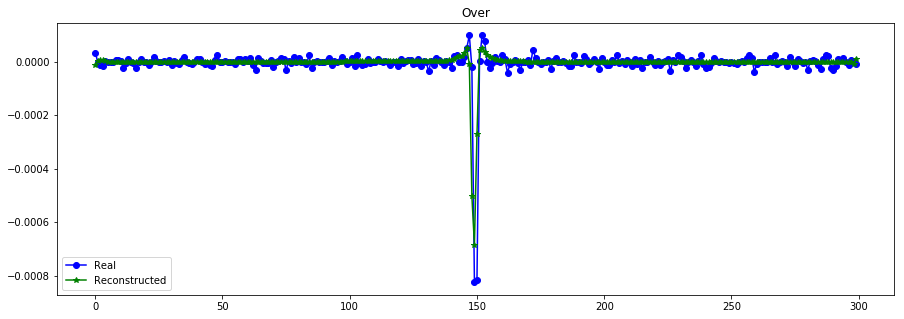

----------------------------------------------------------------
Real scale = 0.000125
Pred scale = 0.000125


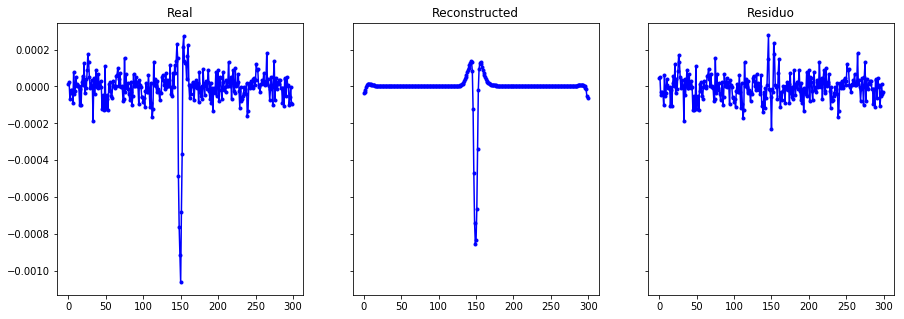

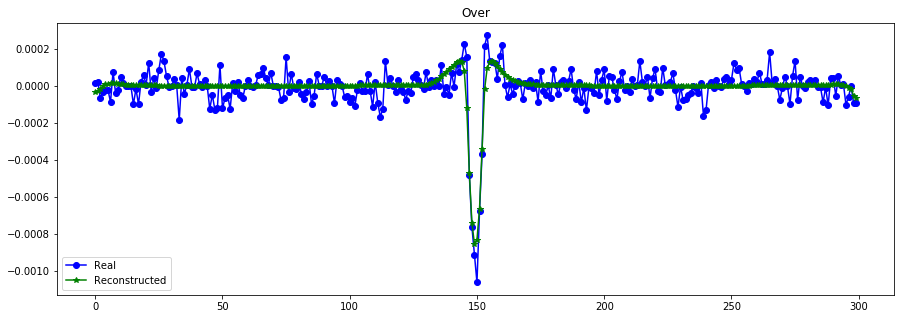

----------------------------------------------------------------
Real scale = 0.000034
Pred scale = 0.000033


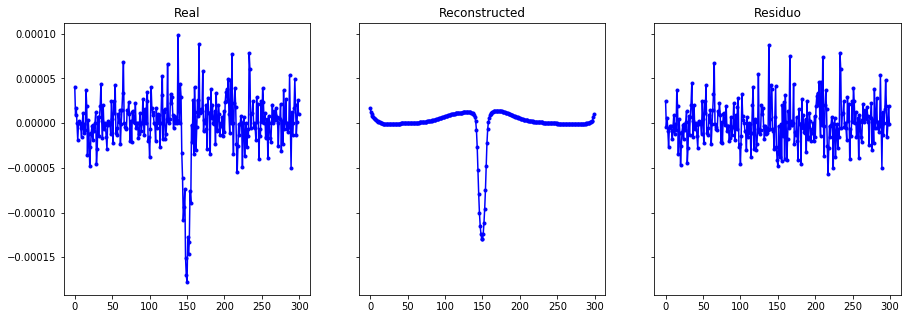

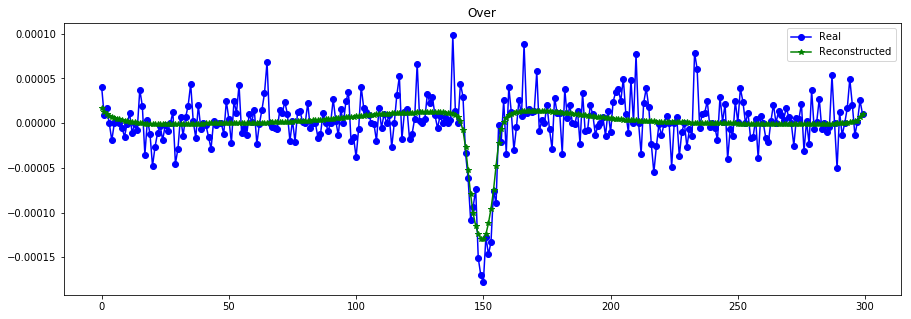

----------------------------------------------------------------
Real scale = 0.000012
Pred scale = 0.000012


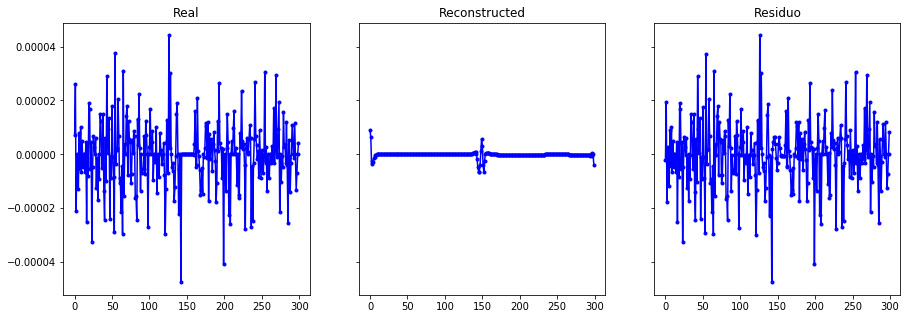

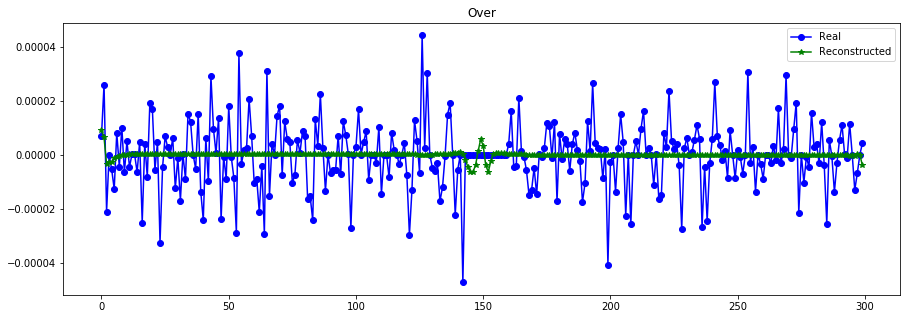

----------------------------------------------------------------
Real scale = 0.000011
Pred scale = 0.000010


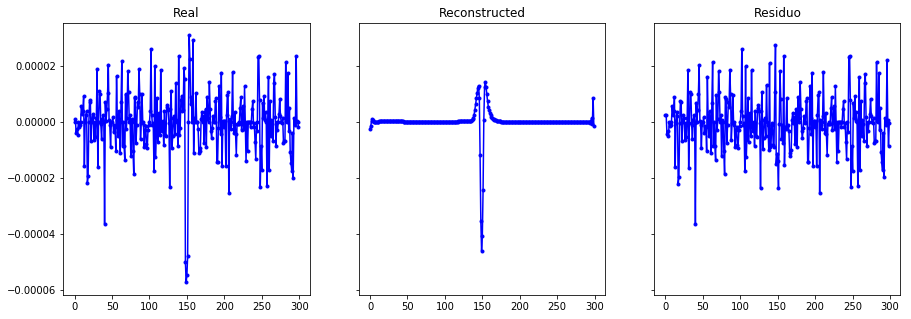

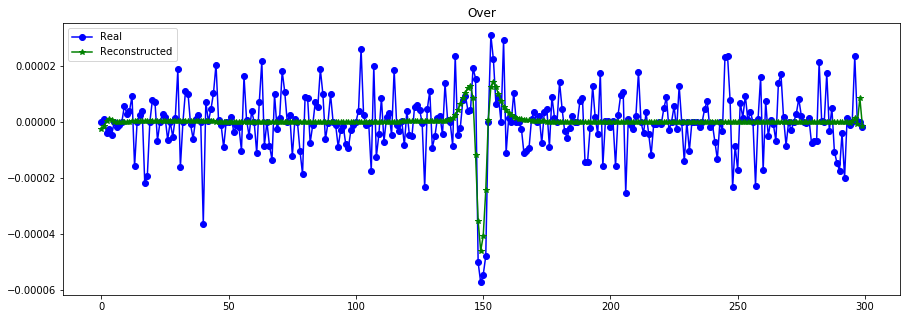

----------------------------------------------------------------
Real scale = 0.000009
Pred scale = 0.000008


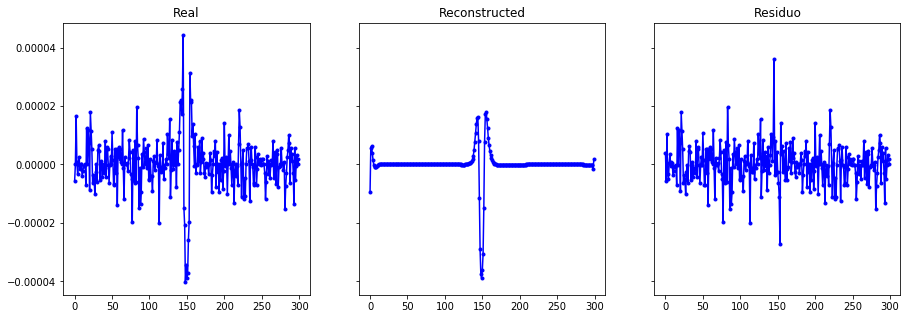

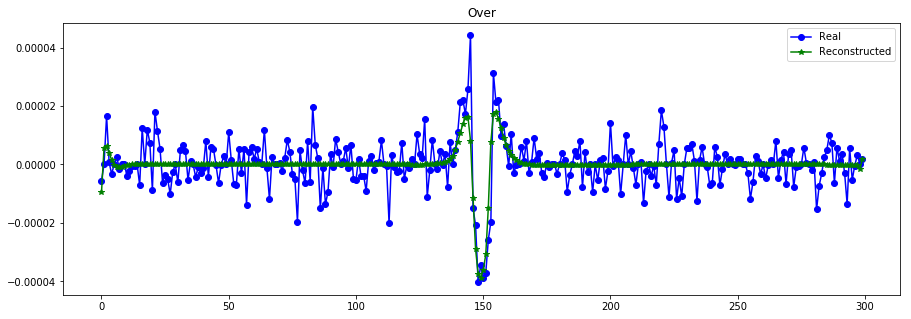

----------------------------------------------------------------


In [21]:
plot_n_lc(X_train[:N,:,0], X_train_hat, n= 15, s=[S_train[:N],S_train_hat]) #

In [22]:
vae.get_layer("encoder").save_weights("./models/VAEscaleLow_S_%dT_%dD_%de_E.h5"%(T,latent_dim,400))
vae.get_layer("generator").save_weights("./models/VAEscaleLow_S_%dT_%dD_%de_D.h5"%(T,latent_dim,400))

#### KL mas alta

In [26]:
hist = vae.fit([X_train_t, X_train, S_train], X_train, epochs=400, batch_size=batch_size)

Epoch 1/400
8634/8634 [==============================] - 21s 2ms/step - loss: 1.6778 - SMSE: 1.5358 - KL: 2.4151 - MSLE_scale: 1.1780
Epoch 2/400
8634/8634 [==============================] - 18s 2ms/step - loss: 1.1679 - SMSE: 1.0394 - KL: 1.5957 - MSLE_scale: 1.1254
Epoch 3/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.1372 - SMSE: 1.0248 - KL: 0.7443 - MSLE_scale: 1.0486
Epoch 4/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.1307 - SMSE: 1.0245 - KL: 0.5849 - MSLE_scale: 1.0033
Epoch 5/400
8634/8634 [==============================] - 18s 2ms/step - loss: 1.1369 - SMSE: 1.0331 - KL: 0.5783 - MSLE_scale: 0.9802
Epoch 6/400
8634/8634 [==============================] - 18s 2ms/step - loss: 1.1161 - SMSE: 1.0138 - KL: 0.6320 - MSLE_scale: 0.9591
Epoch 7/400
8634/8634 [==============================] - 18s 2ms/step - loss: 1.1160 - SMSE: 1.0187 - KL: 0.5351 - MSLE_scale: 0.9194
Epoch 8/400
8634/8634 [==============================] - 18s 2

8634/8634 [==============================] - 17s 2ms/step - loss: 0.8532 - SMSE: 0.8111 - KL: 3.2720 - MSLE_scale: 0.0933
Epoch 122/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.8441 - SMSE: 0.8013 - KL: 3.3294 - MSLE_scale: 0.0950
Epoch 123/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.8354 - SMSE: 0.7931 - KL: 3.3837 - MSLE_scale: 0.0852
Epoch 124/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.8409 - SMSE: 0.7987 - KL: 3.3775 - MSLE_scale: 0.0845
Epoch 125/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.8216 - SMSE: 0.7787 - KL: 3.4529 - MSLE_scale: 0.0842
Epoch 126/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.8260 - SMSE: 0.7838 - KL: 3.4079 - MSLE_scale: 0.0821
Epoch 127/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.8273 - SMSE: 0.7851 - KL: 3.4289 - MSLE_scale: 0.0784
Epoch 128/400
8634/8634 [==============================] - 17s

8634/8634 [==============================] - 17s 2ms/step - loss: 0.7642 - SMSE: 0.7216 - KL: 3.5431 - MSLE_scale: 0.0712
Epoch 242/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7545 - SMSE: 0.7118 - KL: 3.6040 - MSLE_scale: 0.0670
Epoch 243/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7791 - SMSE: 0.7377 - KL: 3.4803 - MSLE_scale: 0.0656
Epoch 244/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7600 - SMSE: 0.7180 - KL: 3.5268 - MSLE_scale: 0.0677
Epoch 245/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7680 - SMSE: 0.7251 - KL: 3.5654 - MSLE_scale: 0.0728
Epoch 246/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7618 - SMSE: 0.7198 - KL: 3.5073 - MSLE_scale: 0.0687
Epoch 247/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7450 - SMSE: 0.7019 - KL: 3.6225 - MSLE_scale: 0.0684
Epoch 248/400
8634/8634 [==============================] - 18s

8634/8634 [==============================] - 17s 2ms/step - loss: 0.7771 - SMSE: 0.7345 - KL: 3.4943 - MSLE_scale: 0.0761
Epoch 362/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7810 - SMSE: 0.7389 - KL: 3.5204 - MSLE_scale: 0.0690
Epoch 363/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7420 - SMSE: 0.6996 - KL: 3.5437 - MSLE_scale: 0.0696
Epoch 364/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7337 - SMSE: 0.6902 - KL: 3.6437 - MSLE_scale: 0.0703
Epoch 365/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7306 - SMSE: 0.6873 - KL: 3.6372 - MSLE_scale: 0.0694
Epoch 366/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7303 - SMSE: 0.6871 - KL: 3.6495 - MSLE_scale: 0.0680
Epoch 367/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7301 - SMSE: 0.6864 - KL: 3.6987 - MSLE_scale: 0.0662
Epoch 368/400
8634/8634 [==============================] - 17s

/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


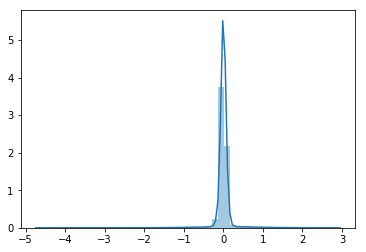

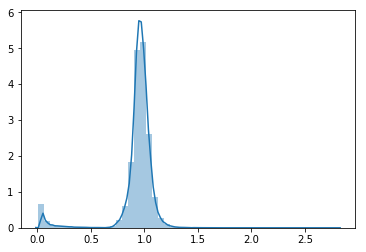

In [27]:
z_aux, z_var_aux = encoder.predict([X_train_t,X_train, S_train], batch_size=512)

sns.distplot(z_aux.flatten())
plt.show()
sns.distplot(np.exp(z_var_aux.flatten()))
plt.show()

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


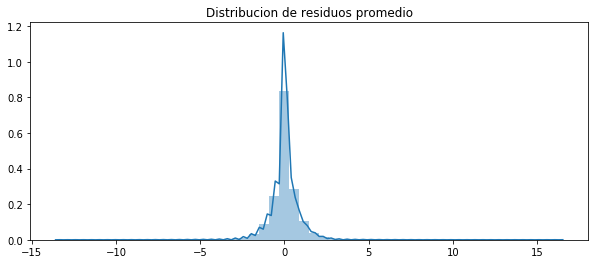

------------- Error -------------
RMSE (+-) =  0.7700443834000463
MAE  (+-) =  0.5077770062780069
------------- Smoothness -------------
AutoCorr lag-one =  0.816761350555478
Diff MEAN =  0.047691336840032725
------------- Residual -------------
AutoCorr lag-one =  0.03536787444311509
Permutation H =  0.9958466379709912
Spectral H =  0.8937505648606666
---------------------------------------
MSE de escala escalado=  0.3162767333809346


array([[9.2020526e-04],
       [5.6903118e-05],
       [1.4995156e-05],
       ...,
       [6.2446939e-05],
       [2.2961816e-05],
       [6.9666916e-05]], dtype=float32)

In [28]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], S_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]/S_train[:N,None,:], X_train_hat/S_train[:N,None,:])

S_train_hat = S_model.predict([X_train_t[:N],X_train[:N], S_train[:N]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error(S_train[:N], S_train_hat)*(1/S_std)**2)
S_train_hat ## no predice valores negativos

Real scale = 0.000051
Pred scale = 0.000073


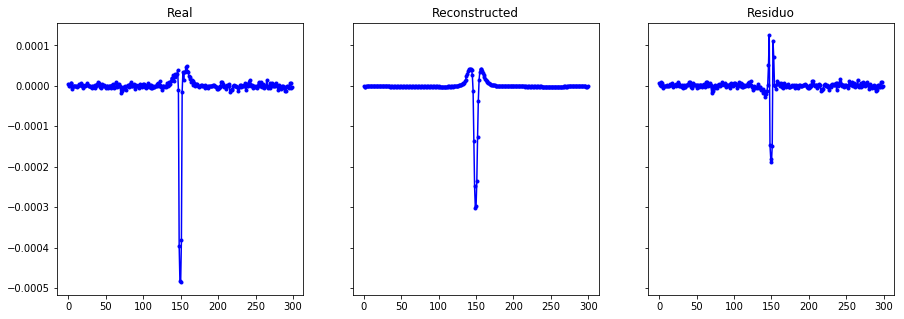

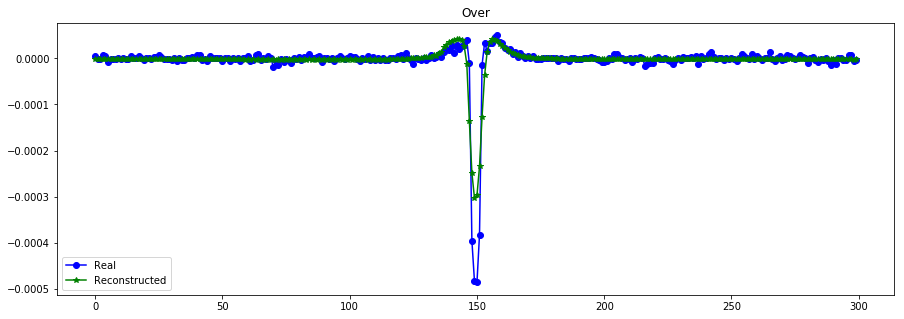

----------------------------------------------------------------
Real scale = 0.000039
Pred scale = 0.000059


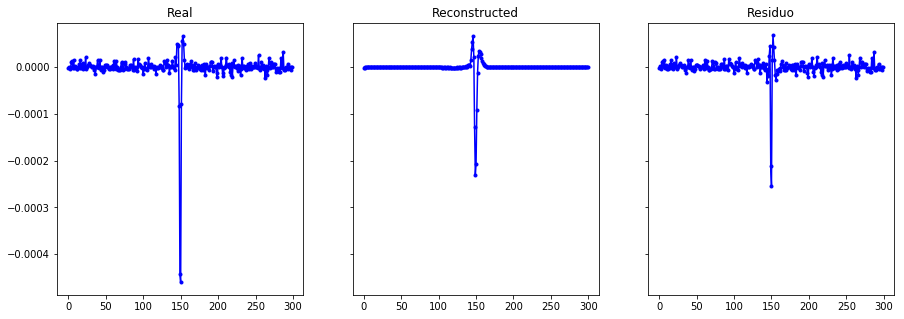

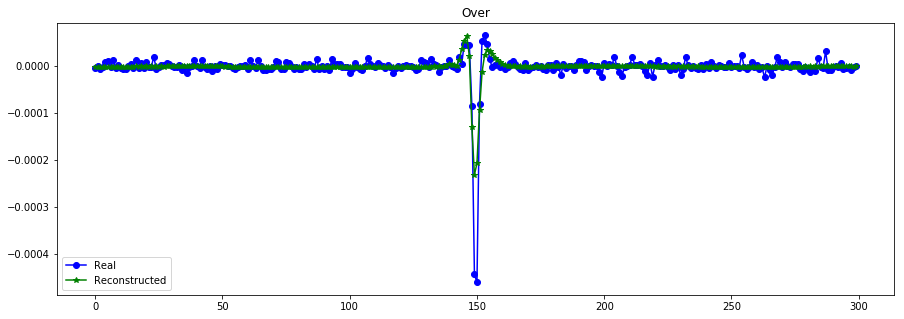

----------------------------------------------------------------
Real scale = 0.000077
Pred scale = 0.000083


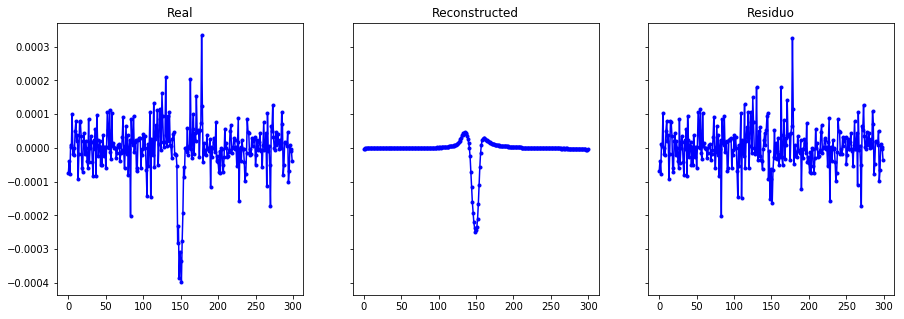

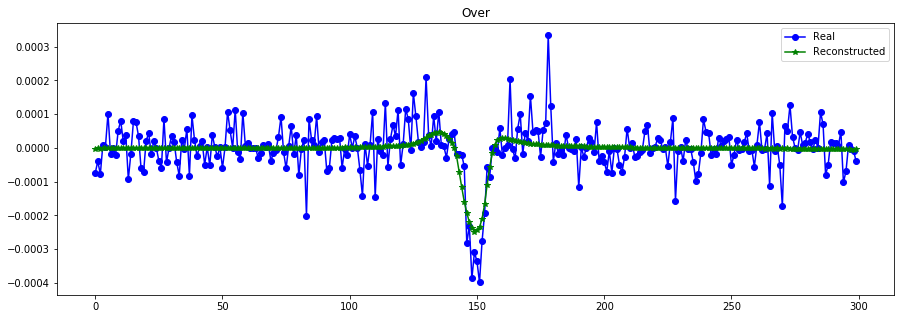

----------------------------------------------------------------
Real scale = 0.000147
Pred scale = 0.000238


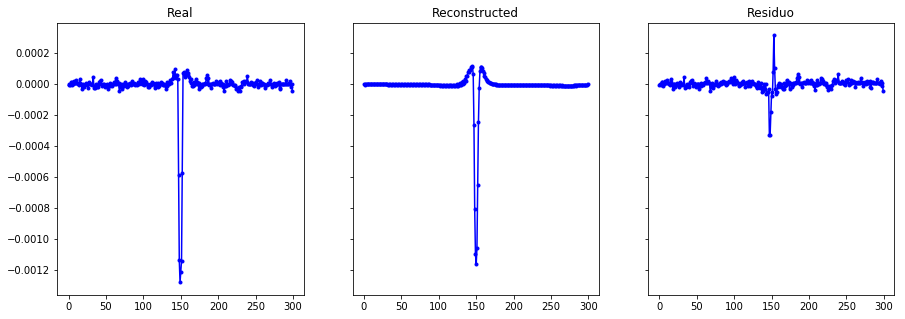

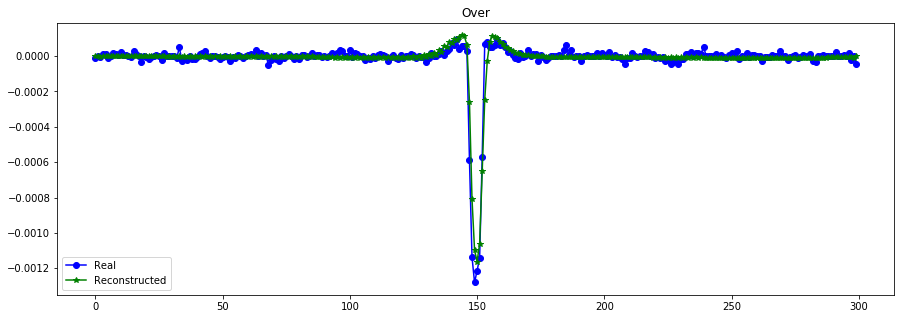

----------------------------------------------------------------
Real scale = 0.000146
Pred scale = 0.000176


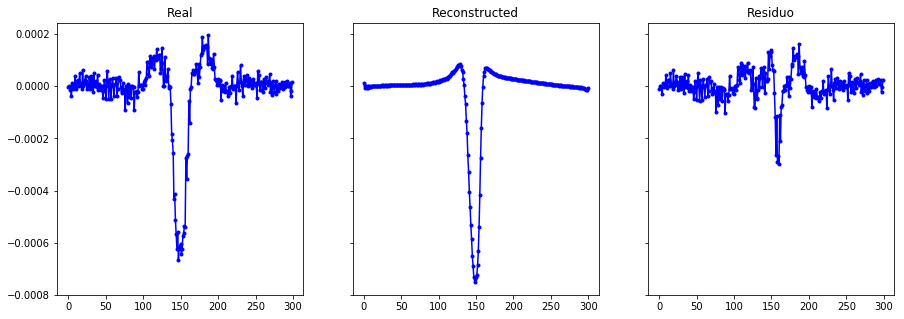

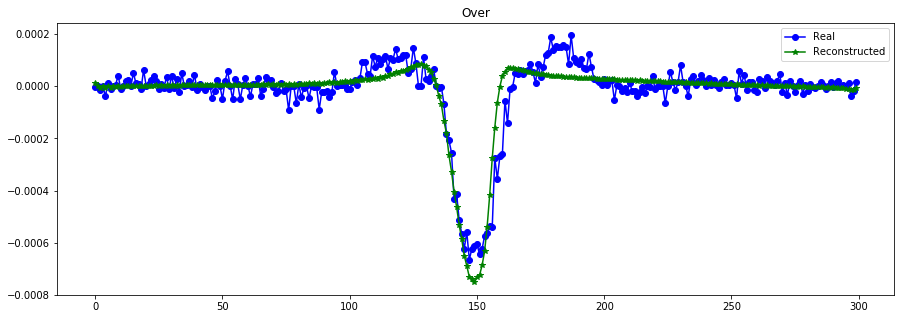

----------------------------------------------------------------
Real scale = 0.000725
Pred scale = 0.000697


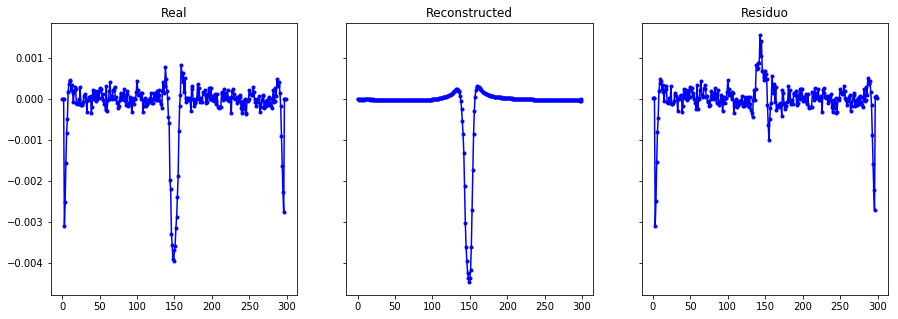

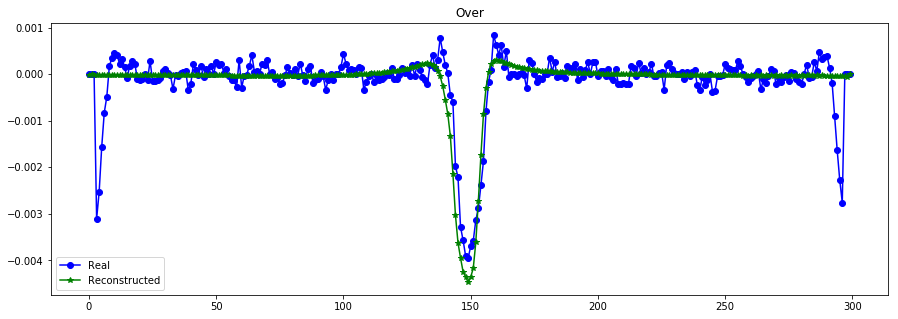

----------------------------------------------------------------
Real scale = 0.000016
Pred scale = 0.000013


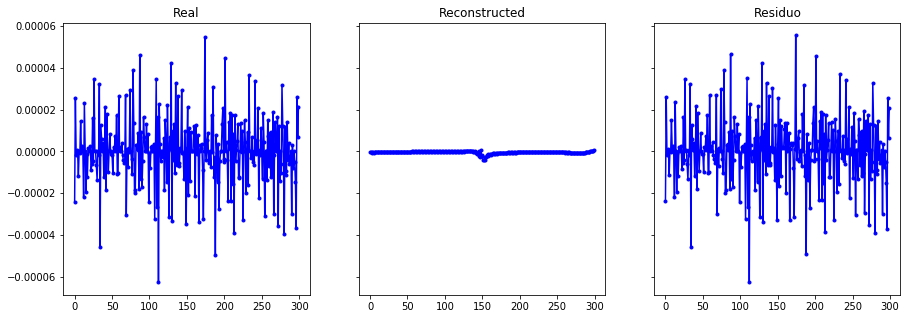

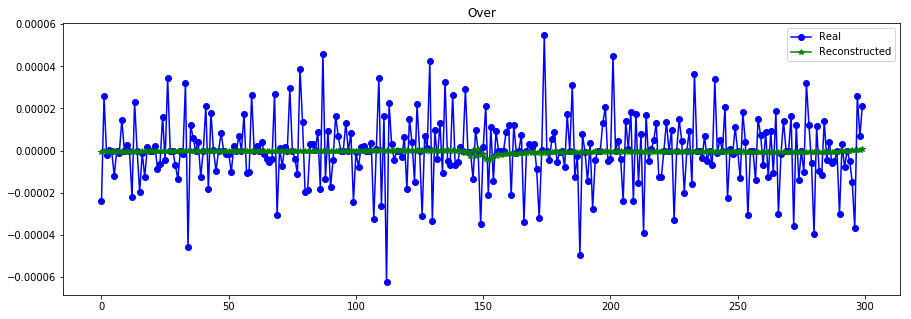

----------------------------------------------------------------
Real scale = 0.000015
Pred scale = 0.000021


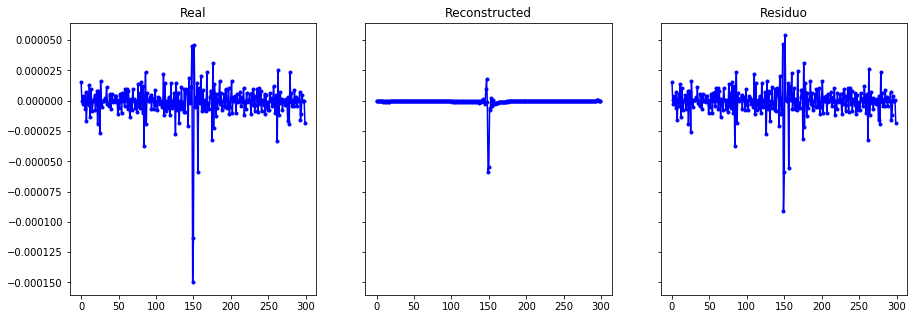

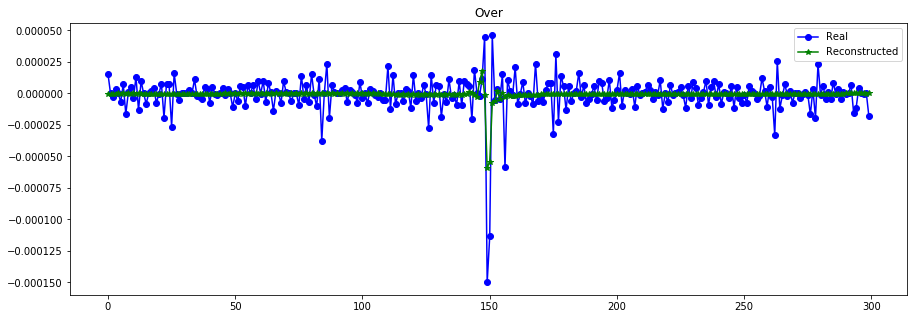

----------------------------------------------------------------
Real scale = 0.000028
Pred scale = 0.000023


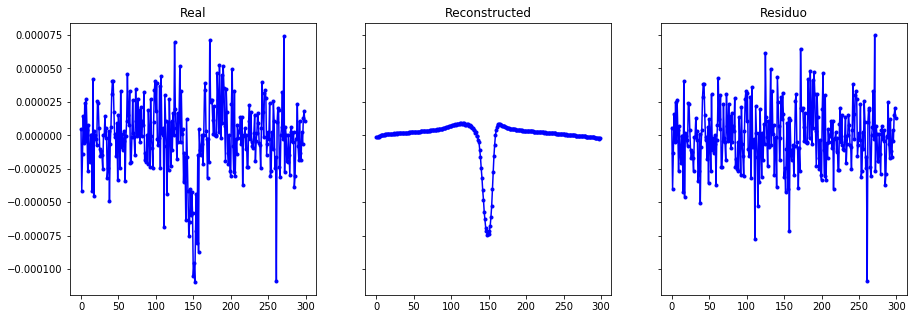

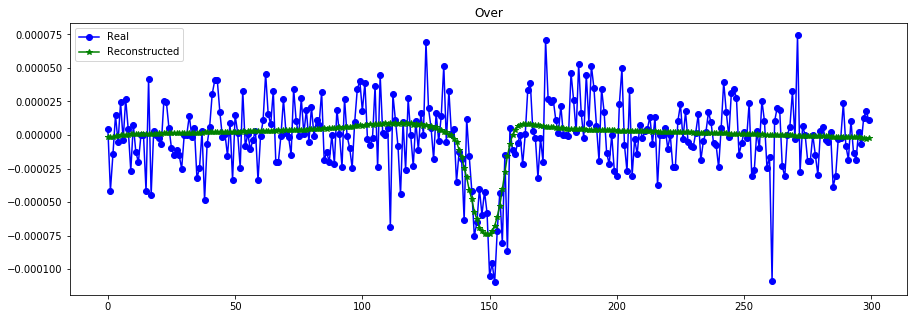

----------------------------------------------------------------
Real scale = 0.000040
Pred scale = 0.000039


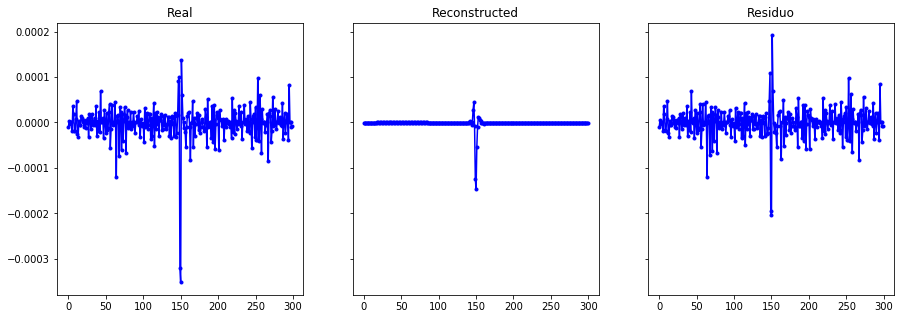

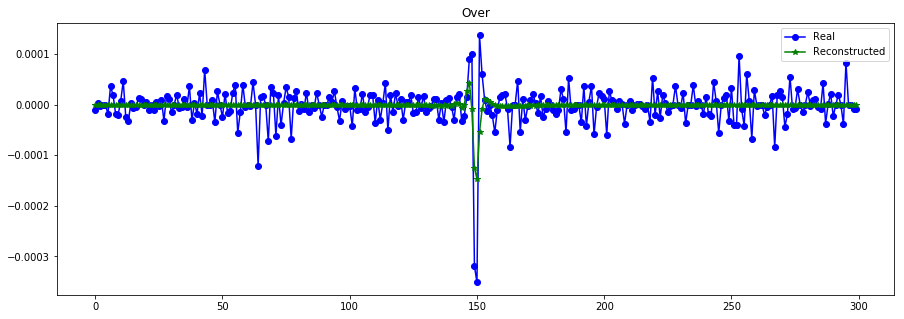

----------------------------------------------------------------
Real scale = 0.000046
Pred scale = 0.000059


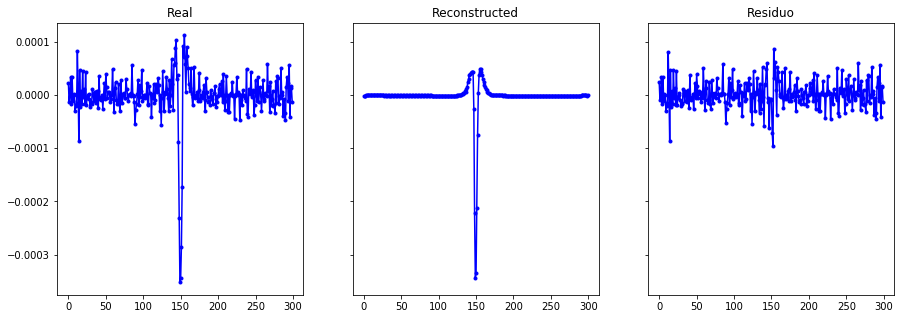

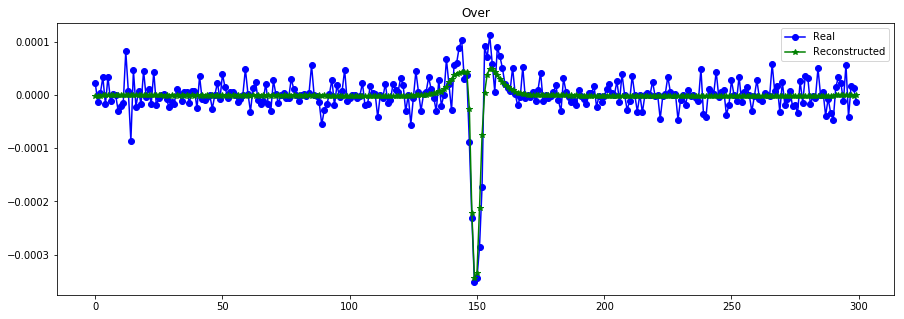

----------------------------------------------------------------
Real scale = 0.000059
Pred scale = 0.000082


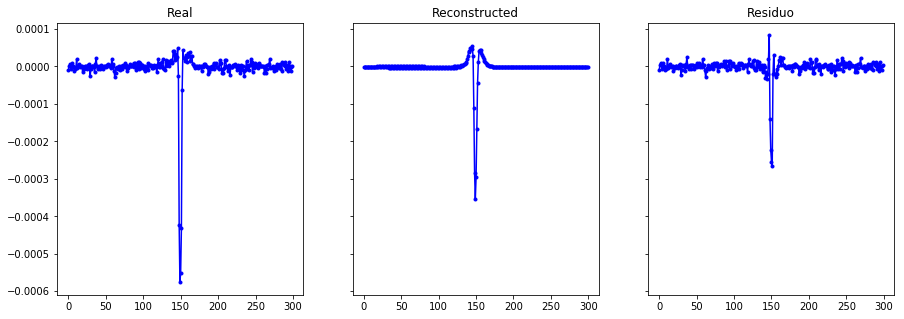

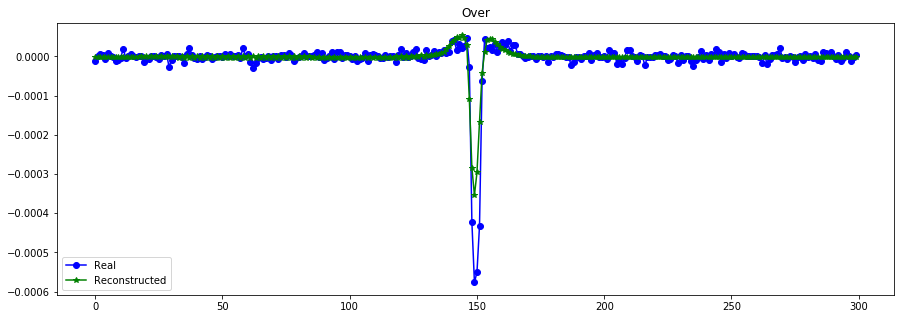

----------------------------------------------------------------
Real scale = 0.000022
Pred scale = 0.000017


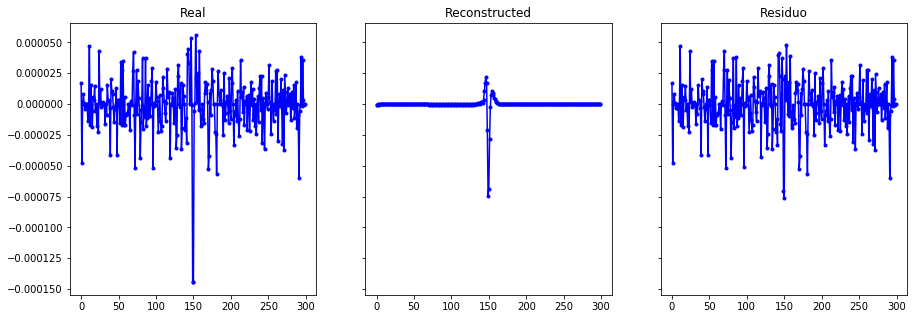

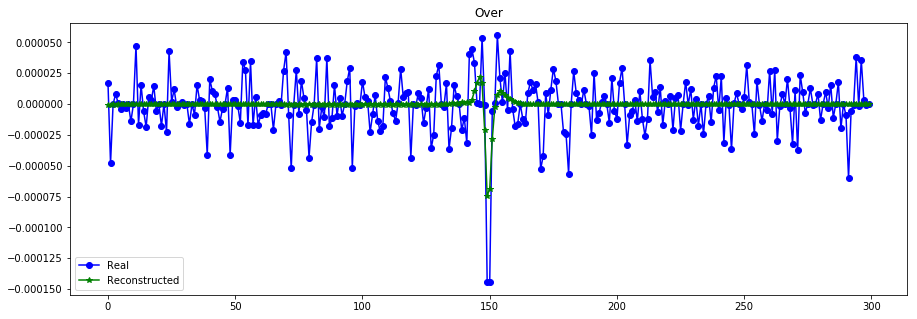

----------------------------------------------------------------
Real scale = 0.000049
Pred scale = 0.000061


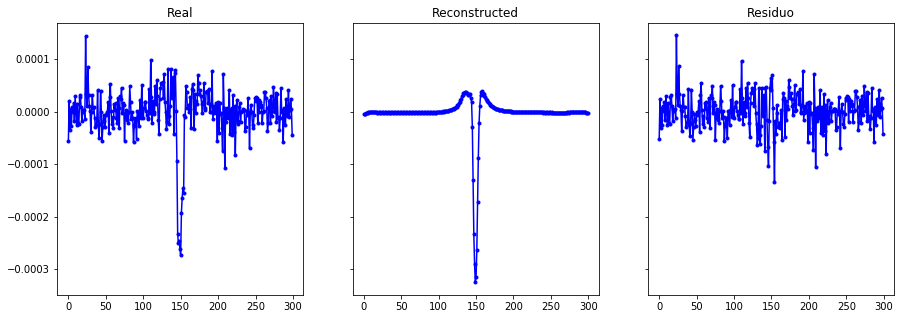

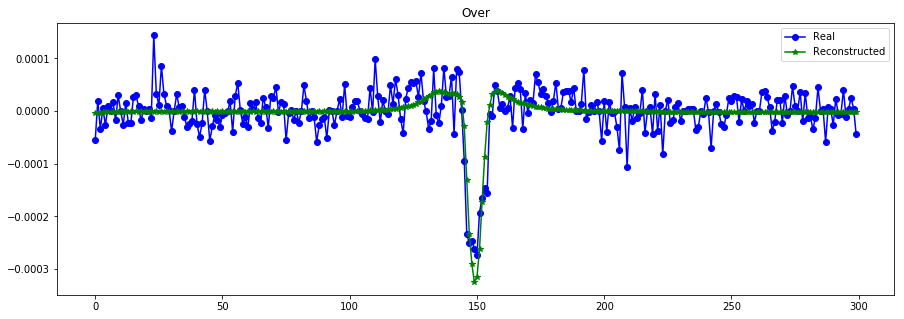

----------------------------------------------------------------
Real scale = 0.000059
Pred scale = 0.000078


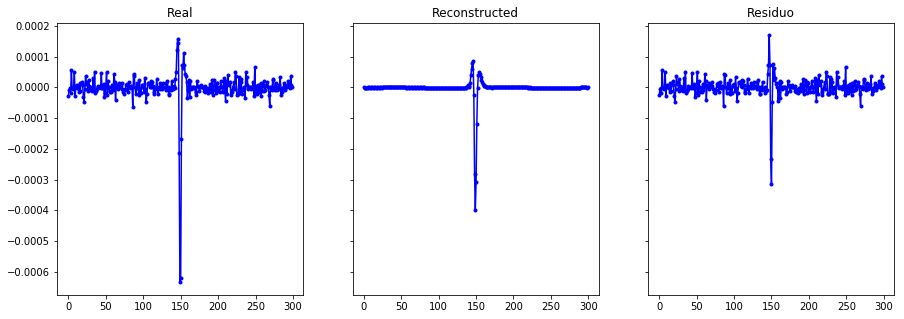

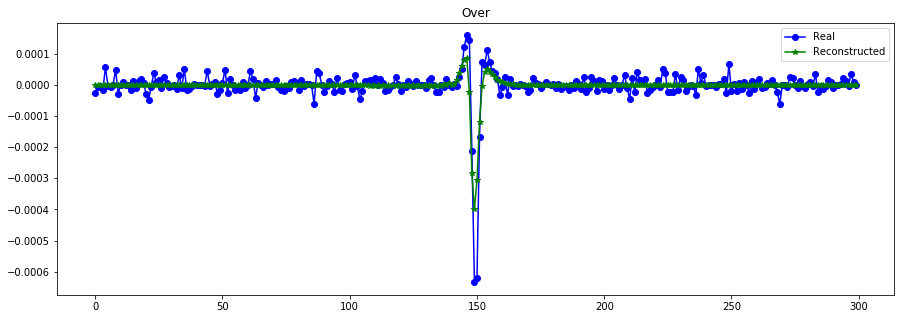

----------------------------------------------------------------


In [29]:
plot_n_lc(X_train[:N,:,0], X_train_hat, n= 15, s=[S_train[:N],S_train_hat]) #

### Vizualize encoded

In [33]:
def transform_plot(model, data, just_plot=False):
    if just_plot:
        to_plot = data
    else:
        to_plot = model.fit_transform(data)
        
    plt.figure(figsize=(10,7))
    plt.scatter(to_plot[:,0],to_plot[:,1])
    plt.show()
    return to_plot

df_meta = pd.read_csv("../../KOI_Data/kepler_dataset.csv")
labels_transit = df_meta["NExScI Disposition"].values[mask_transit]
all_labels = df_meta["NExScI Disposition"].values

In [36]:
X_train_all = X_fold_lc
X_train_t_all = X_fold_time

S_train_all = np.std(X_train_all, axis=1) #all data

X_train_all = np.expand_dims(X_train_all, axis=-1)
X_train_t_all = np.expand_dims(X_train_t_all, axis=-1)
X_train_t_all.shape

(8054, 300, 1)

/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


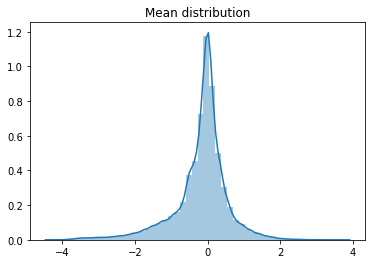

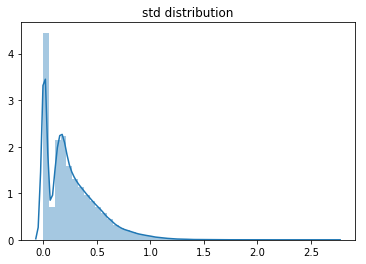

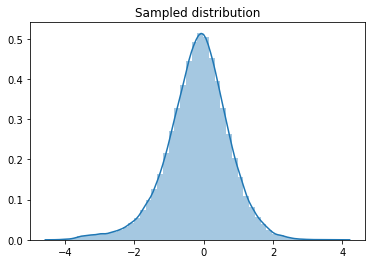

In [42]:
encoder_all = vae.get_layer("encoder")
z_aux, z_var_aux = encoder_all.predict([X_train_t_all,X_train_all, S_train_all], batch_size=512)

samp_model = define_samp_model(latent_dim) #model to sample
samp_encoder = Model(encoder_all.inputs, samp_model(encoder_all.outputs) )
z_samp = samp_encoder.predict([X_train_t_all, X_train_all, S_train_all], batch_size=512)

sns.distplot(z_aux.flatten())
plt.title("Mean distribution")
plt.show()

sns.distplot(np.exp(z_var_aux.flatten()))
plt.title("std distribution")
plt.show()

sns.distplot(z_samp.flatten())
plt.title("Sampled distribution")
plt.show()

/home/fmena/.local/lib/python3.5/site-packages/sklearn/utils/extmath.py:530: RuntimeWarning: invalid value encountered in multiply
  v *= signs[:, np.newaxis]


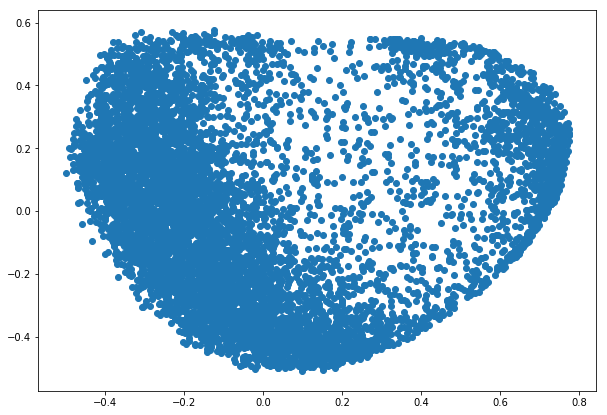

In [43]:
from sklearn.decomposition import KernelPCA
model = KernelPCA(2, kernel='rbf', gamma=None, n_jobs=-1)
    
to_plot = transform_plot(model, z_aux)

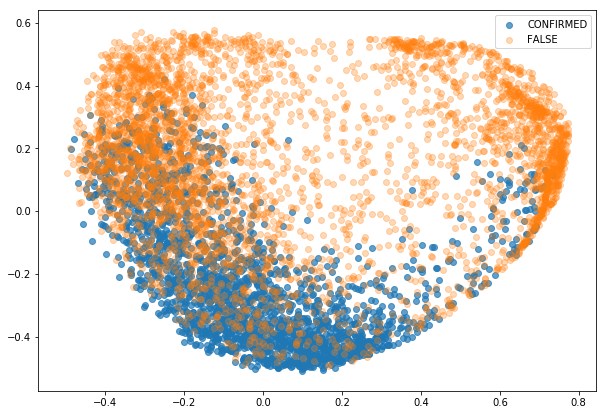

In [44]:
plt.figure(figsize=(10,7))
mask_ = (all_labels=="CONFIRMED")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="CONFIRMED", alpha=0.7)

mask_ = (all_labels=="FALSE POSITIVE")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="FALSE", alpha=0.3)

plt.legend()
plt.show()

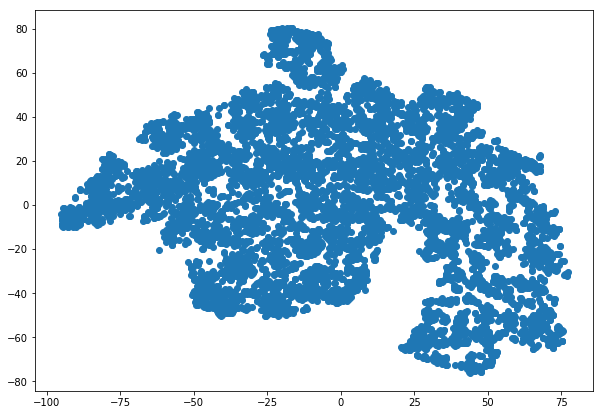

In [35]:
#tsne
from sklearn.manifold import TSNE
model = TSNE(2, metric='euclidean', n_jobs=-1)

to_plot = transform_plot(model, z_aux)

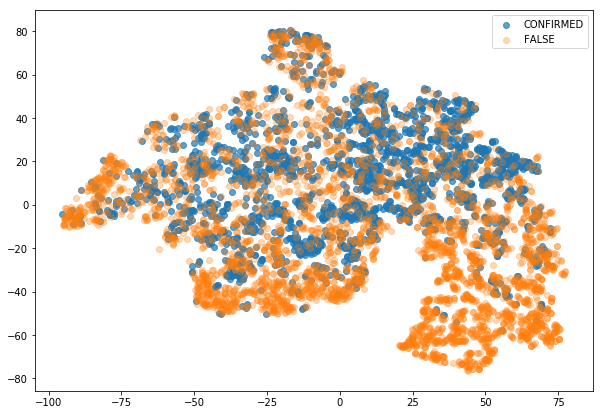

In [36]:
plt.figure(figsize=(10,7))
mask_ = (all_labels=="CONFIRMED")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="CONFIRMED", alpha=0.7)

mask_ = (all_labels=="FALSE POSITIVE")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="FALSE", alpha=0.3)

plt.legend()
plt.show()

In [45]:
np.save("./LC_features/VAE_S_%dT_%dD.npy"%(T,latent_dim), z_aux)
np.save("./LC_features/VAE_S_%dT_%dD_var.npy"%(T,latent_dim), z_var_aux)
#np.save("./LC_features/VAE_S_%dT_%dD_samp.npy"%(T,latent_dim), z_samp)
!ls ./LC_features

AE_300T_32D.npy		   MetadataLC.npy	   VAE_S_300T_32D_var.npy
FourierICA_300T_32D.npy    VAE_300T_32D.npy	   VAE_Sinv_300T_16D.npy
FourierICA_71427T_32D.npy  VAE_S_300T_16D.npy	   VAE_Sinv_300T_32D.npy
FourierPCA_300T_32D.npy    VAE_S_300T_16D_var.npy  VAE_S_klU_300T_32D.npy
FourierPCA_71427T_32D.npy  VAE_S_300T_32D.npy	   VAE_S_klU_300T_32D_var.npy


In [19]:
z_aux = np.load("./LC_features/VAE_S_%dT_%dD.npy"%(T,latent_dim))
z_aux.shape

(8054, 32)

### Clustering

In [34]:
#NEW METADATA SELECTED!
metadata_used = ["Period", "Duration", "Time of Transit Epoch", "r/R", "a/R",
                 "Inclination", "Impact Parameter", 
                 "Fitted Stellar Density","Teq",
                 "Limb Darkening Coeff1", "Limb Darkening Coeff2",
                "Teff","Stellar Radius", "Stellar Mass"]
df_meta["Duration"] = df_meta["Duration"]/24

df_meta_obj = df_meta[metadata_used]

#df_meta_obj = impute_on_pandas(df_meta_obj)

from sklearn.preprocessing import StandardScaler, RobustScaler
scaler_meta = StandardScaler()
scaler_meta.fit(df_meta_obj.values[mask_transit])

StandardScaler(copy=True, with_mean=True, with_std=True)

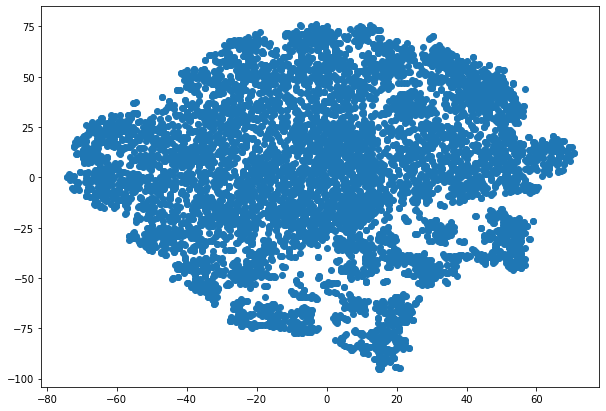

In [20]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE

to_clu = StandardScaler().fit_transform(z_aux)

model = TSNE(2, metric='euclidean', n_jobs=-1)
#model = KernelPCA(2, kernel='rbf', gamma=None, n_jobs=-1)

to_plot = transform_plot(model, to_clu)

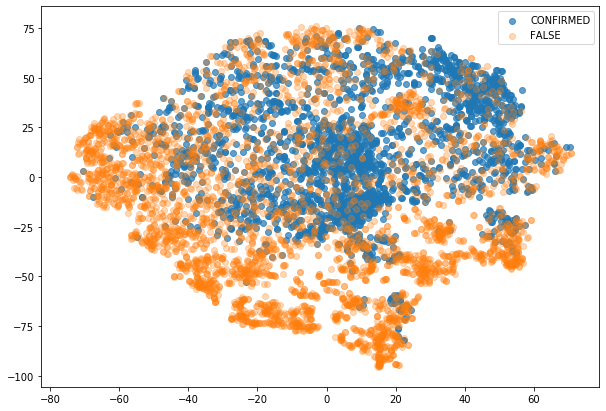

In [21]:
plt.figure(figsize=(10,7))
mask_ = (all_labels=="CONFIRMED")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="CONFIRMED", alpha=0.7)

mask_ = (all_labels=="FALSE POSITIVE")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="FALSE", alpha=0.3)

plt.legend()
plt.show()

In [51]:
from sklearn.cluster import DBSCAN
#model = DBSCAN(eps=0.8, min_samples=10, metric='euclidean', n_jobs=-1)
model = DBSCAN(eps=0.1, min_samples=10, metric='cosine', n_jobs=-1)

model.fit(to_clu)
clus_l = model.labels_
K = clus_l.max()+1

print("Cluster encontrados =",K)
clus_l

Cluster encontrados = 6


array([ 0, -1, -1, ..., -1, -1, -1])

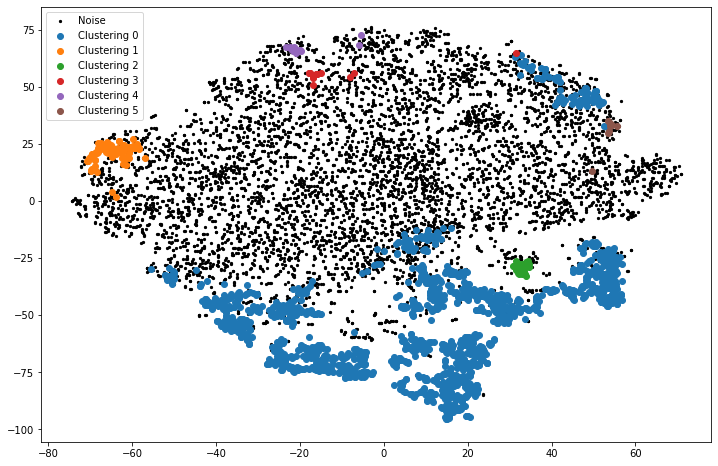

In [52]:
plt.figure(figsize=(12,8))
mask_ = (clus_l==-1)
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="Noise", s=5, c='black')

for i in range(K):
    mask_ = (clus_l==i)
    plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="Clustering "+str(i))
plt.legend()
plt.show() ## euclidean

In [ ]:
plt.figure(figsize=(12,8))
mask_ = (clus_l==-1)
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="Noise", s=5, c='black')

for i in range(K):
    mask_ = (clus_l==i)
    plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="Clustering "+str(i))
plt.legend()
plt.show() ## COSINE

In [25]:
from sklearn.cluster import DBSCAN
model = DBSCAN(eps=2.5, min_samples=10, metric='euclidean', n_jobs=-1)

model.fit(to_clu)
clus_l = model.labels_
K = clus_l.max()+1

print("Cluster encontrados =",K)
clus_l

Cluster encontrados = 2


array([ 0, -1, -1, ..., -1, -1, -1])

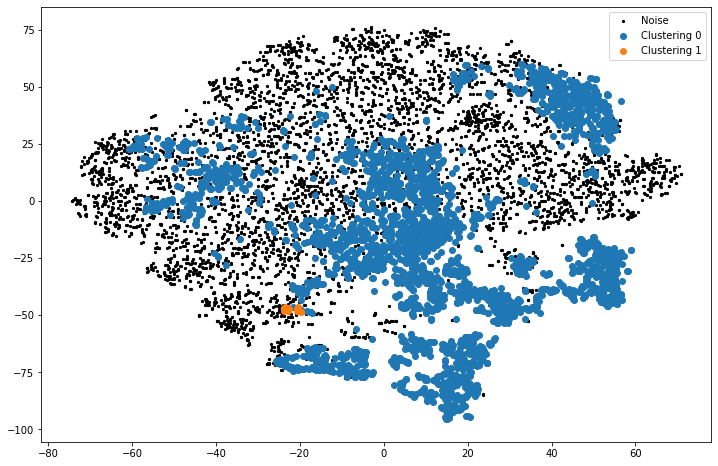

In [26]:
plt.figure(figsize=(12,8))
mask_ = (clus_l==-1)
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="Noise", s=5, c='black')

for i in range(K):
    mask_ = (clus_l==i)
    plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="Clustering "+str(i))
plt.legend()
plt.show()

#### clustering sobre FP


In [136]:
mask_FP = df_meta["NExScI Disposition"].values ==  "FALSE POSITIVE"
z_FP = z_aux[mask_FP]
aux = StandardScaler().fit_transform(z_FP)

Ks = []
for e in np.arange(0.1,3, 0.1):
    model = DBSCAN(eps=e, min_samples=5, metric='euclidean', n_jobs=-1)

    clus_l = model.fit(aux).labels_
    K = clus_l.max()+1
    Ks.append(K)

(2281, 32)

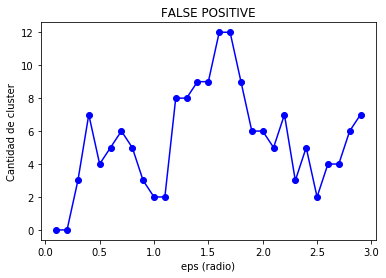

In [135]:
plt.plot(np.arange(0.1,3, 0.1),Ks , 'bo-')
plt.ylabel("Cantidad de cluster")
plt.xlabel("eps (radio)")
plt.title("FALSE POSITIVE")
plt.show()

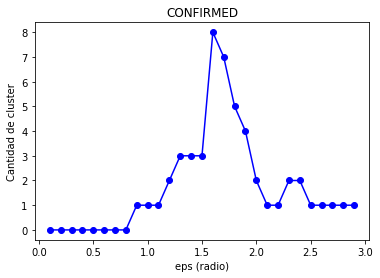

In [138]:
plt.plot(np.arange(0.1,3, 0.1),Ks, 'bo-')
plt.ylabel("Cantidad de cluster")
plt.xlabel("eps (radio)")
plt.title("CONFIRMED")
plt.show()

### Visualizar info de clusters

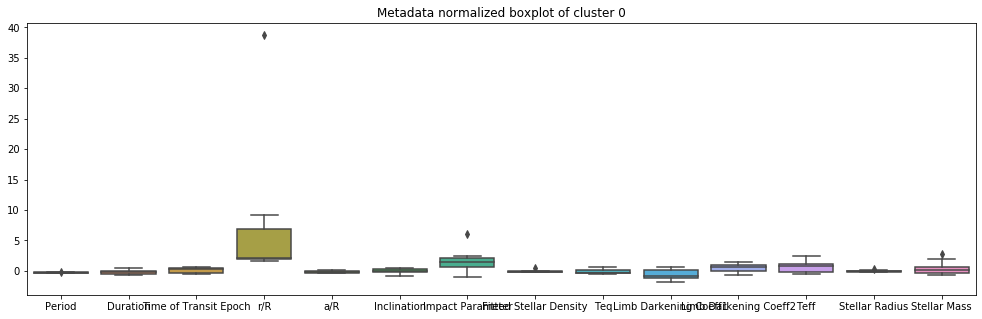

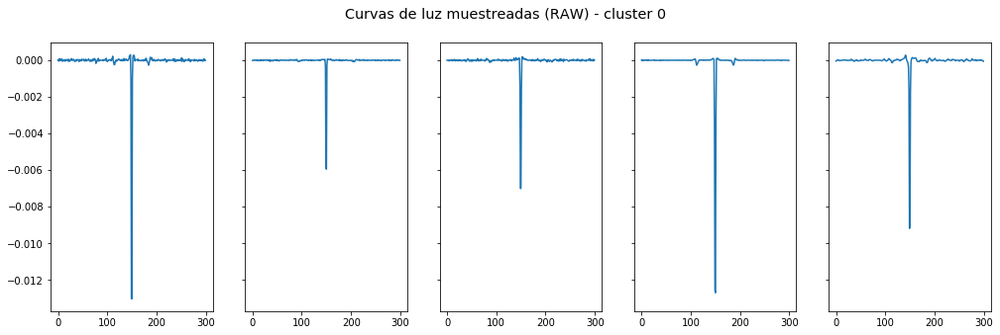

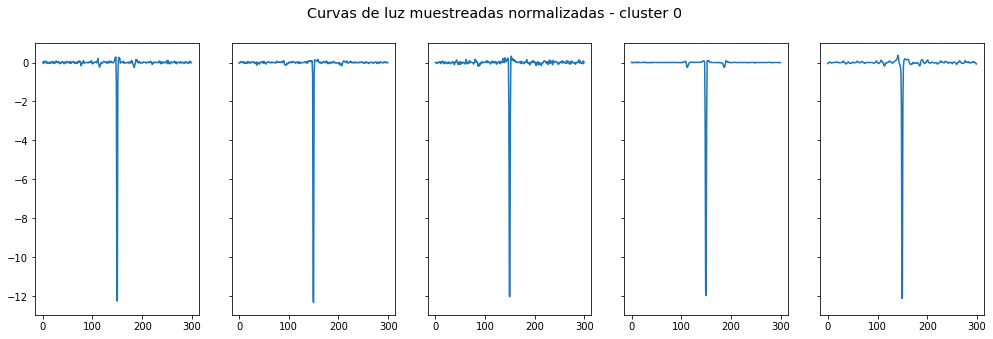

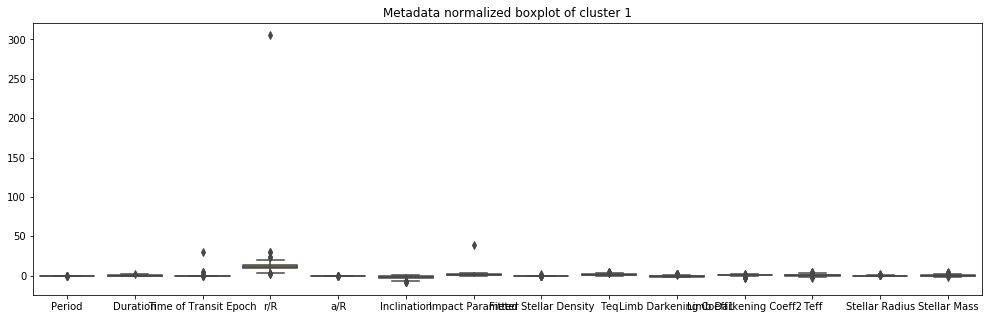

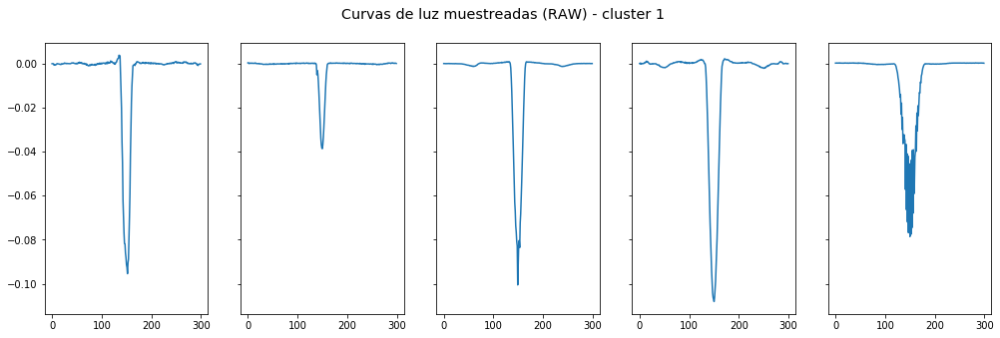

...

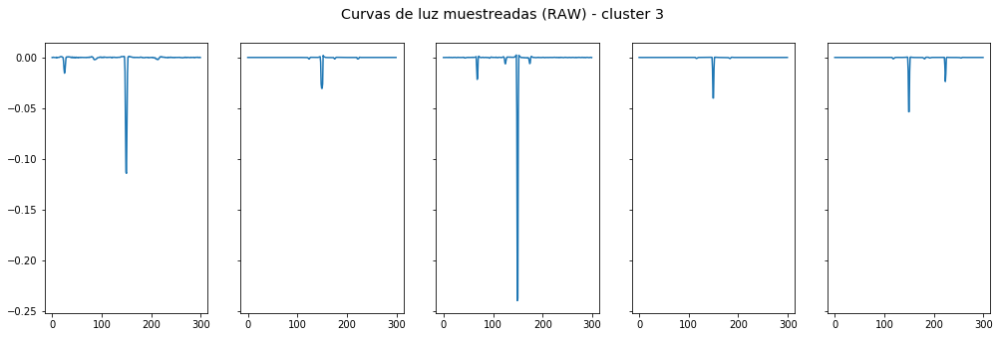

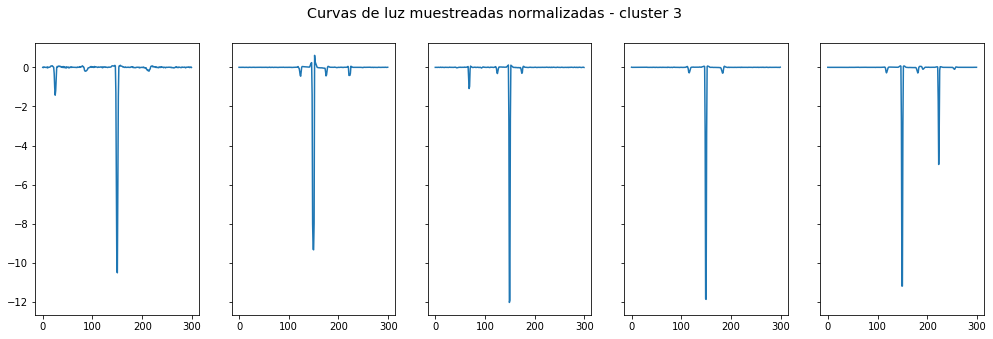

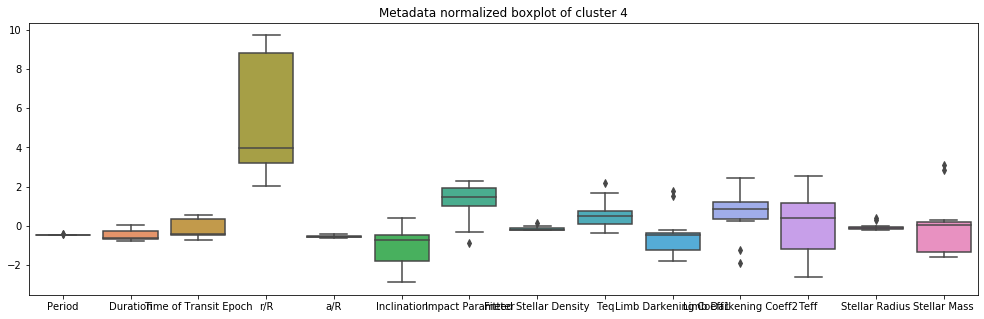

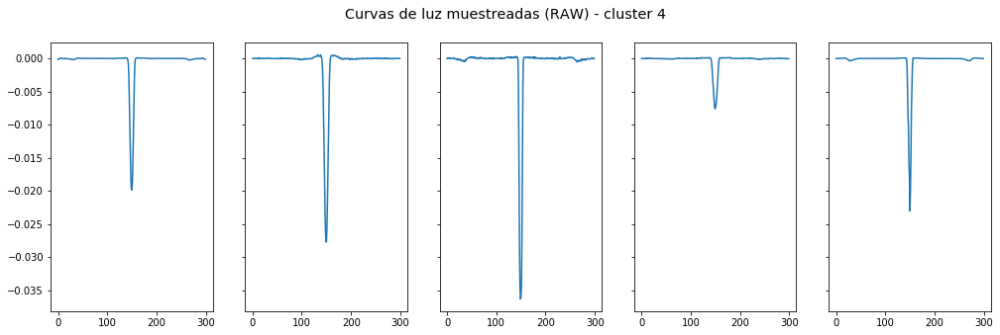

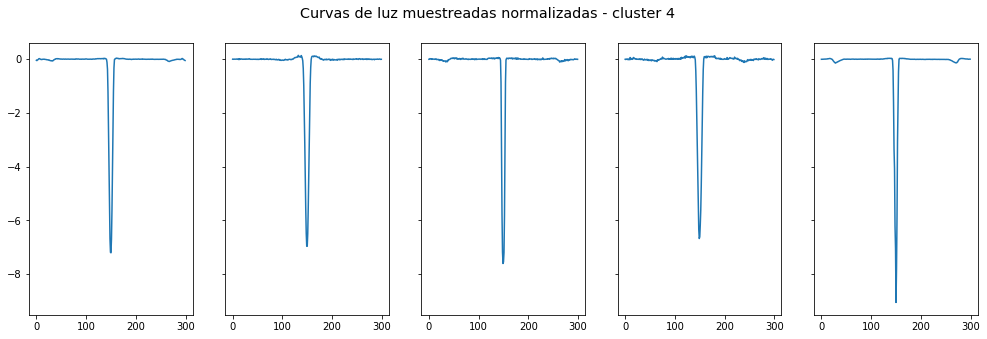

In [42]:
mask_noise = (clus_l==-1)


n_s = 5

N_is = []
conf_ratios = []
cand_ratios = []
mean_metadatas = []
for i in range(K):
    mask_i = (clus_l==i)

    N_i = np.sum(mask_i*1)
    N_is.append(N_i)
    conf_ratio = np.sum(all_labels[mask_i]=="CONFIRMED") 
    CONF_ratio = conf_ratio/(conf_ratio+np.sum(all_labels[mask_i]=="FALSE POSITIVE")) #over conf and FP
    conf_ratios.append(CONF_ratio)
    CAND_ratio = np.sum(all_labels[mask_i]=="CANDIDATE")/N_i #total
    cand_ratios.append(CAND_ratio)
    metadata_i = df_meta_obj[mask_i]
    mean_metadata = metadata_i.mean().to_frame().T
    mean_metadatas.append(mean_metadata)

    #display(df_clus_i)

    aux = metadata_i.copy()
    aux[:] = scaler_meta.transform(metadata_i)
    plt.figure(figsize=(17,5))
    sns.boxplot(data=aux)
    plt.title("Metadata normalized boxplot of cluster "+str(i))
    plt.show()

    idx_i = np.arange(X_train_all.shape[0])[mask_i]
    idx_i_sampled = np.random.choice(idx_i,size=n_s,replace=False)

    f, axx = plt.subplots(1, n_s, sharex=False, sharey=True,figsize= (17,5))
    for n in range(n_s):
        axx[n].plot(X_train_all[idx_i_sampled[n]])
    #plt.ylim(-1)
    f.suptitle("Curvas de luz muestreadas (RAW) - cluster "+str(i), fontsize="x-large")
    plt.show()

    X_aux = X_train_all[:,:,0]/S_train_all[:,None]
    f, axx = plt.subplots(1, n_s, sharex=False, sharey=True,figsize= (17,5))
    for n in range(n_s):
        axx[n].plot(X_aux[idx_i_sampled[n]])
    f.suptitle("Curvas de luz muestreadas normalizadas - cluster "+str(i), fontsize="x-large")
    plt.show()

In [43]:
df_clus_i = pd.DataFrame({'#data':N_is, 'CONF_ratio':conf_ratios,'CAND_ratio':cand_ratios})
df_clus_i = pd.concat([df_clus_i, pd.concat(mean_metadatas,ignore_index=True)], axis=1)
df_clus_i

,#data,CONF_ratio,CAND_ratio,Period,Duration,Time of Transit Epoch,r/R,a/R,Inclination,Impact Parameter,Fitted Stellar Density,Teq,Limb Darkening Coeff1,Limb Darkening Coeff2,Teff,Stellar Radius,Stellar Mass
0,11,0.444444,0.181818,11.860904,0.136144,157.473932,0.313636,22.630091,87.135455,0.956000,2.478501,886.000000,0.368364,0.275364,6003.000000,1.149182,1.069273
1,188,0.011299,0.058511,1.626363,0.181598,142.492173,0.573011,3.859011,74.488085,0.881963,0.819438,1873.750000,0.361995,0.277043,5991.101064,1.305340,1.027037
2,132,0.087302,0.045455,27.884384,0.206135,161.340810,0.423758,45.200621,88.697727,0.892977,3.430112,668.719697,0.375909,0.272864,5835.795455,1.175811,0.990788
3,27,0.000000,0.000000,14.289256,0.225885,137.469571,0.498222,25.642778,88.287407,0.757000,2.285721,847.925926,0.371111,0.270963,5923.703704,1.229667,0.990185
4,13,0.307692,0.000000,2.859495,0.108868,145.057766,0.251846,7.313231,81.934615,0.843846,1.473725,1292.615385,0.375308,0.282846,5516.461538,1.126154,0.960231


#### Coseno

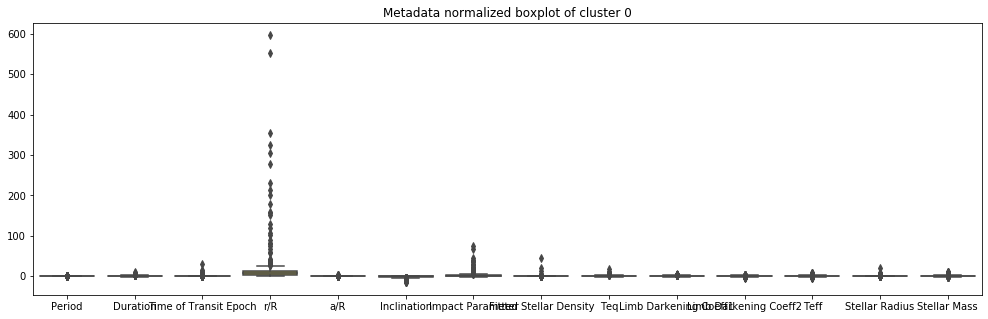

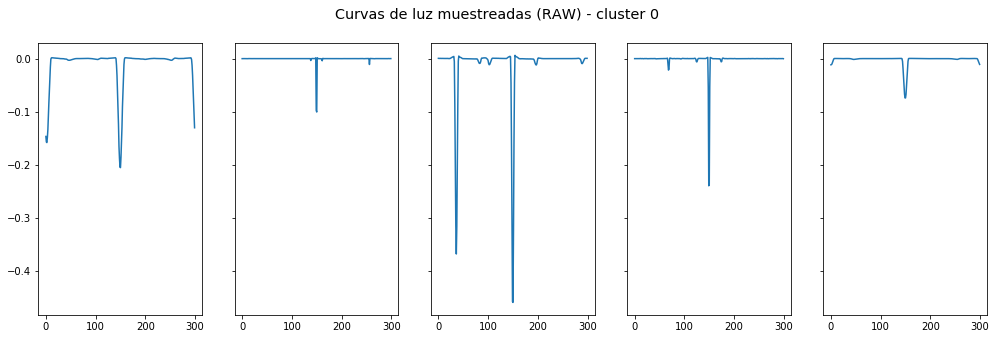

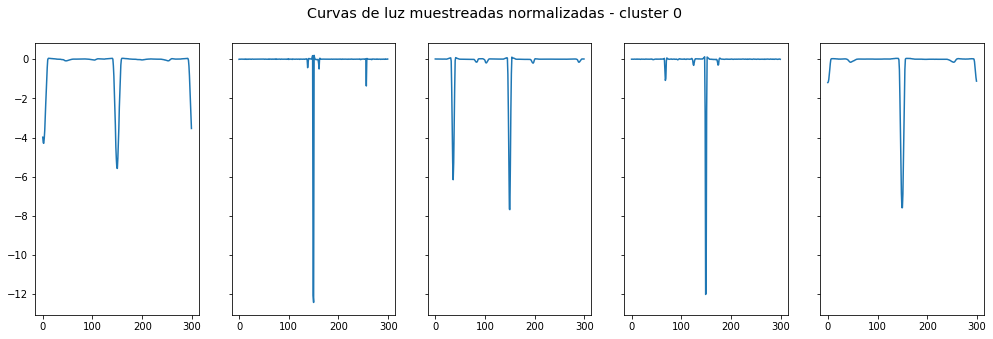

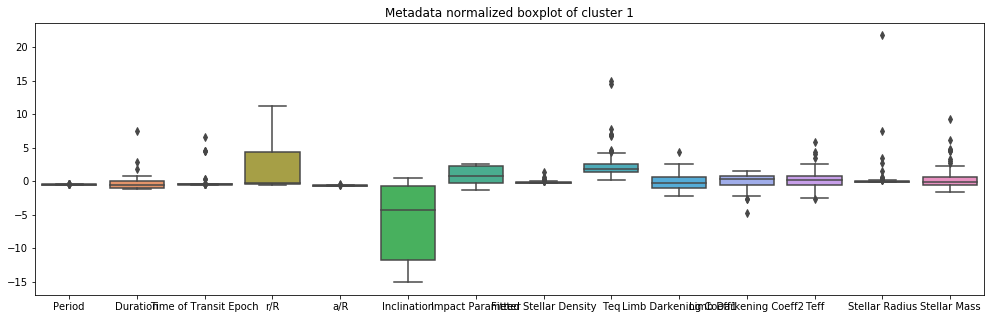

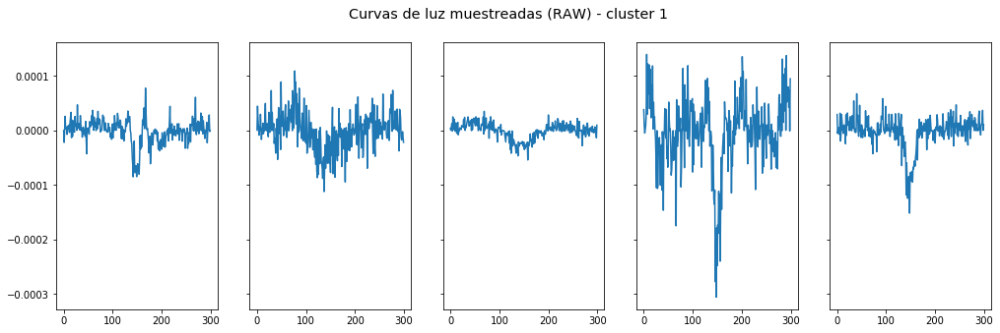

...

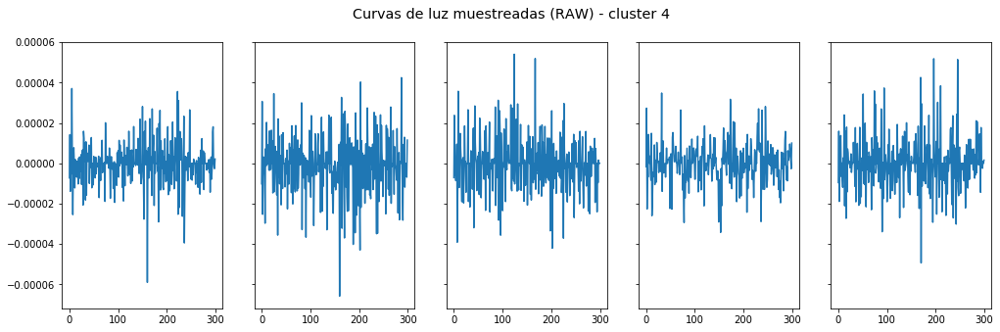

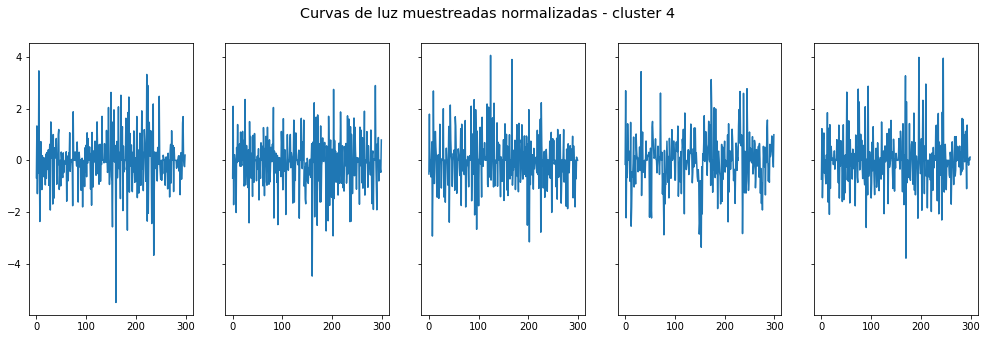

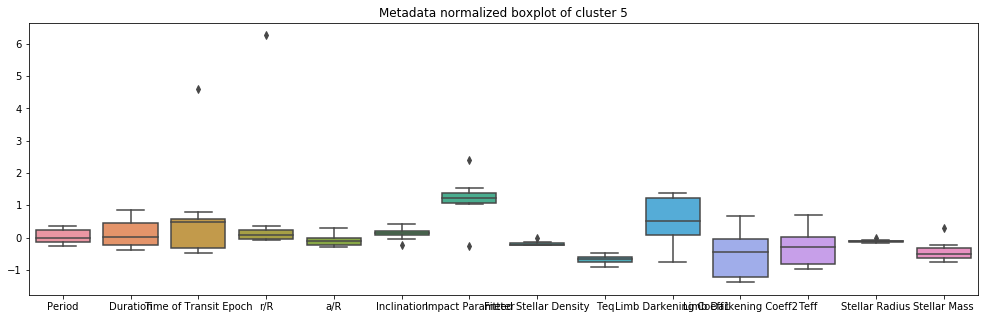

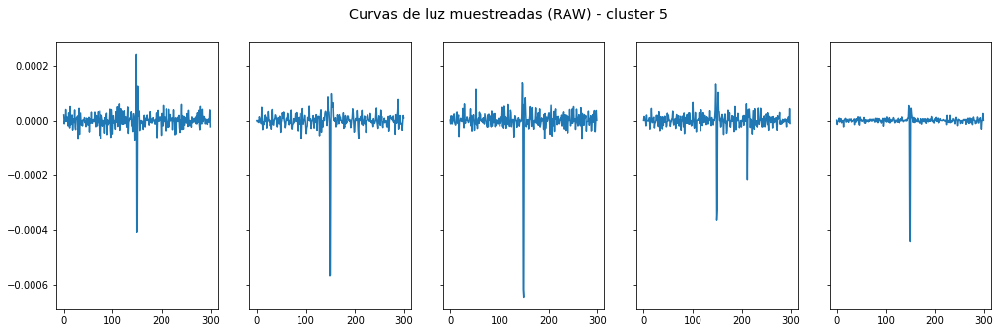

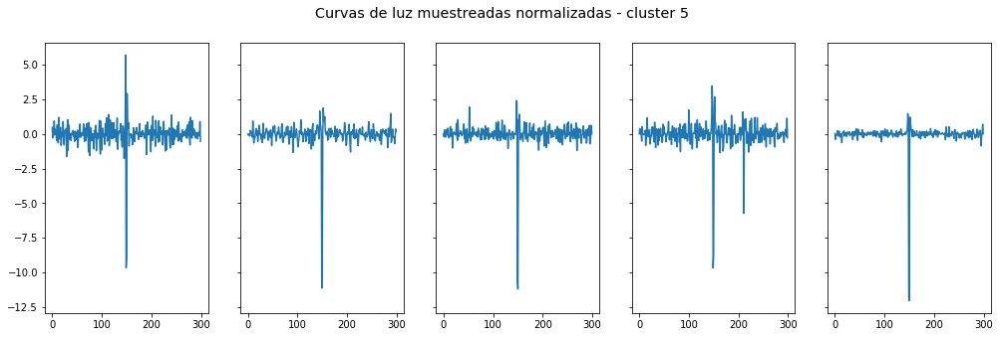

In [54]:
mask_noise = (clus_l==-1)


n_s = 5

N_is = []
conf_ratios = []
cand_ratios = []
mean_metadatas = []
for i in range(K):
    mask_i = (clus_l==i)

    N_i = np.sum(mask_i*1)
    N_is.append(N_i)
    conf_ratio = np.sum(all_labels[mask_i]=="CONFIRMED") 
    CONF_ratio = conf_ratio/(conf_ratio+np.sum(all_labels[mask_i]=="FALSE POSITIVE")) #over conf and FP
    conf_ratios.append(CONF_ratio)
    CAND_ratio = np.sum(all_labels[mask_i]=="CANDIDATE")/N_i #total
    cand_ratios.append(CAND_ratio)
    metadata_i = df_meta_obj[mask_i]
    mean_metadata = metadata_i.mean().to_frame().T
    mean_metadatas.append(mean_metadata)

    #display(df_clus_i)

    aux = metadata_i.copy()
    aux[:] = scaler_meta.transform(metadata_i)
    plt.figure(figsize=(17,5))
    sns.boxplot(data=aux)
    plt.title("Metadata normalized boxplot of cluster "+str(i))
    plt.show()

    idx_i = np.arange(X_train_all.shape[0])[mask_i]
    idx_i_sampled = np.random.choice(idx_i,size=n_s,replace=False)

    f, axx = plt.subplots(1, n_s, sharex=False, sharey=True,figsize= (17,5))
    for n in range(n_s):
        axx[n].plot(X_train_all[idx_i_sampled[n]])
    #plt.ylim(-1)
    f.suptitle("Curvas de luz muestreadas (RAW) - cluster "+str(i), fontsize="x-large")
    plt.show()

    X_aux = X_train_all[:,:,0]/S_train_all[:,None]
    f, axx = plt.subplots(1, n_s, sharex=False, sharey=True,figsize= (17,5))
    for n in range(n_s):
        axx[n].plot(X_aux[idx_i_sampled[n]])
    f.suptitle("Curvas de luz muestreadas normalizadas - cluster "+str(i), fontsize="x-large")
    plt.show()

In [55]:
df_clus_i = pd.DataFrame({'#data':N_is, 'CONF_ratio':conf_ratios,'CAND_ratio':cand_ratios})
df_clus_i = pd.concat([df_clus_i, pd.concat(mean_metadatas,ignore_index=True)], axis=1)
df_clus_i

,#data,CONF_ratio,CAND_ratio,Period,Duration,Time of Transit Epoch,r/R,a/R,Inclination,Impact Parameter,Fitted Stellar Density,Teq,Limb Darkening Coeff1,Limb Darkening Coeff2,Teff,Stellar Radius,Stellar Mass
0,1712,0.160173,0.055491,9.669726,0.187538,147.789748,0.435292,15.762959,79.718637,0.839143,2.518578,1388.155699,0.383967,0.266305,5870.941246,1.521435,1.045075
1,89,0.075949,0.112360,0.711474,0.123908,144.097512,0.088852,2.282602,56.933977,0.717909,1.539323,2502.863636,0.423795,0.241614,5713.318182,2.847000,1.082636
2,37,0.000000,0.000000,68.975859,0.397242,176.881845,0.798703,81.565432,88.959189,1.086838,6.343856,466.594595,0.395946,0.262216,5715.216216,0.984270,0.914622
3,14,0.600000,0.285714,74.263975,0.246240,178.179443,0.021643,72.618571,88.115000,0.654857,2.546756,512.857143,0.412429,0.253929,5692.285714,1.001500,0.957429
4,15,0.200000,0.333333,224.343194,0.369570,247.278755,0.046467,231.866000,89.610667,0.393467,12.582538,446.333333,0.411400,0.253467,5672.866667,2.093067,1.027667
5,8,0.625000,0.000000,28.663320,0.183787,186.504263,0.061750,27.828750,88.026250,0.840625,0.982650,541.500000,0.482500,0.210375,5339.125000,0.867000,0.852000
